<a href="https://colab.research.google.com/github/Artyom-G/ML-Image-Sorter/blob/main/Categorical_Image_Identifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**How to Use:**

Images for training must be put in a training folder with a separate subfolder for each class inside.

Images for testing must be in a testing folder.

Paths to your training and testing folders' paths must be assigned below.

Run this to Set Your Variables.

In [3]:
#Image Size After Resizing
img_resize = 70
#Number of Epochs (increase to get higher accuracy)
epochs = 10
#Batch Size
batch_size = 3
#Steps for Each Epoch
steps_per_epoch = 3
#Training Folder Path
training_path = "/content/drive/MyDrive/Colab Notebooks/Categorical Image Classifier/training"
#Testing Folder Path
testing_path = "/content/drive/MyDrive/Colab Notebooks/Categorical Image Classifier/testing"
#Saving and Loading Model Path
modelFolder = "/content/drive/MyDrive/Colab Notebooks/Categorical Image Classifier/test 2024/04/13"
#Grayscale
grayscale = False
#Horizontal Flip
horizontal_flip = True
#Vertical Flip
vertical_flip = True

from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Run this to Train the Model

Found 2883 images belonging to 4 classes.
Found 720 images belonging to 4 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 70, 70, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 35, 35, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 35, 35, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 17, 17, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 17, 17, 64)        18496     
                                       

Epoch 1/10
3/3 [==============================] - 268s 133s/step - loss: 6.6794 - accuracy: 0.3333 - val_loss: 5.8986 - val_accuracy: 0.3153
Epoch 2/10
3/3 [==============================] - 12s 6s/step - loss: 5.6735 - accuracy: 0.1111 - val_loss: 5.0878 - val_accuracy: 0.2500
Epoch 3/10
3/3 [==============================] - 10s 4s/step - loss: 4.7673 - accuracy: 0.3333 - val_loss: 4.6319 - val_accuracy: 0.2819
Epoch 4/10
3/3 [==============================] - 13s 6s/step - loss: 4.5785 - accuracy: 0.2222 - val_loss: 4.1028 - val_accuracy: 0.2500
Epoch 5/10
3/3 [==============================] - 9s 5s/step - loss: 4.0731 - accuracy: 0.1111 - val_loss: 3.7120 - val_accuracy: 0.2514
Epoch 6/10
3/3 [==============================] - 13s 6s/step - loss: 3.5799 - accuracy: 0.5556 - val_loss: 3.3995 - val_accuracy: 0.2528
Epoch 7/10
3/3 [==============================] - 13s 6s/step - loss: 3.3521 - accuracy: 0.0000e+00 - val_loss: 3.1268 - val_accuracy: 0.2500
Epoch 8/10
3/3 [============

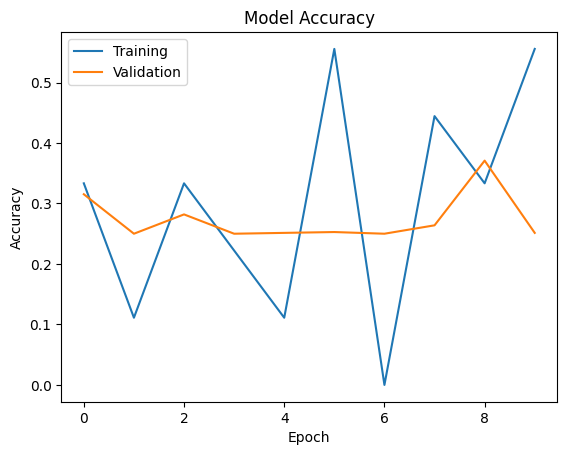

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop

if grayscale:
  color_mode = 'grayscale'
  channels = 1
else:
  color_mode = 'rgb'
  channels = 3

train = ImageDataGenerator(rescale=1/255, validation_split=0.2, horizontal_flip = horizontal_flip, vertical_flip = vertical_flip)
validation = ImageDataGenerator(rescale=1/255, validation_split=0.2, horizontal_flip = horizontal_flip, vertical_flip = vertical_flip)
train_dataset = train.flow_from_directory(training_path,target_size=(img_resize,img_resize), color_mode=color_mode, batch_size = batch_size, class_mode='categorical', subset='training')
validation_dataset = train.flow_from_directory(training_path,target_size=(img_resize,img_resize), color_mode=color_mode, batch_size = batch_size, class_mode='categorical', subset='validation')

def augment(_image, _label):
  _image = tf.image.random_brightness(_image, max_delta=0.1)
  _image = tf.image.random_contrast(_image, lower=0.1, upper=0.2)

  _image = tf.image.random_flip_left_right(_image)

  return _image, _label

folderList = os.listdir(training_path)
folderList = sorted(folderList)
num_of_classes = len(folderList)

model = tf.keras.models.Sequential([
                                    tf.keras.layers.Conv2D(16,3,activation="relu", input_shape=(img_resize,img_resize,channels), padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
                                    tf.keras.layers.MaxPooling2D(2,2),
                                    tf.keras.layers.Conv2D(32,3,activation="relu", padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
                                    tf.keras.layers.MaxPooling2D(2,2),
                                    tf.keras.layers.Conv2D(64,3,activation="relu", padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
                                    tf.keras.layers.MaxPooling2D(2,2),
                                    tf.keras.layers.Flatten(),
                                    tf.keras.layers.Dense(256, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.01)),
                                    tf.keras.layers.Dropout(0.5),
                                    tf.keras.layers.Dense(num_of_classes,activation="softmax")
])

model.summary()
model.compile(loss = "categorical_crossentropy", optimizer = RMSprop(lr=0.001),metrics=['accuracy'])

hist = model.fit(train_dataset,
                      steps_per_epoch=steps_per_epoch,
                      epochs = epochs,
                      validation_data=validation_dataset
                      )

plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

Run this to Save Your Model

In [4]:
model.save(modelFolder)

Run this to Load Your Model

Epoch 1/5
5/5 [==============================] - 12s 3s/step - loss: 2.4485 - accuracy: 0.2667 - val_loss: 2.1573 - val_accuracy: 0.3208
Epoch 2/5
5/5 [==============================] - 14s 3s/step - loss: 2.0938 - accuracy: 0.4667 - val_loss: 1.9547 - val_accuracy: 0.2722
Epoch 3/5
5/5 [==============================] - 15s 4s/step - loss: 1.9709 - accuracy: 0.2667 - val_loss: 1.8378 - val_accuracy: 0.3333
Epoch 4/5
5/5 [==============================] - 14s 3s/step - loss: 1.8143 - accuracy: 0.4000 - val_loss: 1.7503 - val_accuracy: 0.3167
Epoch 5/5
5/5 [==============================] - 10s 2s/step - loss: 1.7392 - accuracy: 0.2667 - val_loss: 1.6850 - val_accuracy: 0.4125


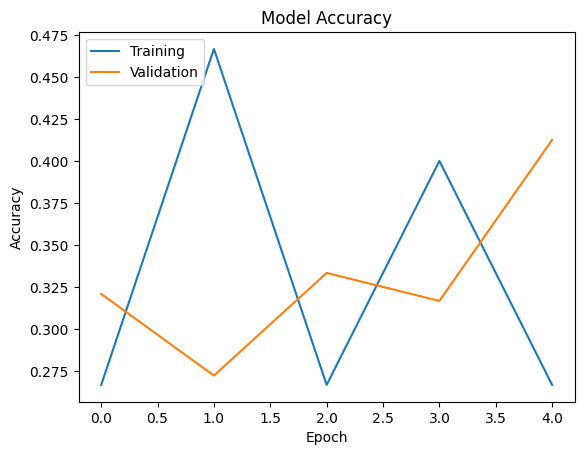

In [5]:
model = tf.keras.models.load_model(modelFolder)
hist = model.fit(train_dataset,
                      steps_per_epoch=5,
                      epochs = 5,
                      validation_data=validation_dataset
                      )

plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

Run this to Test Your Model

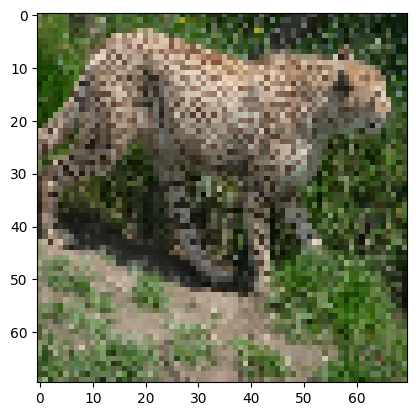

1/1 [==============================] - 0s 149ms/step
jaguar




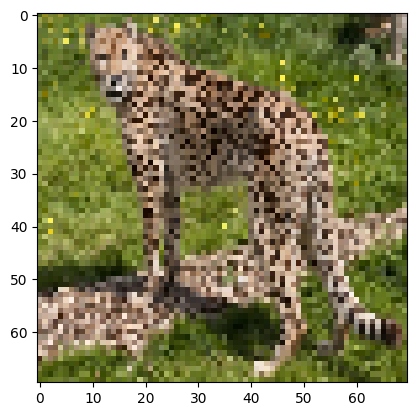

1/1 [==============================] - 0s 26ms/step
jaguar




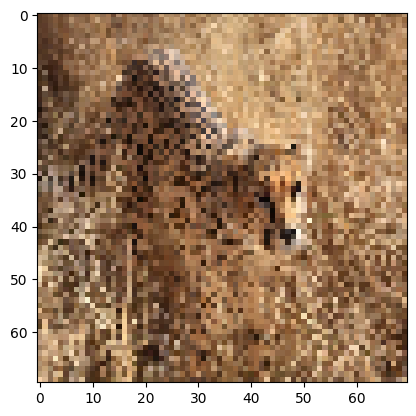

1/1 [==============================] - 0s 40ms/step
jaguar




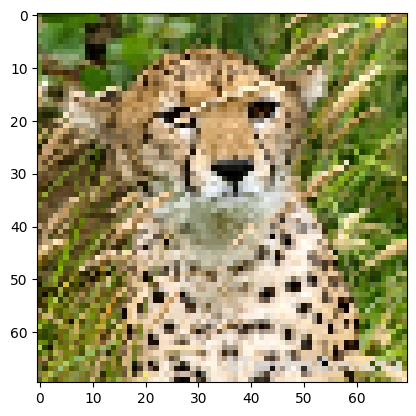

1/1 [==============================] - 0s 35ms/step
jaguar




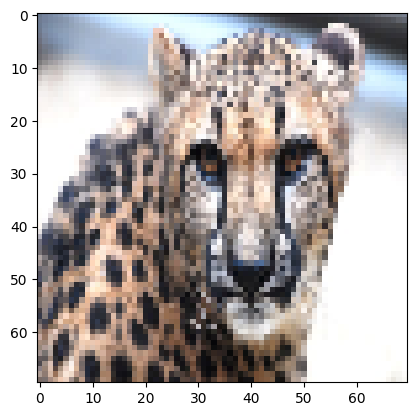

1/1 [==============================] - 0s 96ms/step
jaguar




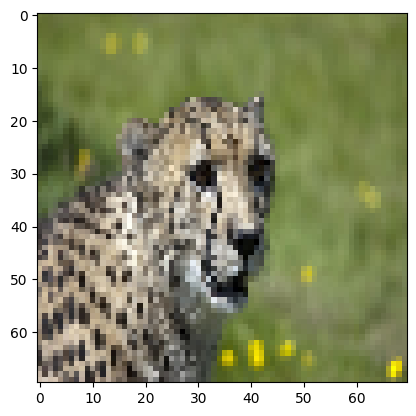

1/1 [==============================] - 0s 27ms/step
jaguar




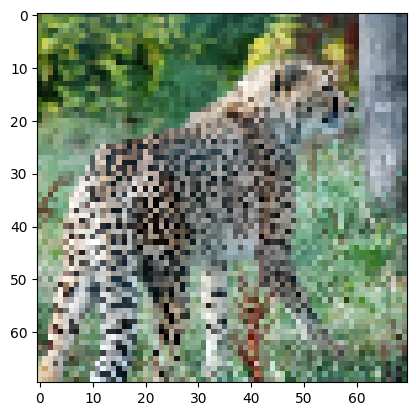

1/1 [==============================] - 0s 27ms/step
jaguar




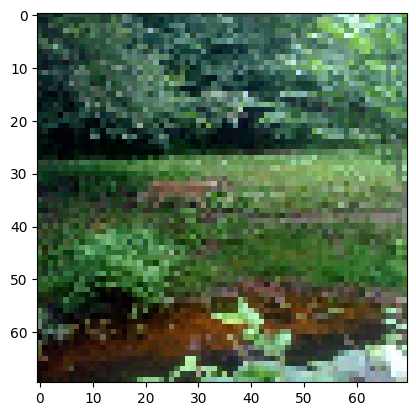

1/1 [==============================] - 0s 35ms/step
jaguar




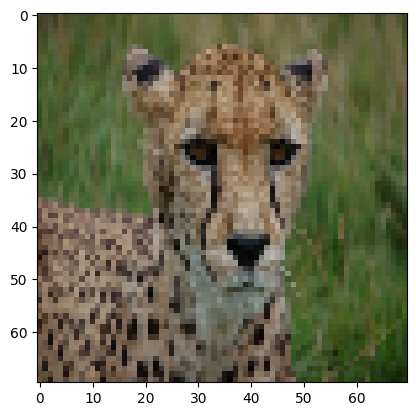

1/1 [==============================] - 0s 26ms/step
jaguar




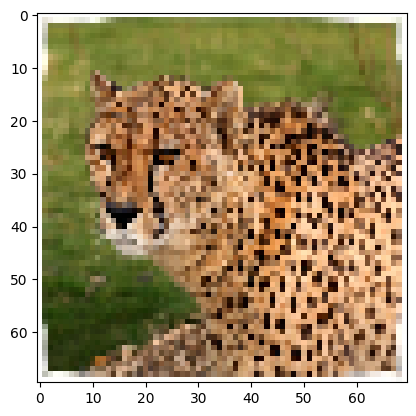

1/1 [==============================] - 0s 28ms/step
jaguar




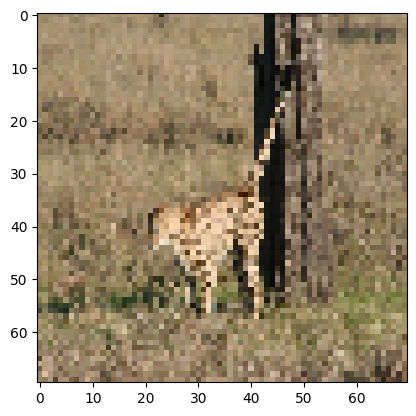

1/1 [==============================] - 0s 28ms/step
jaguar




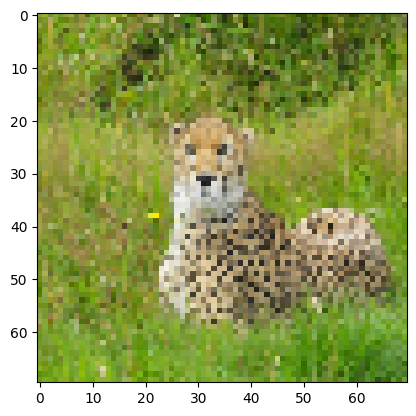

1/1 [==============================] - 0s 30ms/step
jaguar




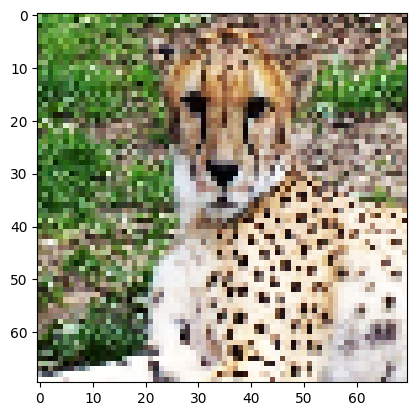

1/1 [==============================] - 0s 26ms/step
jaguar




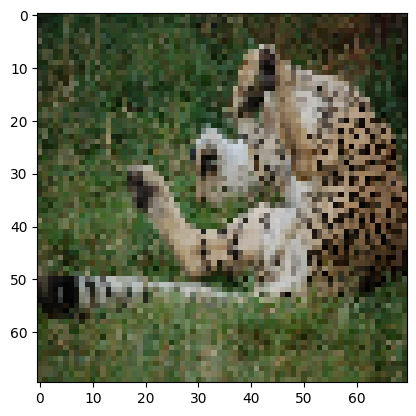

1/1 [==============================] - 0s 32ms/step
jaguar




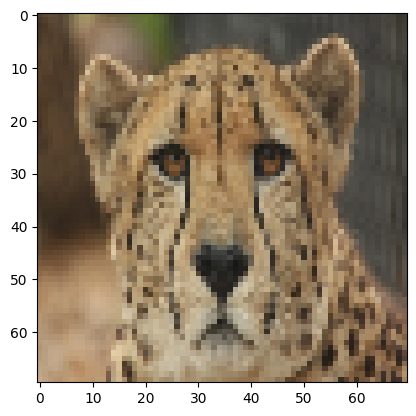

1/1 [==============================] - 0s 27ms/step
jaguar




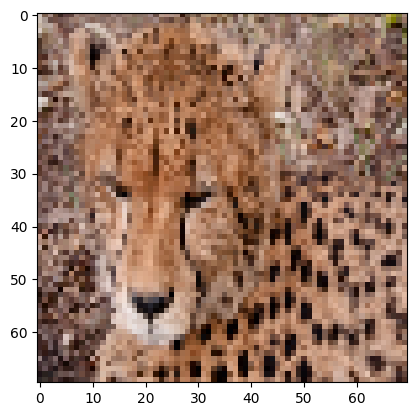

1/1 [==============================] - 0s 27ms/step
jaguar




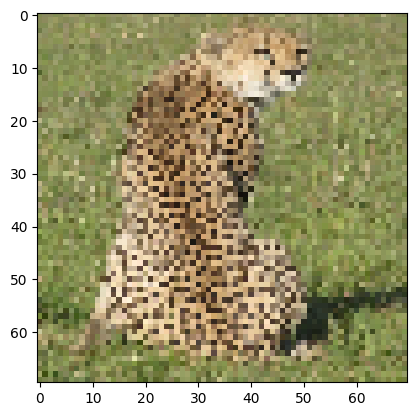

1/1 [==============================] - 0s 29ms/step
jaguar




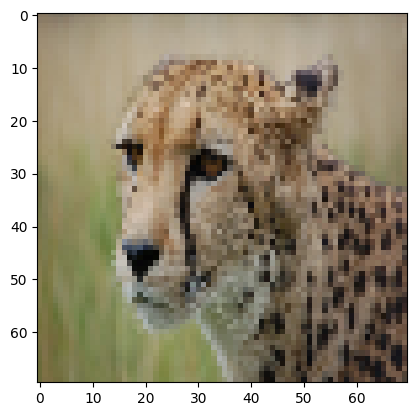

1/1 [==============================] - 0s 27ms/step
jaguar




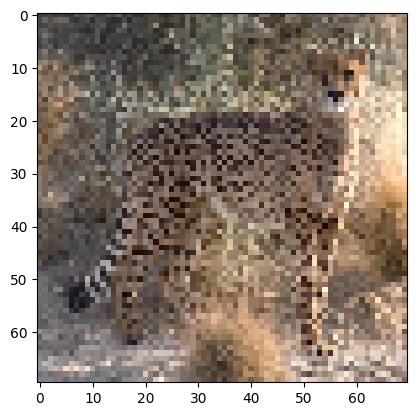

1/1 [==============================] - 0s 29ms/step
jaguar




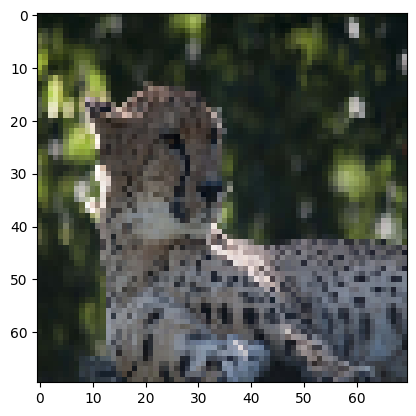

1/1 [==============================] - 0s 29ms/step
jaguar




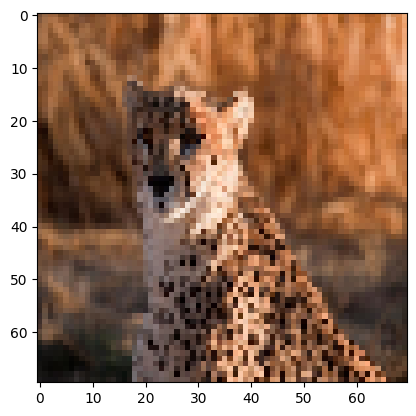

1/1 [==============================] - 0s 27ms/step
jaguar




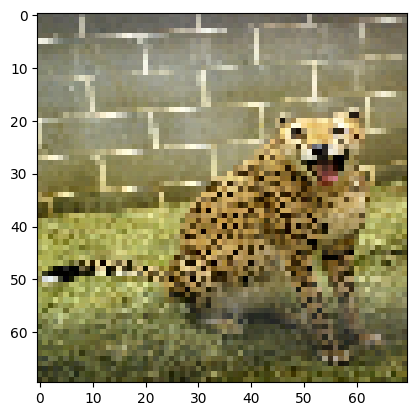

1/1 [==============================] - 0s 37ms/step
jaguar




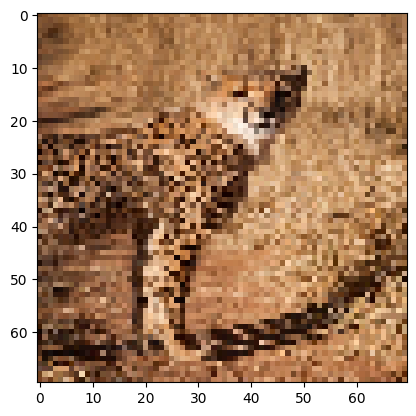

1/1 [==============================] - 0s 27ms/step
jaguar




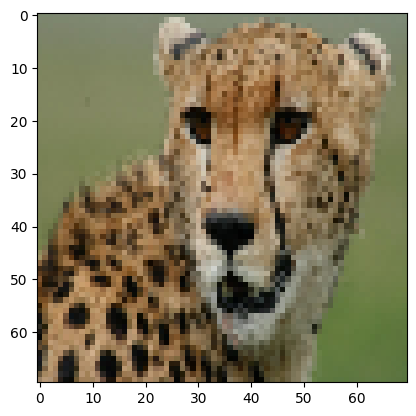

1/1 [==============================] - 0s 32ms/step
jaguar




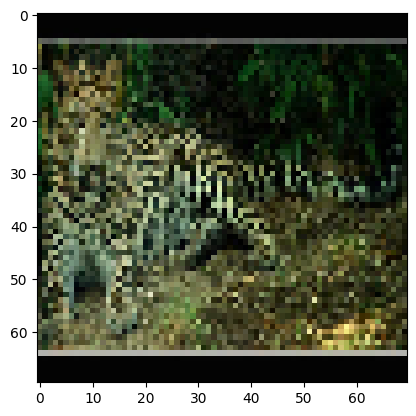

1/1 [==============================] - 0s 45ms/step
jaguar




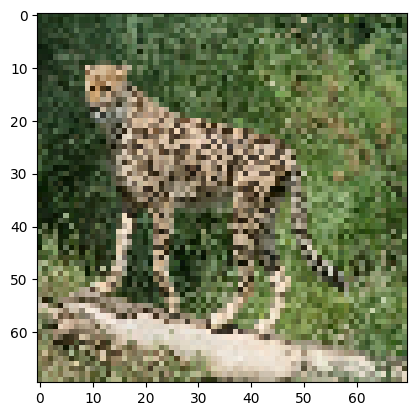

1/1 [==============================] - 0s 38ms/step
jaguar




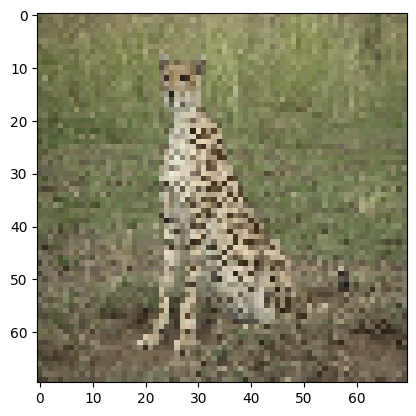

1/1 [==============================] - 0s 38ms/step
jaguar




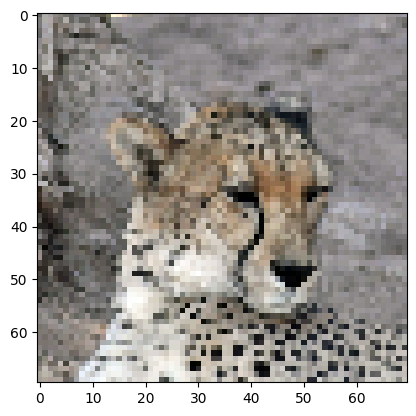

1/1 [==============================] - 0s 37ms/step
jaguar




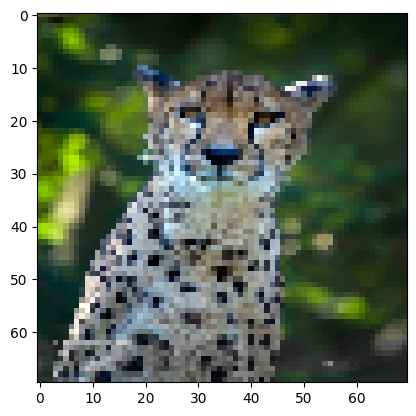

1/1 [==============================] - 0s 62ms/step
jaguar




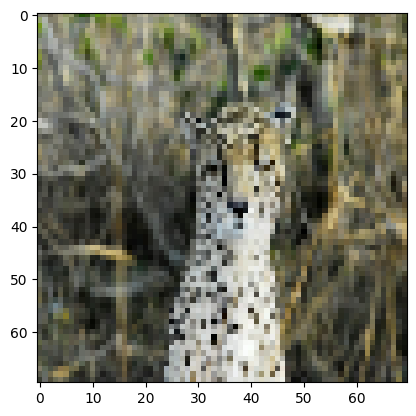

1/1 [==============================] - 0s 37ms/step
jaguar




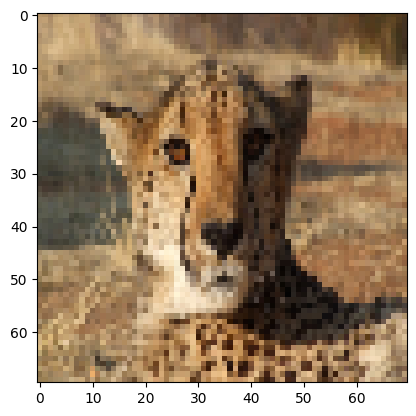

1/1 [==============================] - 0s 38ms/step
jaguar




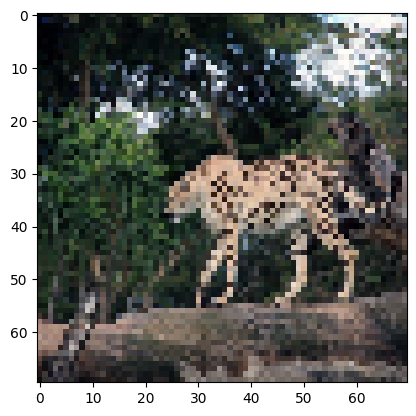

1/1 [==============================] - 0s 43ms/step
jaguar




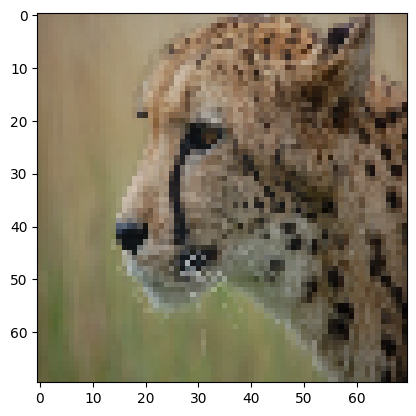

1/1 [==============================] - 0s 44ms/step
jaguar




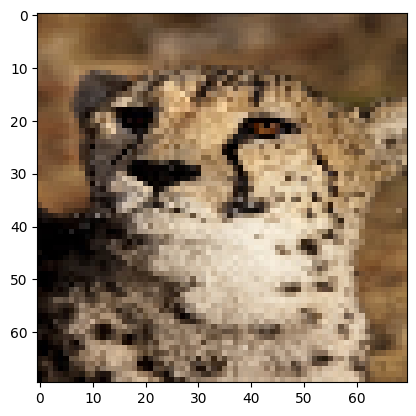

1/1 [==============================] - 0s 44ms/step
jaguar




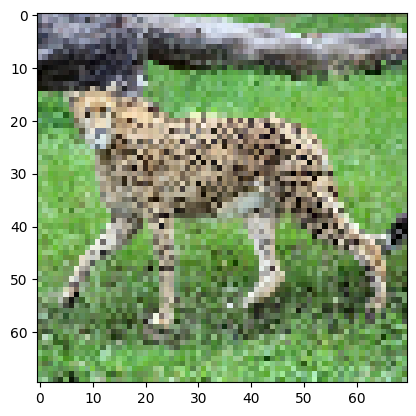

1/1 [==============================] - 0s 46ms/step
jaguar




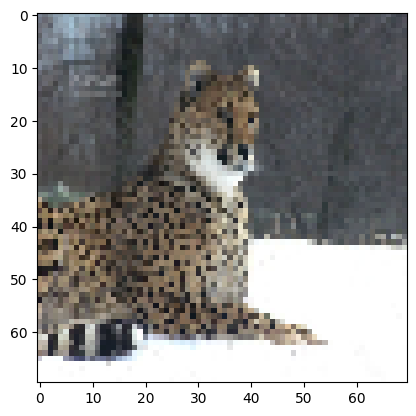

1/1 [==============================] - 0s 43ms/step
jaguar




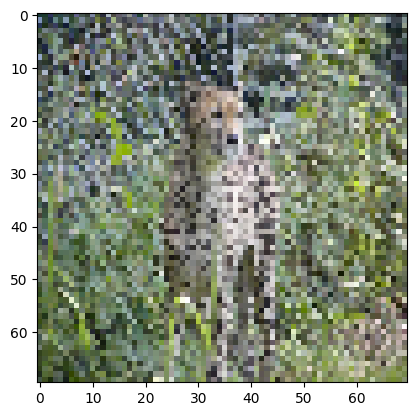

1/1 [==============================] - 0s 26ms/step
jaguar




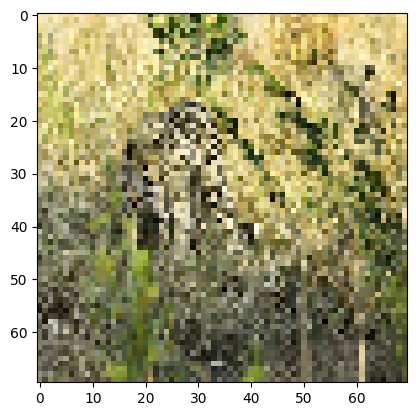

1/1 [==============================] - 0s 29ms/step
jaguar




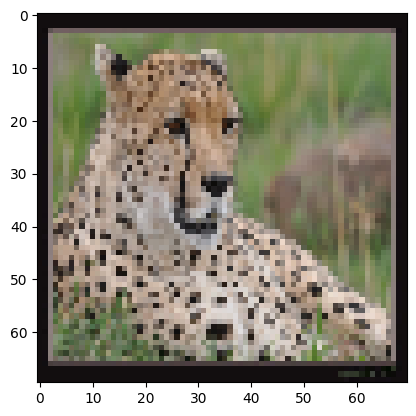

1/1 [==============================] - 0s 25ms/step
jaguar




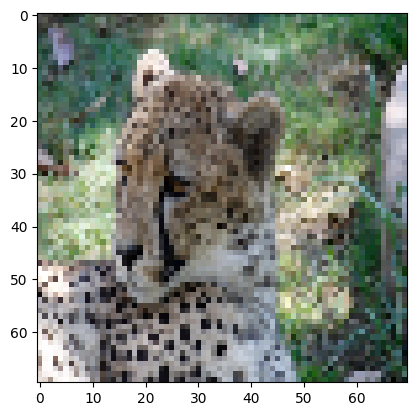

1/1 [==============================] - 0s 26ms/step
jaguar




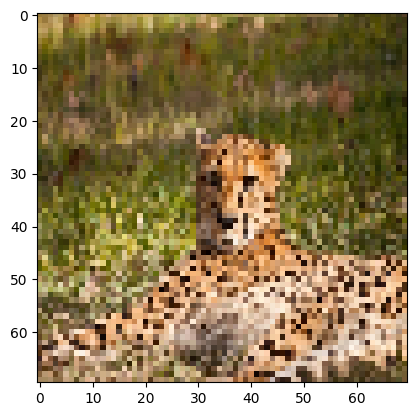

1/1 [==============================] - 0s 31ms/step
jaguar




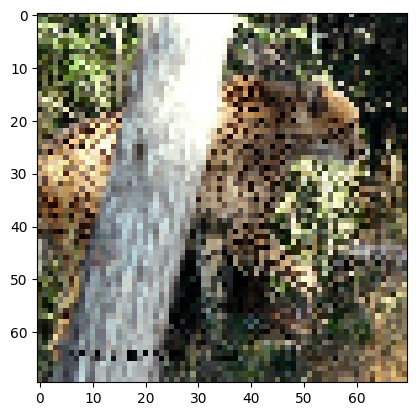

1/1 [==============================] - 0s 29ms/step
jaguar




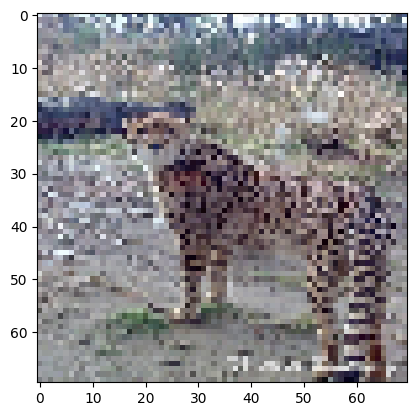

1/1 [==============================] - 0s 25ms/step
jaguar




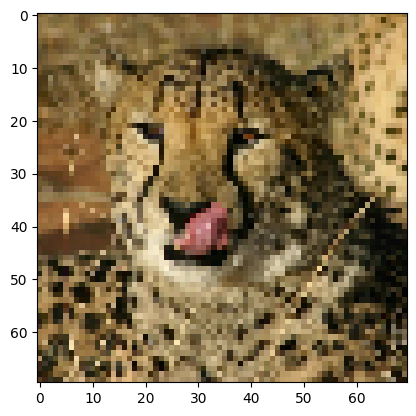

1/1 [==============================] - 0s 38ms/step
jaguar




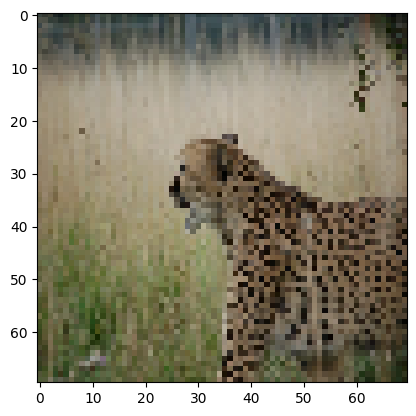

1/1 [==============================] - 0s 35ms/step
jaguar




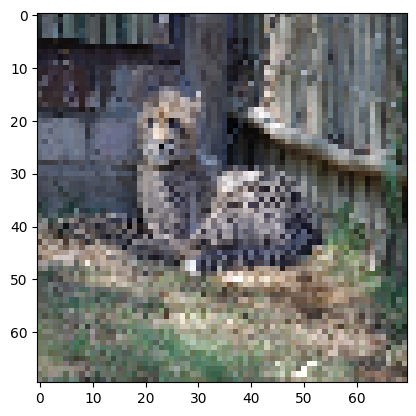

1/1 [==============================] - 0s 31ms/step
jaguar




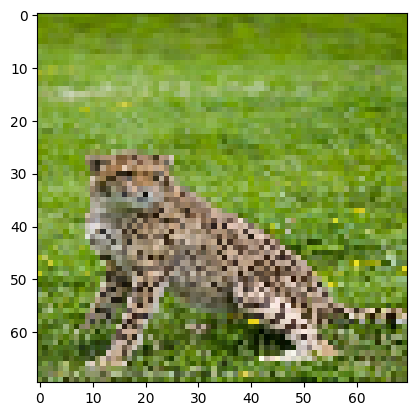

1/1 [==============================] - 0s 28ms/step
jaguar




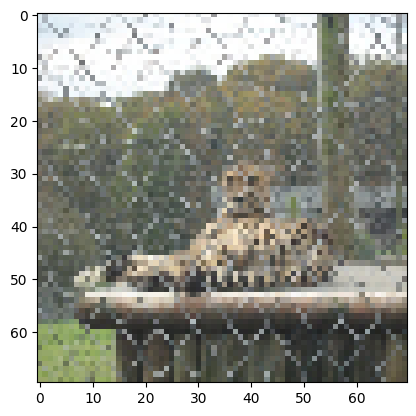

1/1 [==============================] - 0s 29ms/step
jaguar




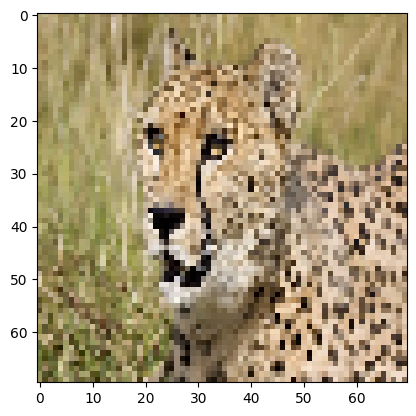

1/1 [==============================] - 0s 28ms/step
jaguar




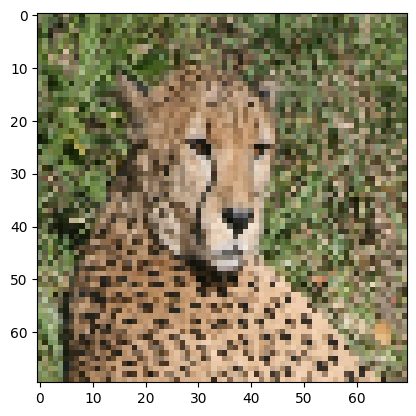

1/1 [==============================] - 0s 35ms/step
jaguar




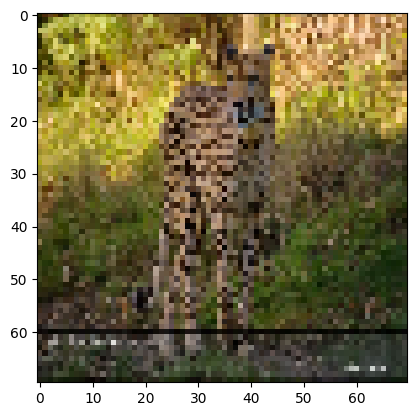

1/1 [==============================] - 0s 29ms/step
jaguar




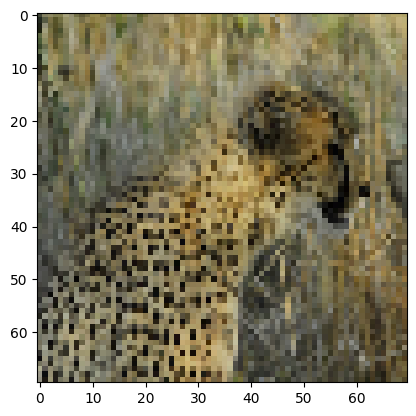

1/1 [==============================] - 0s 36ms/step
jaguar




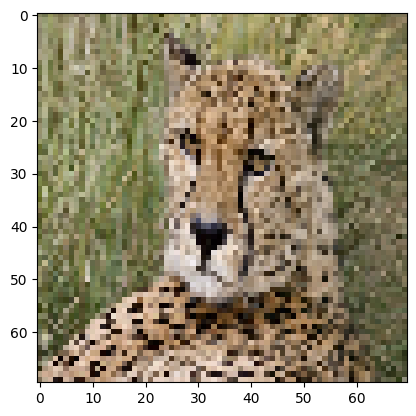

1/1 [==============================] - 0s 29ms/step
jaguar




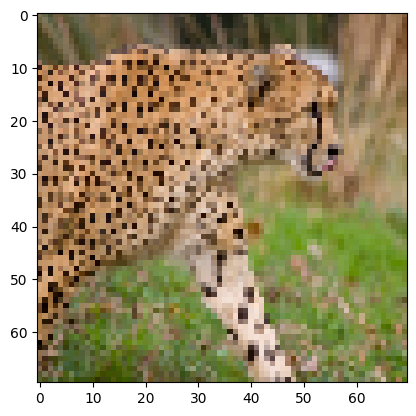

1/1 [==============================] - 0s 28ms/step
jaguar




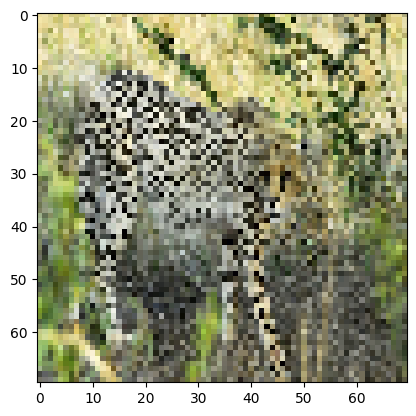

1/1 [==============================] - 0s 35ms/step
jaguar




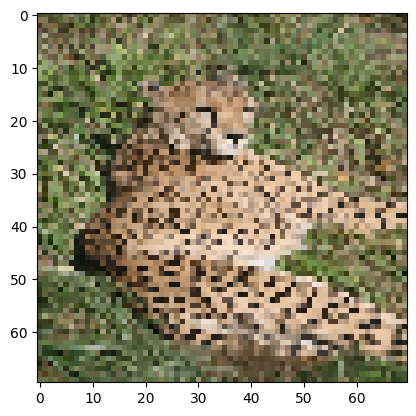

1/1 [==============================] - 0s 28ms/step
jaguar




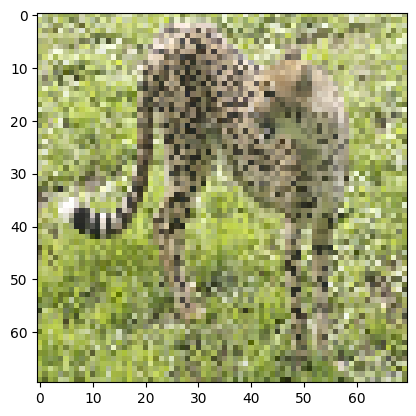

1/1 [==============================] - 0s 27ms/step
jaguar




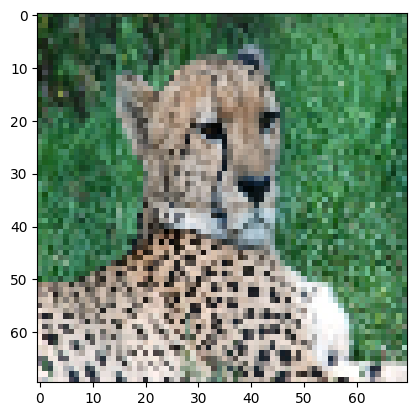

1/1 [==============================] - 0s 36ms/step
jaguar




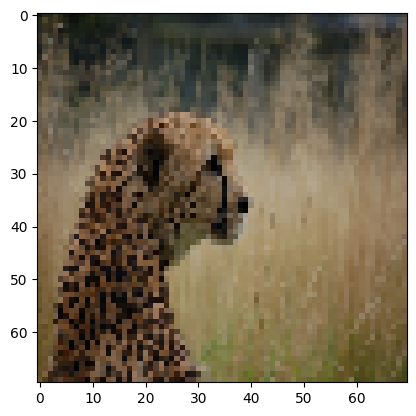

1/1 [==============================] - 0s 27ms/step
jaguar




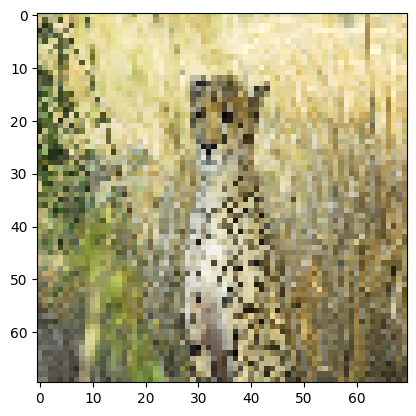

1/1 [==============================] - 0s 28ms/step
jaguar




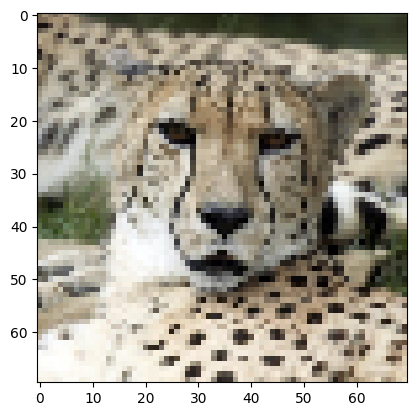

1/1 [==============================] - 0s 44ms/step
jaguar




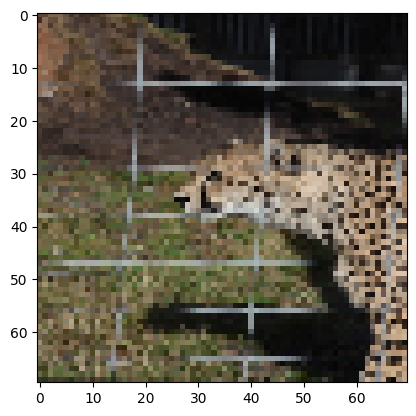

1/1 [==============================] - 0s 51ms/step
jaguar




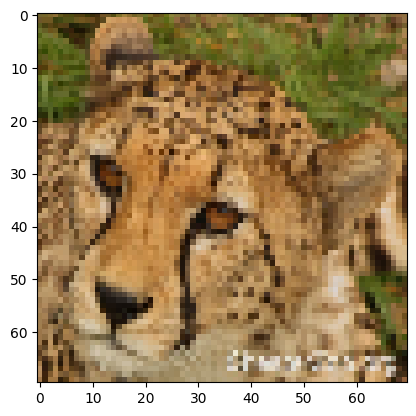

1/1 [==============================] - 0s 43ms/step
jaguar




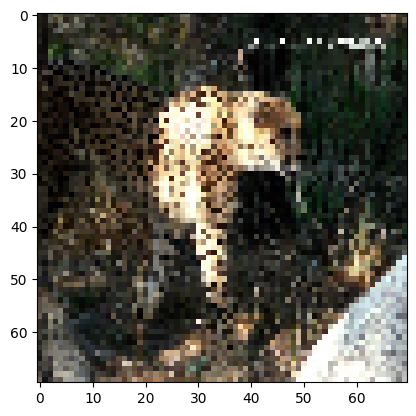

1/1 [==============================] - 0s 51ms/step
jaguar




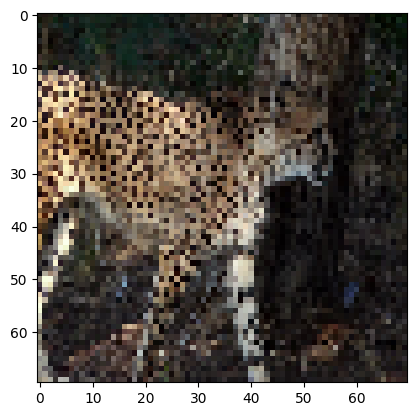

1/1 [==============================] - 0s 44ms/step
jaguar




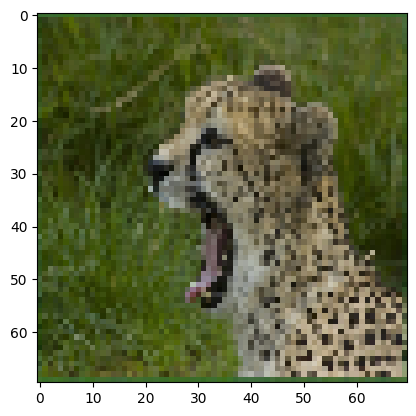

1/1 [==============================] - 0s 48ms/step
jaguar




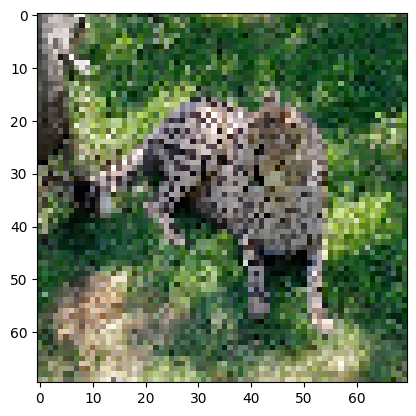

1/1 [==============================] - 0s 44ms/step
jaguar




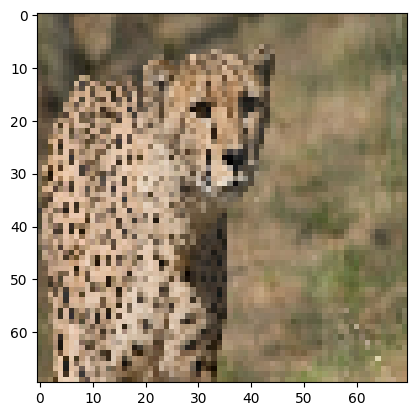

1/1 [==============================] - 0s 50ms/step
jaguar




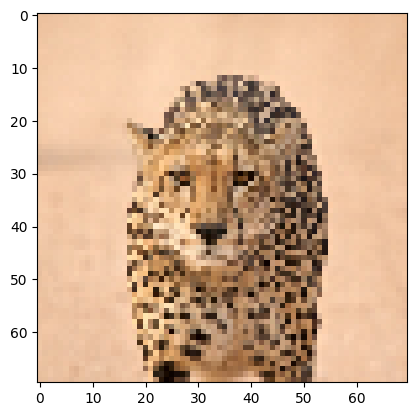

1/1 [==============================] - 0s 45ms/step
jaguar




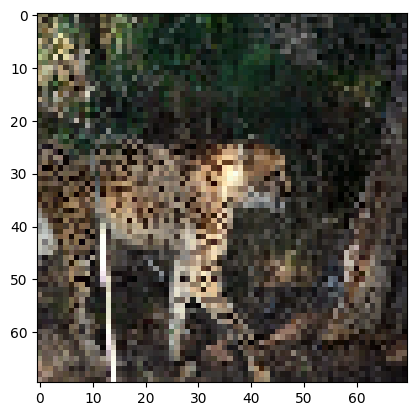

1/1 [==============================] - 0s 51ms/step
jaguar




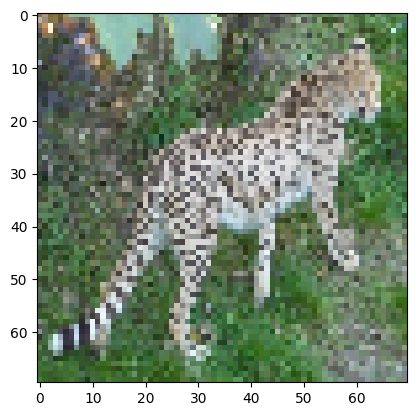

1/1 [==============================] - 0s 44ms/step
jaguar




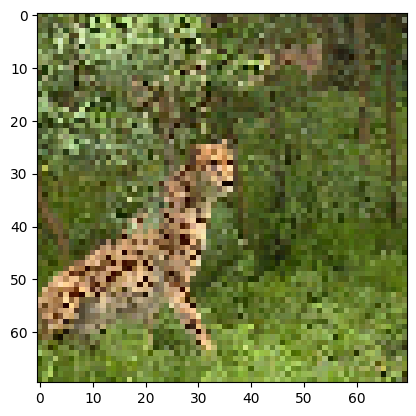

1/1 [==============================] - 0s 43ms/step
jaguar




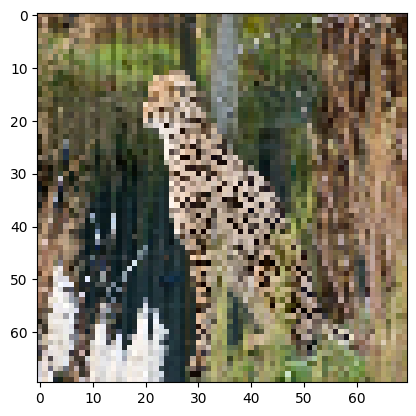

1/1 [==============================] - 0s 43ms/step
jaguar




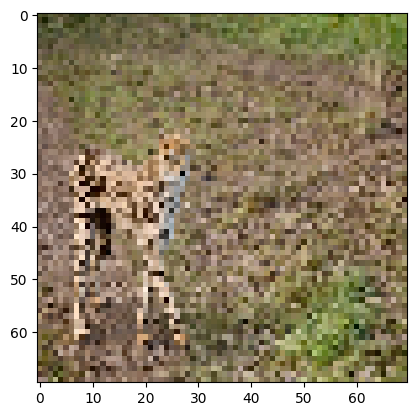

1/1 [==============================] - 0s 29ms/step
jaguar




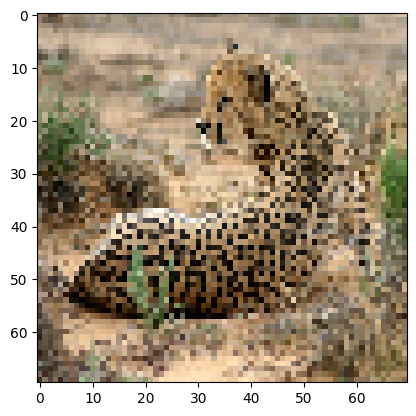

1/1 [==============================] - 0s 27ms/step
jaguar




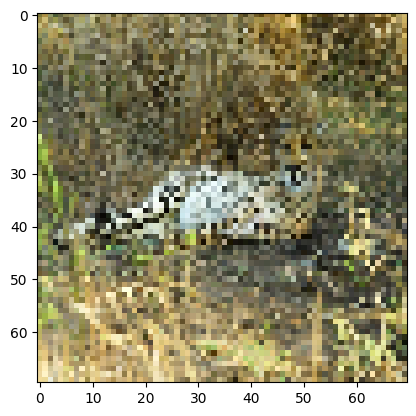

1/1 [==============================] - 0s 29ms/step
jaguar




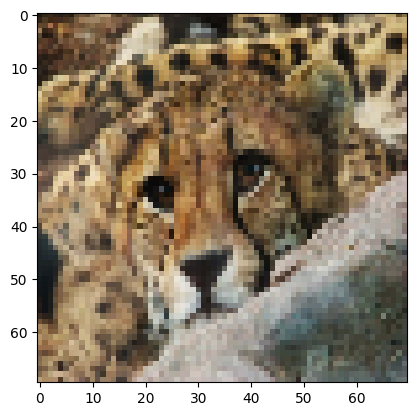

1/1 [==============================] - 0s 36ms/step
jaguar




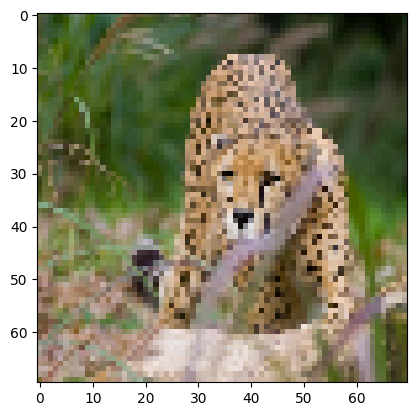

1/1 [==============================] - 0s 32ms/step
jaguar




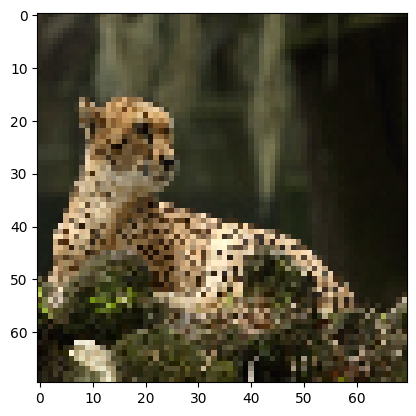

1/1 [==============================] - 0s 28ms/step
jaguar




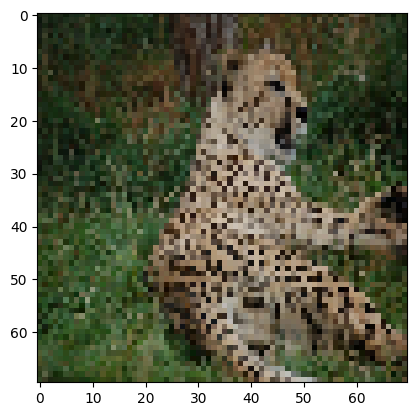

1/1 [==============================] - 0s 31ms/step
jaguar




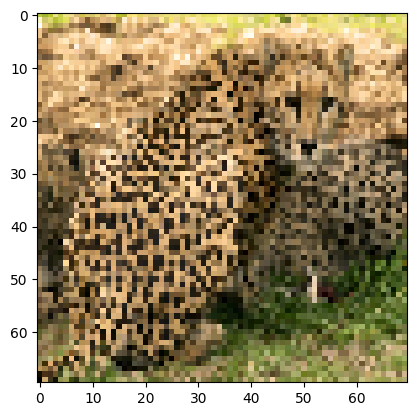

1/1 [==============================] - 0s 30ms/step
jaguar




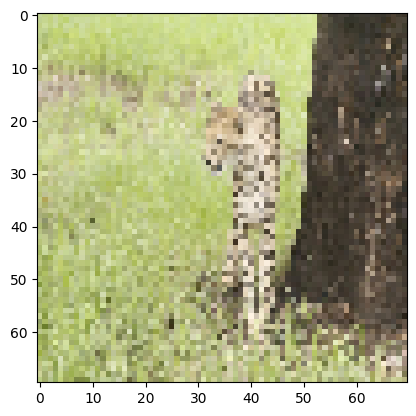

1/1 [==============================] - 0s 29ms/step
jaguar




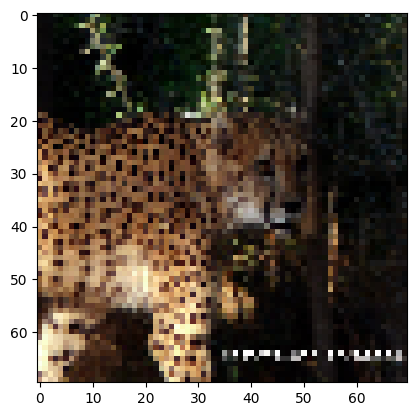

1/1 [==============================] - 0s 26ms/step
jaguar




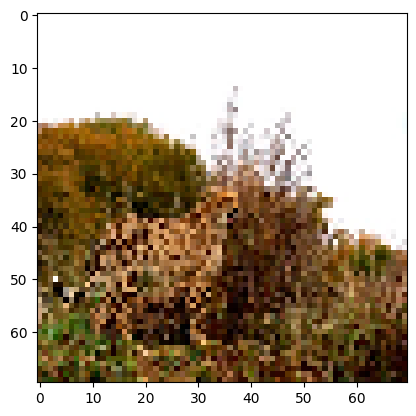

1/1 [==============================] - 0s 28ms/step
jaguar




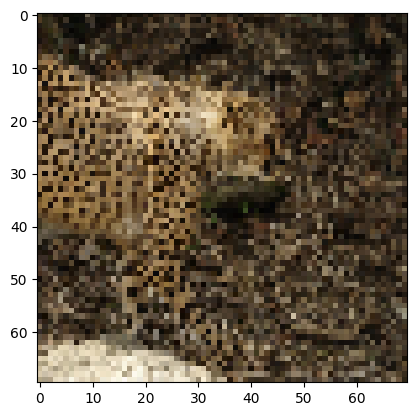

1/1 [==============================] - 0s 31ms/step
jaguar




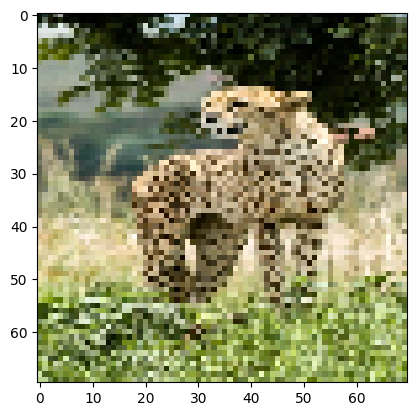

1/1 [==============================] - 0s 28ms/step
jaguar




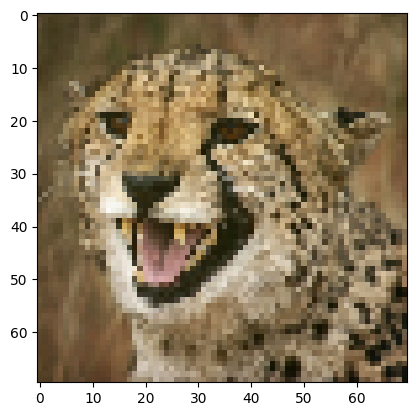

1/1 [==============================] - 0s 27ms/step
jaguar




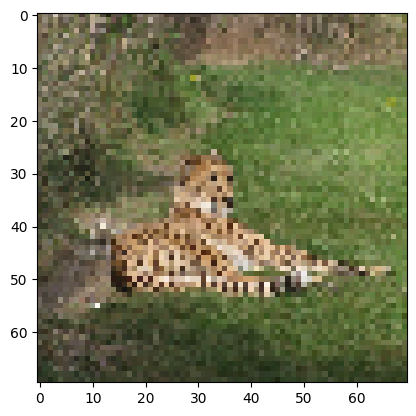

1/1 [==============================] - 0s 32ms/step
jaguar




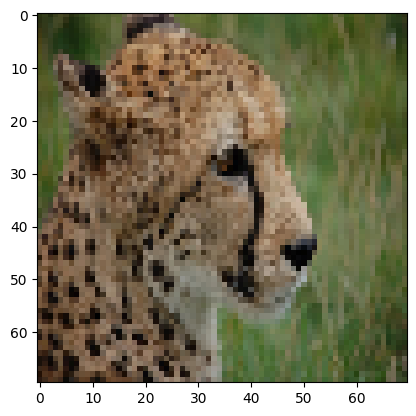

1/1 [==============================] - 0s 28ms/step
jaguar




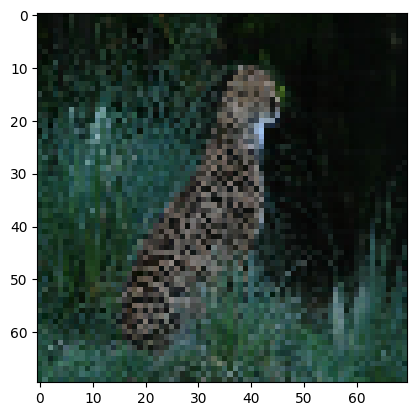

1/1 [==============================] - 0s 35ms/step
jaguar




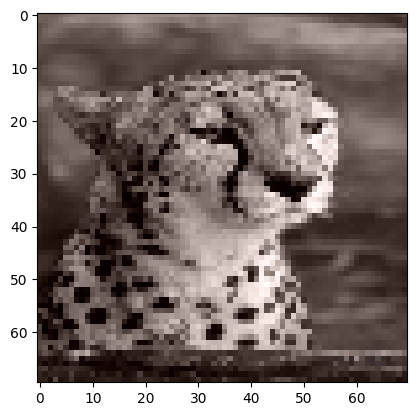

1/1 [==============================] - 0s 43ms/step
jaguar




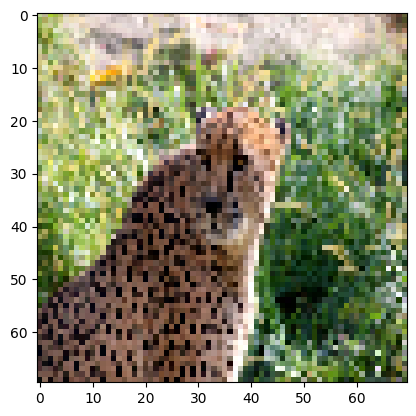

1/1 [==============================] - 0s 28ms/step
jaguar




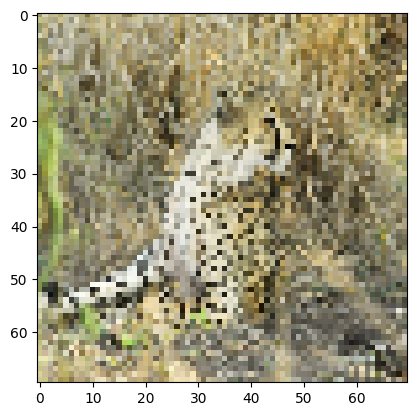

1/1 [==============================] - 0s 27ms/step
jaguar




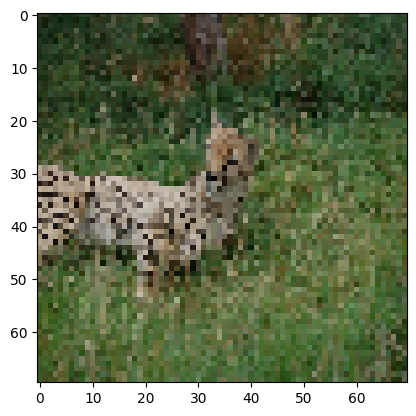

1/1 [==============================] - 0s 26ms/step
jaguar




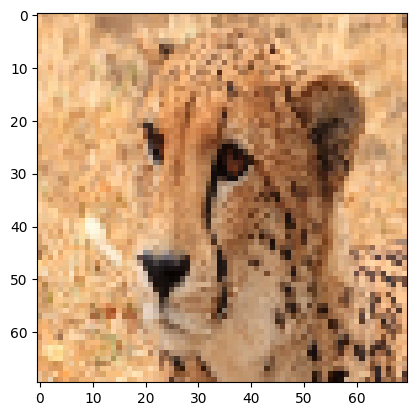

1/1 [==============================] - 0s 38ms/step
jaguar




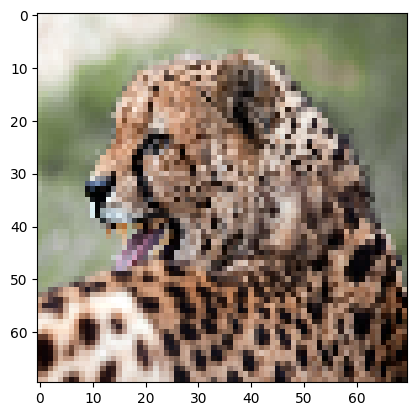

1/1 [==============================] - 0s 27ms/step
jaguar




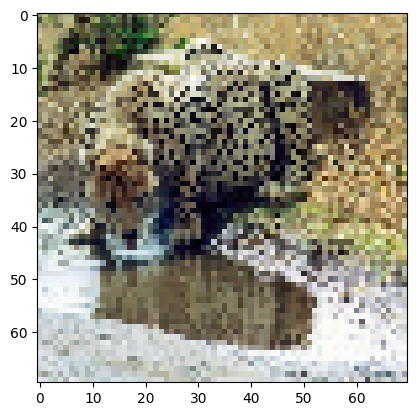

1/1 [==============================] - 0s 36ms/step
jaguar




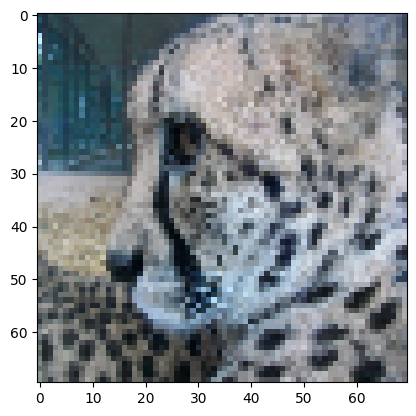

1/1 [==============================] - 0s 42ms/step
jaguar




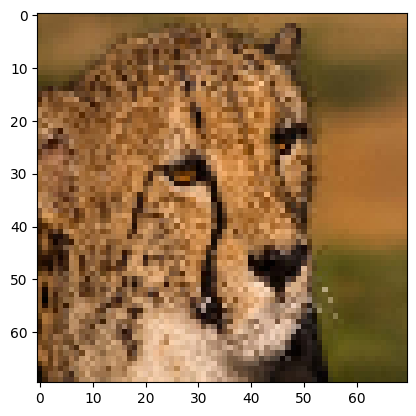

1/1 [==============================] - 0s 72ms/step
jaguar




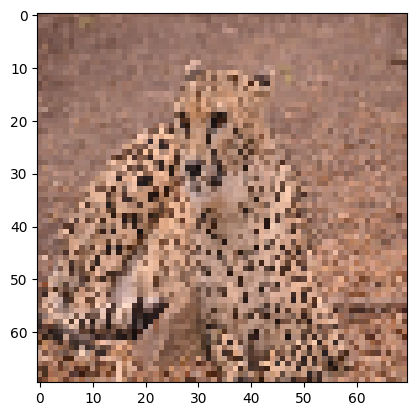

1/1 [==============================] - 0s 40ms/step
jaguar




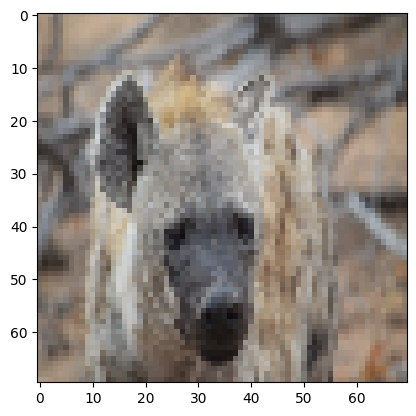

1/1 [==============================] - 0s 48ms/step
hyena




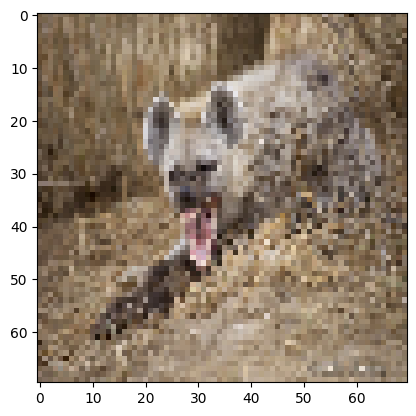

1/1 [==============================] - 0s 41ms/step
jaguar




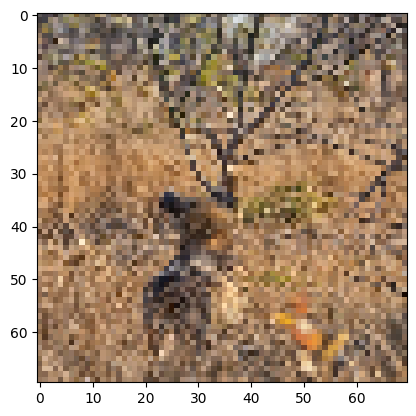

1/1 [==============================] - 0s 39ms/step
jaguar




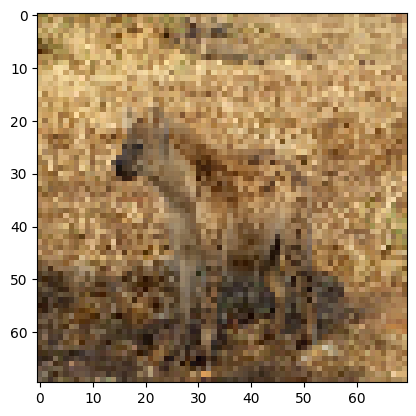

1/1 [==============================] - 0s 45ms/step
jaguar




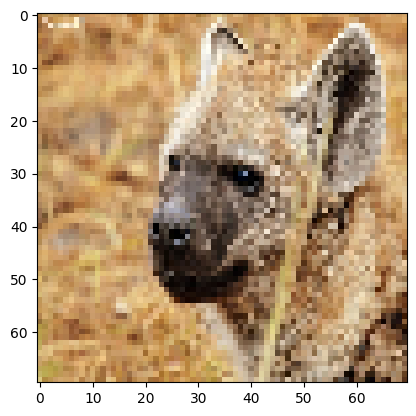

1/1 [==============================] - 0s 40ms/step
jaguar




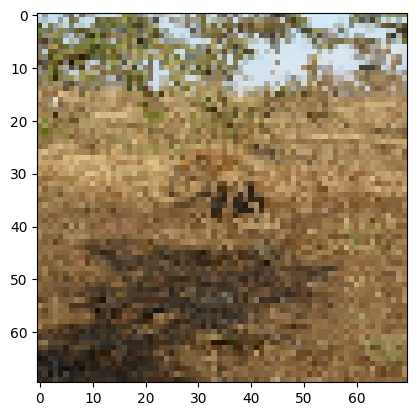

1/1 [==============================] - 0s 46ms/step
jaguar




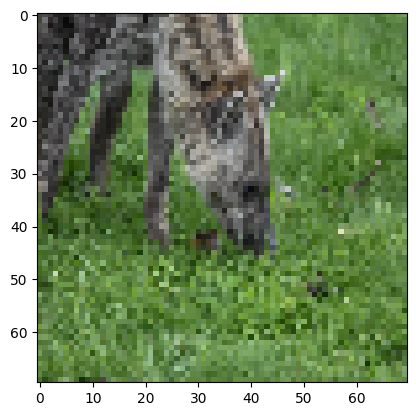

1/1 [==============================] - 0s 49ms/step
hyena




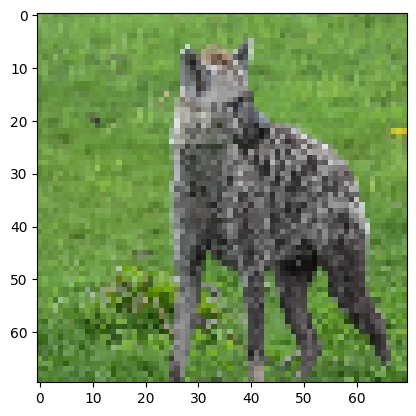

1/1 [==============================] - 0s 58ms/step
jaguar




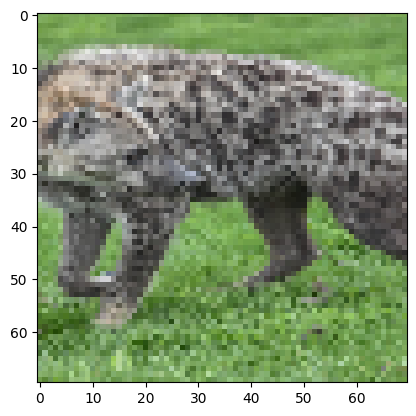

1/1 [==============================] - 0s 50ms/step
hyena




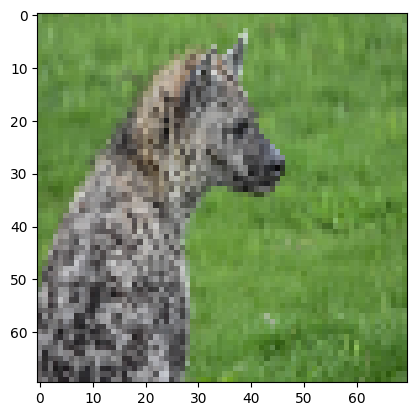

1/1 [==============================] - 0s 32ms/step
hyena




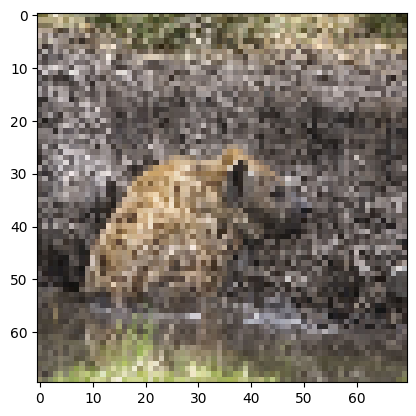

1/1 [==============================] - 0s 28ms/step
jaguar




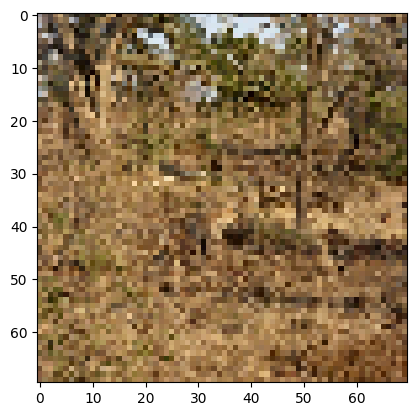

1/1 [==============================] - 0s 36ms/step
jaguar




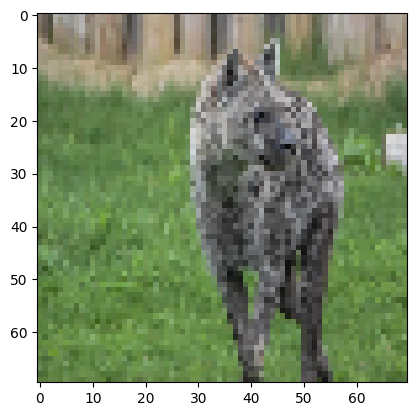

1/1 [==============================] - 0s 32ms/step
hyena




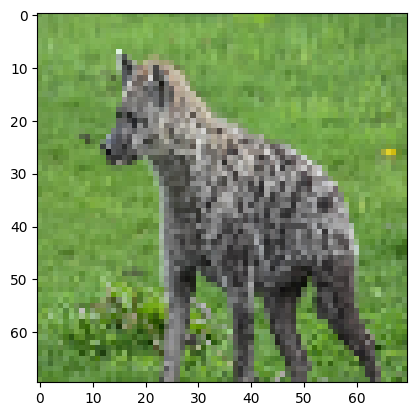

1/1 [==============================] - 0s 29ms/step
jaguar




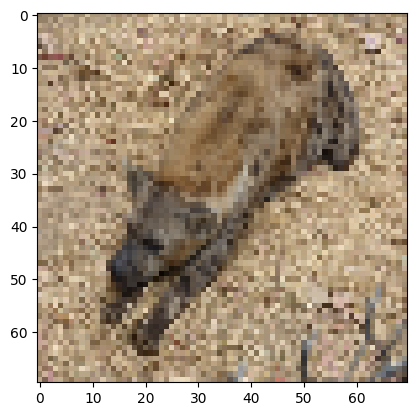

1/1 [==============================] - 0s 34ms/step
jaguar




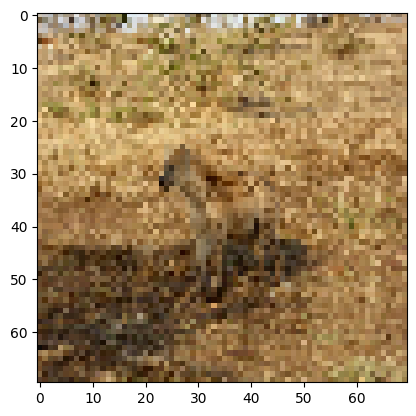

1/1 [==============================] - 0s 30ms/step
jaguar




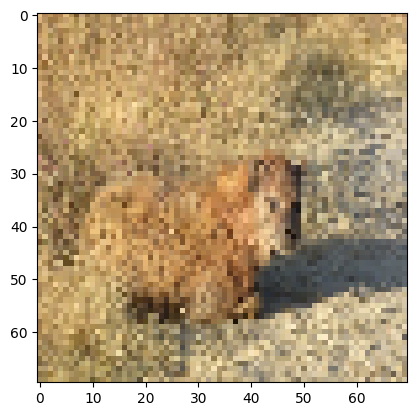

1/1 [==============================] - 0s 32ms/step
jaguar




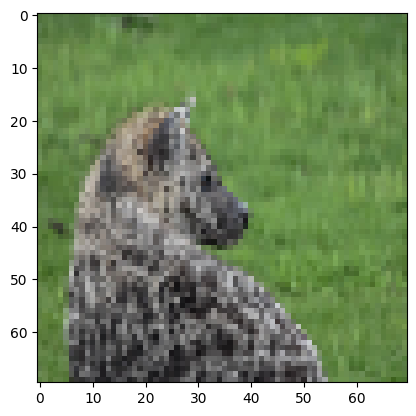

1/1 [==============================] - 0s 37ms/step
hyena




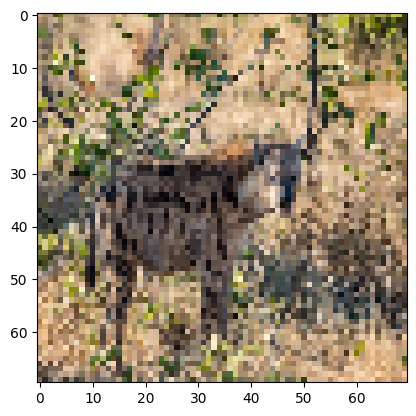

1/1 [==============================] - 0s 32ms/step
jaguar




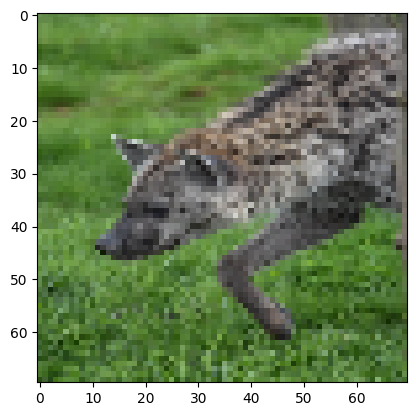

1/1 [==============================] - 0s 36ms/step
hyena




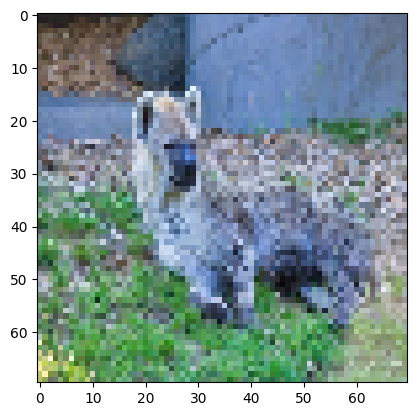

1/1 [==============================] - 0s 32ms/step
hyena




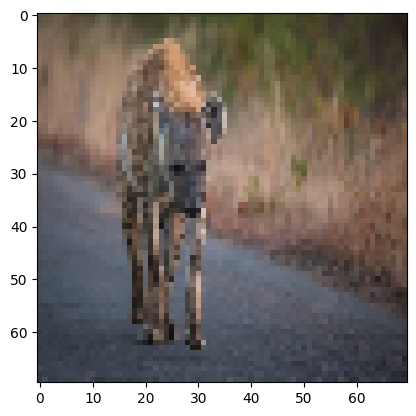

1/1 [==============================] - 0s 34ms/step
hyena




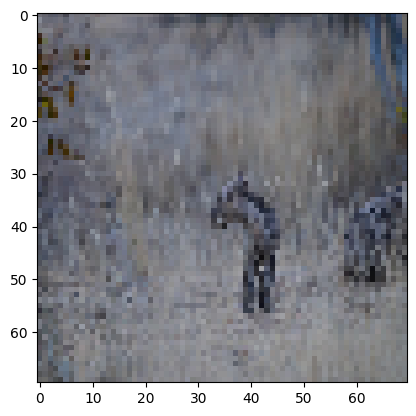

1/1 [==============================] - 0s 33ms/step
hyena




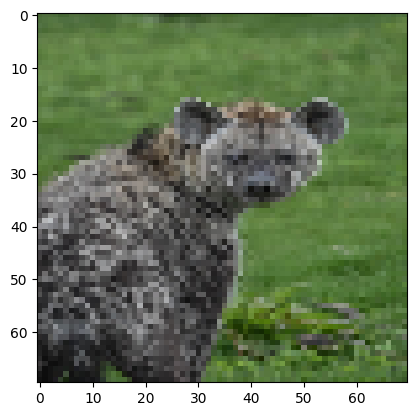

1/1 [==============================] - 0s 30ms/step
jaguar




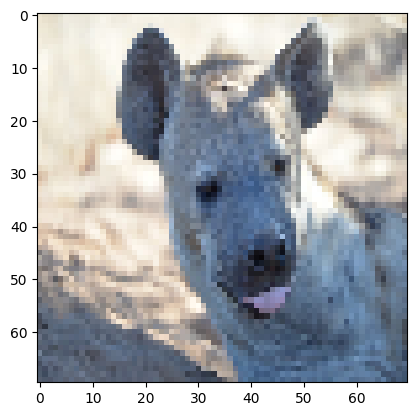

1/1 [==============================] - 0s 35ms/step
hyena




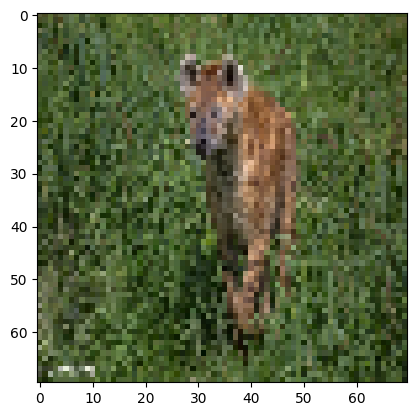

1/1 [==============================] - 0s 34ms/step
jaguar




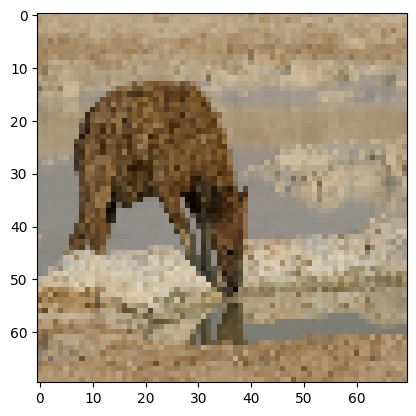

1/1 [==============================] - 0s 34ms/step
jaguar




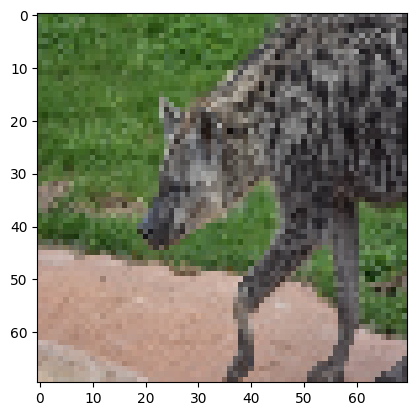

1/1 [==============================] - 0s 31ms/step
jaguar




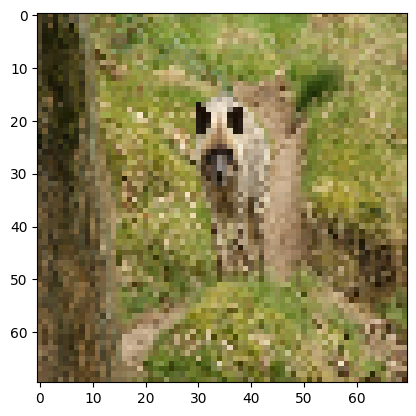

1/1 [==============================] - 0s 35ms/step
jaguar




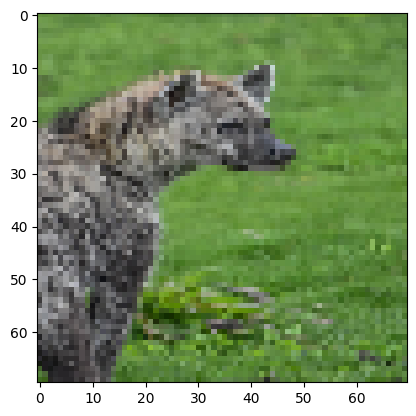

1/1 [==============================] - 0s 30ms/step
hyena




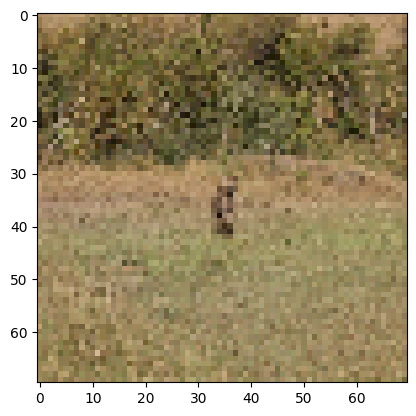

1/1 [==============================] - 0s 46ms/step
jaguar




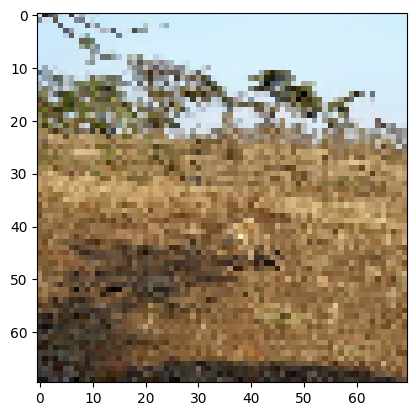

1/1 [==============================] - 0s 44ms/step
jaguar




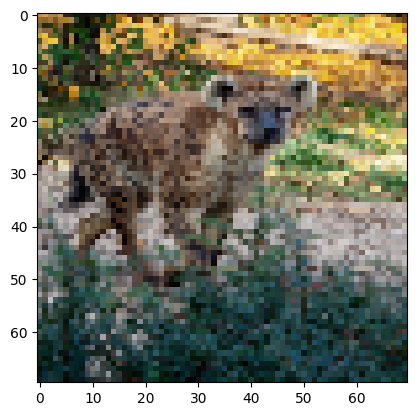

1/1 [==============================] - 0s 42ms/step
jaguar




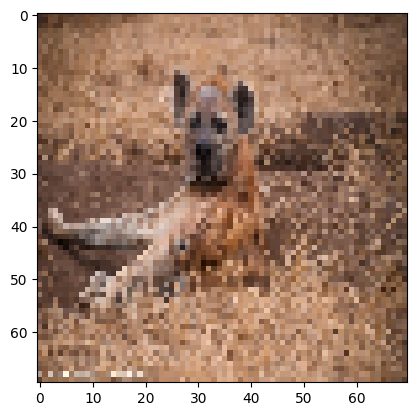

1/1 [==============================] - 0s 39ms/step
jaguar




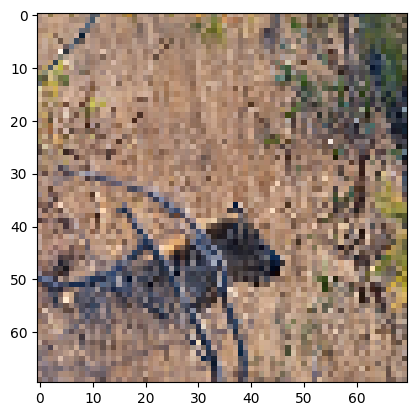

1/1 [==============================] - 0s 62ms/step
jaguar




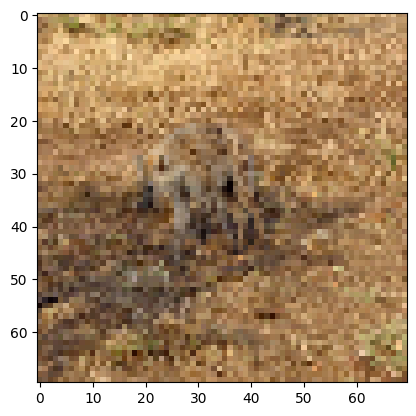

1/1 [==============================] - 0s 47ms/step
jaguar




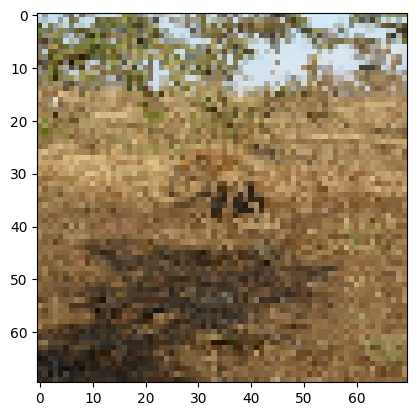

1/1 [==============================] - 0s 53ms/step
jaguar




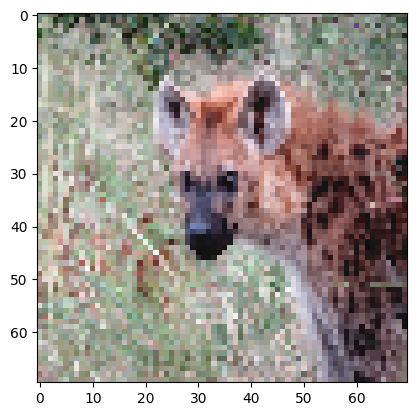

1/1 [==============================] - 0s 73ms/step
jaguar




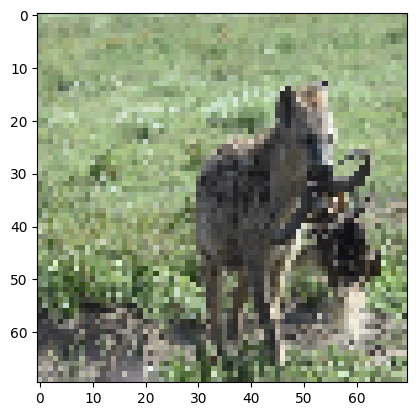

1/1 [==============================] - 0s 61ms/step
jaguar




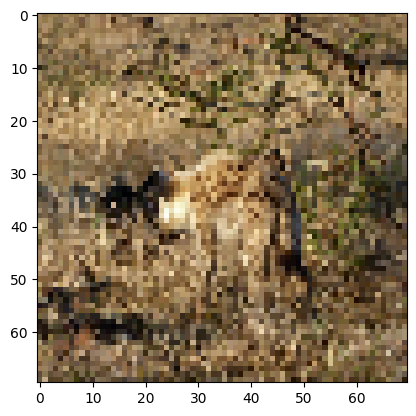

1/1 [==============================] - 0s 60ms/step
jaguar




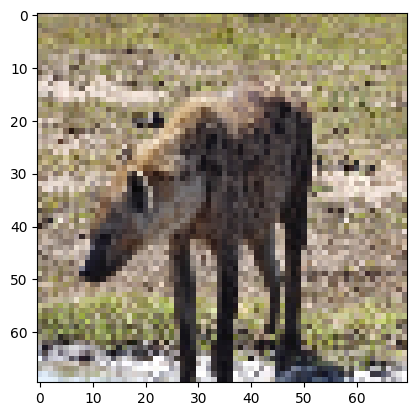

1/1 [==============================] - 0s 64ms/step
jaguar




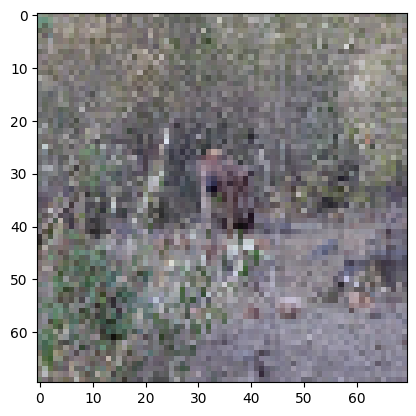

1/1 [==============================] - 0s 64ms/step
hyena




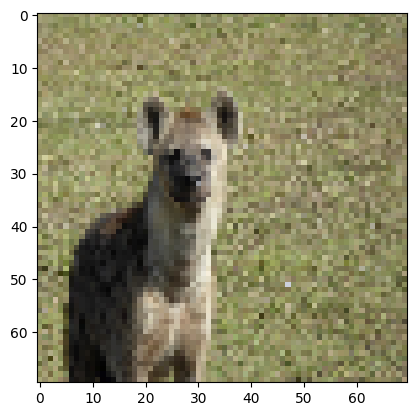

1/1 [==============================] - 0s 56ms/step
hyena




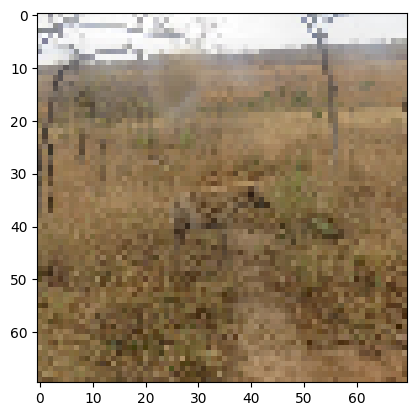

1/1 [==============================] - 0s 41ms/step
jaguar




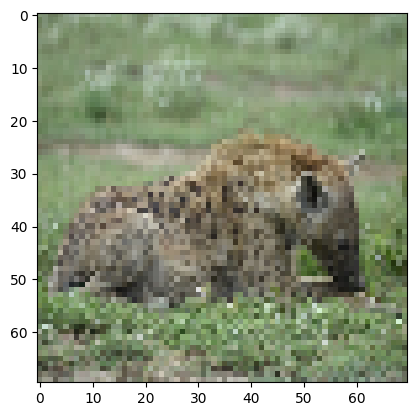

1/1 [==============================] - 0s 44ms/step
hyena




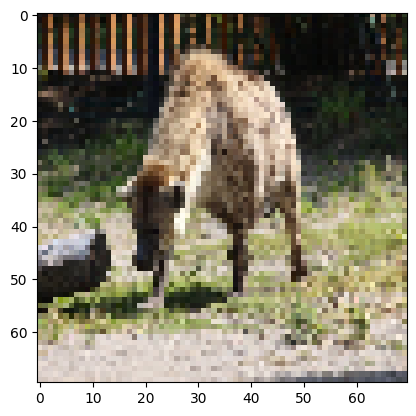

1/1 [==============================] - 0s 43ms/step
jaguar




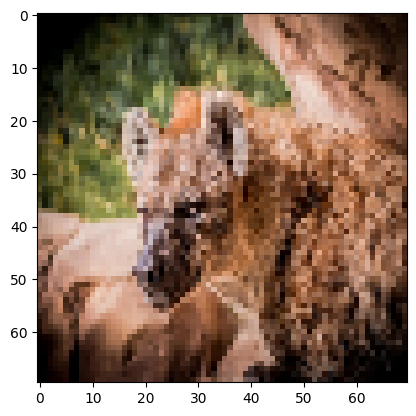

1/1 [==============================] - 0s 43ms/step
jaguar




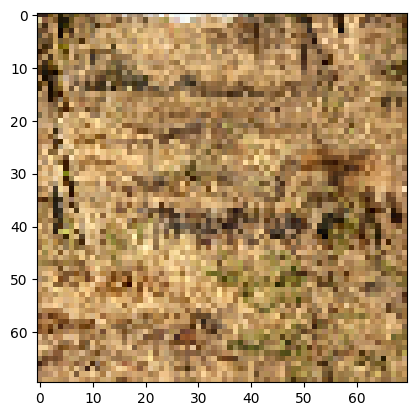

1/1 [==============================] - 0s 32ms/step
jaguar




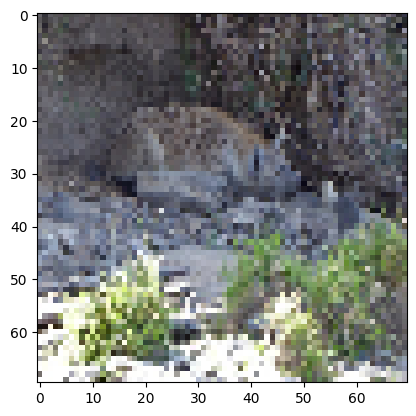

1/1 [==============================] - 0s 28ms/step
jaguar




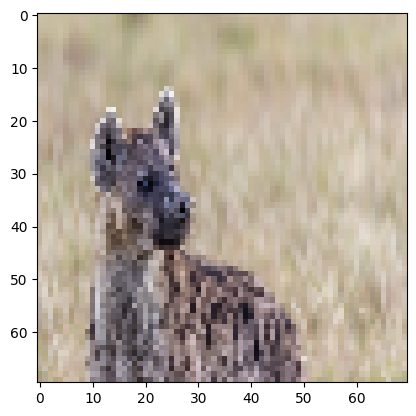

1/1 [==============================] - 0s 38ms/step
hyena




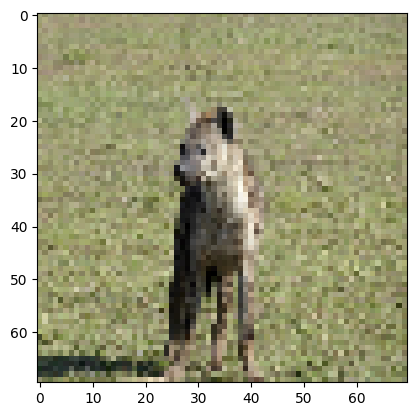

1/1 [==============================] - 0s 31ms/step
hyena




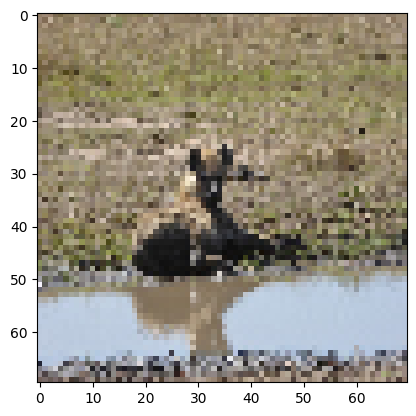

1/1 [==============================] - 0s 29ms/step
jaguar




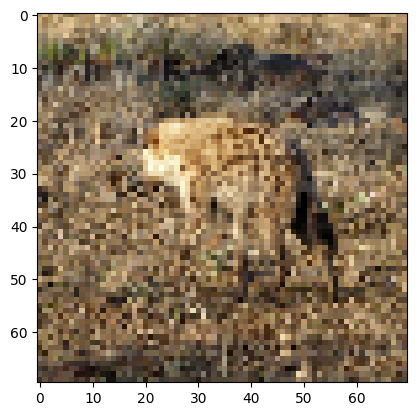

1/1 [==============================] - 0s 45ms/step
jaguar




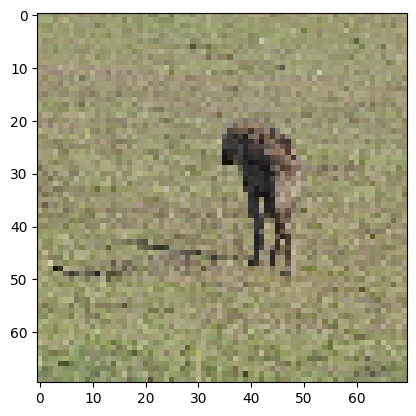

1/1 [==============================] - 0s 42ms/step
hyena




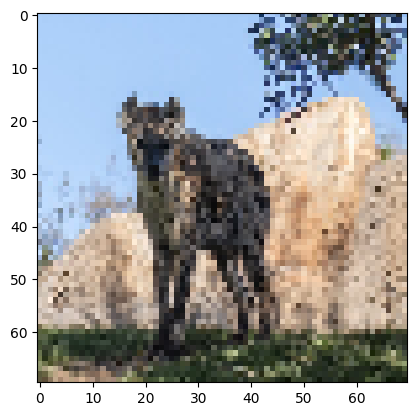

1/1 [==============================] - 0s 44ms/step
jaguar




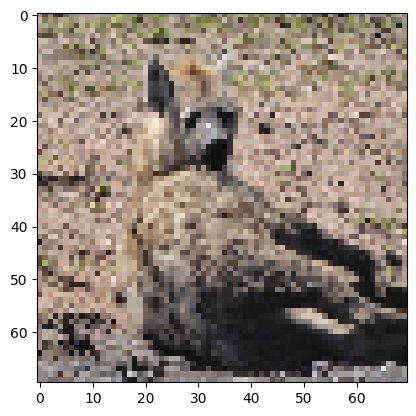

1/1 [==============================] - 0s 48ms/step
jaguar




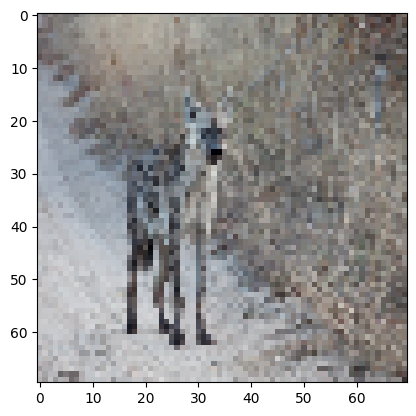

1/1 [==============================] - 0s 33ms/step
hyena




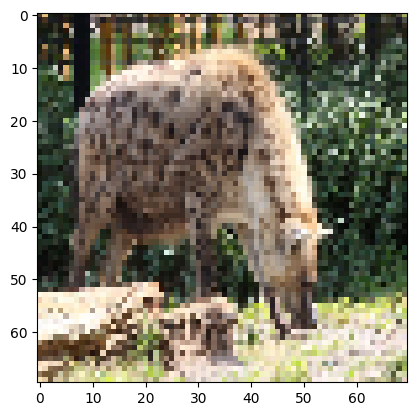

1/1 [==============================] - 0s 36ms/step
jaguar




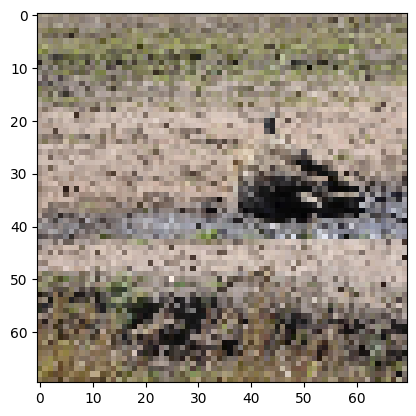

1/1 [==============================] - 0s 29ms/step
jaguar




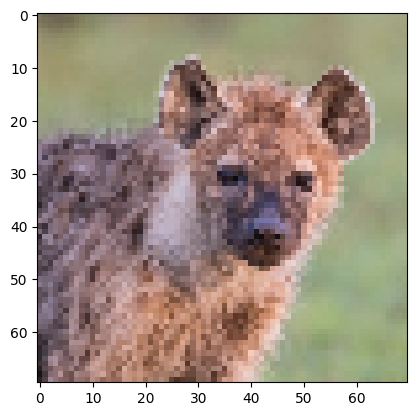

1/1 [==============================] - 0s 30ms/step
jaguar




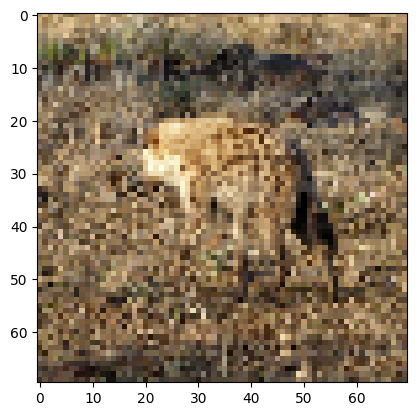

1/1 [==============================] - 0s 36ms/step
jaguar




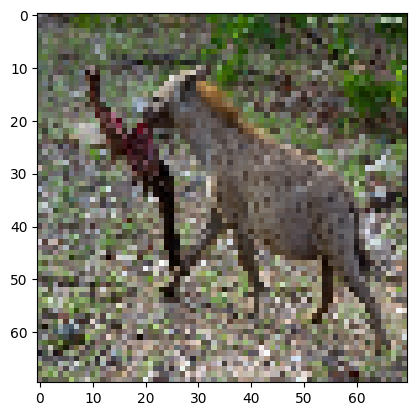

1/1 [==============================] - 0s 34ms/step
jaguar




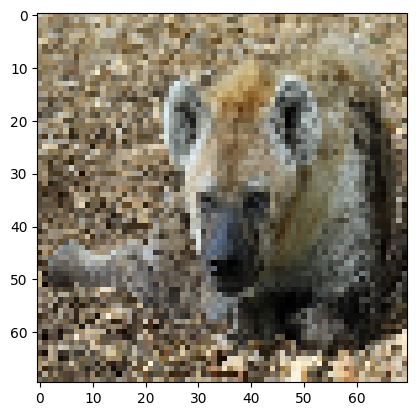

1/1 [==============================] - 0s 32ms/step
jaguar




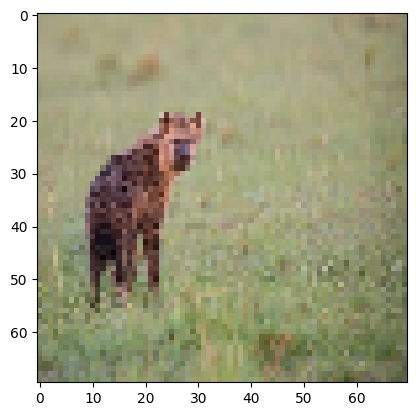

1/1 [==============================] - 0s 44ms/step
hyena




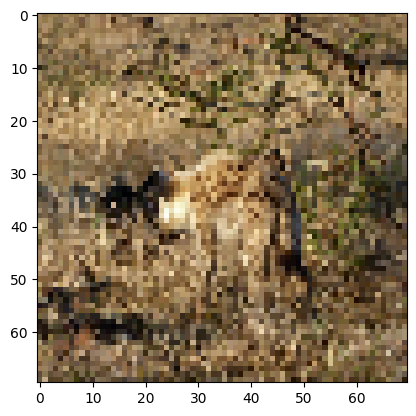

1/1 [==============================] - 0s 43ms/step
jaguar




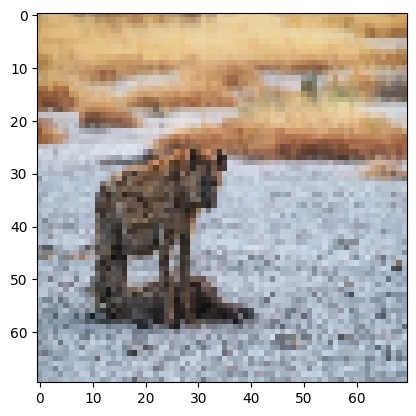

1/1 [==============================] - 0s 44ms/step
hyena




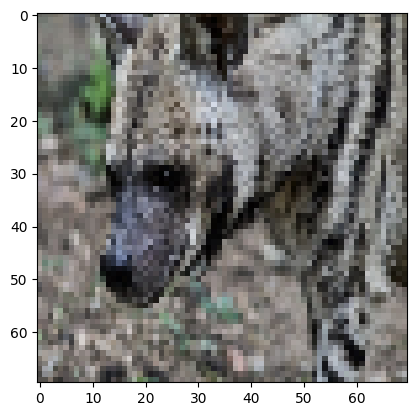

1/1 [==============================] - 0s 50ms/step
jaguar




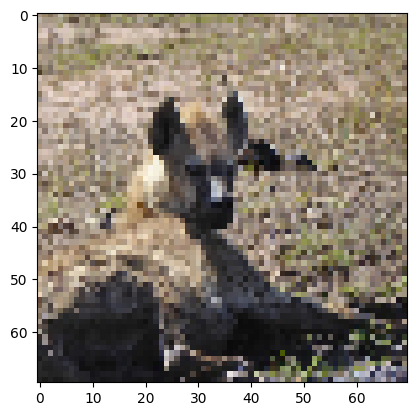

1/1 [==============================] - 0s 50ms/step
jaguar




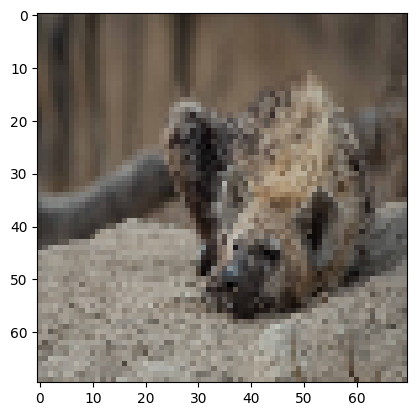

1/1 [==============================] - 0s 52ms/step
jaguar




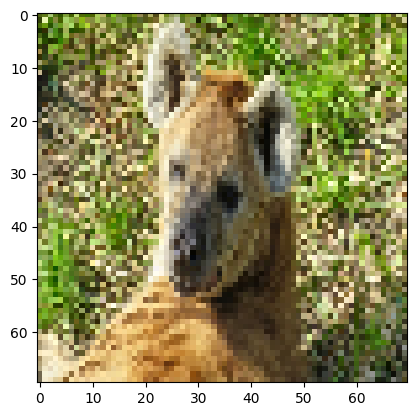

1/1 [==============================] - 0s 81ms/step
jaguar




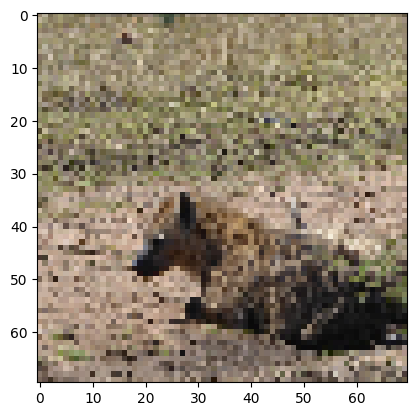

1/1 [==============================] - 0s 67ms/step
jaguar




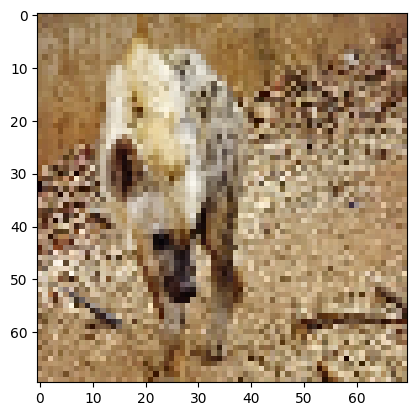

1/1 [==============================] - 0s 68ms/step
jaguar




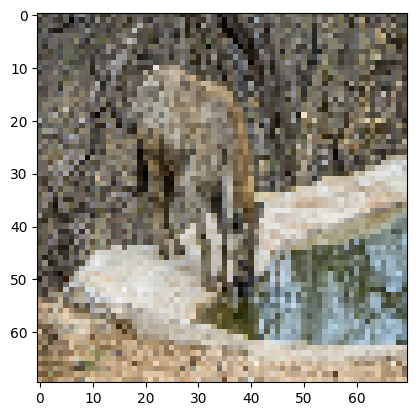

1/1 [==============================] - 0s 47ms/step
jaguar




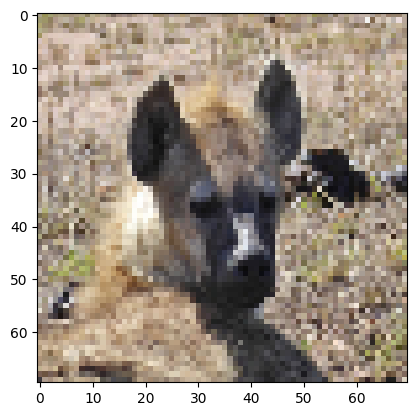

1/1 [==============================] - 0s 43ms/step
jaguar




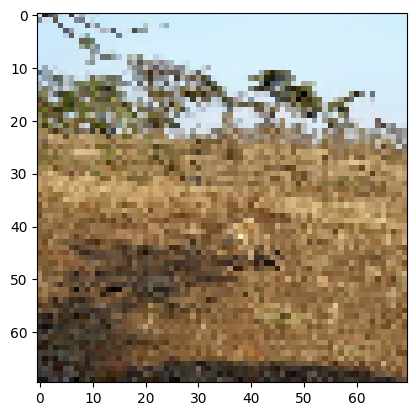

1/1 [==============================] - 0s 65ms/step
jaguar




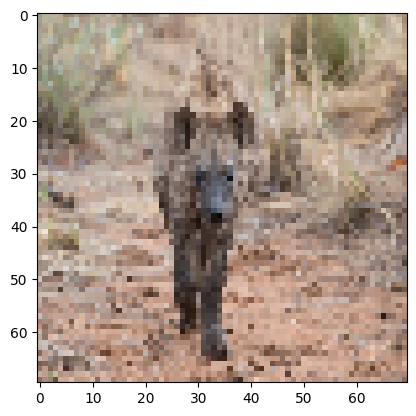

1/1 [==============================] - 0s 42ms/step
jaguar




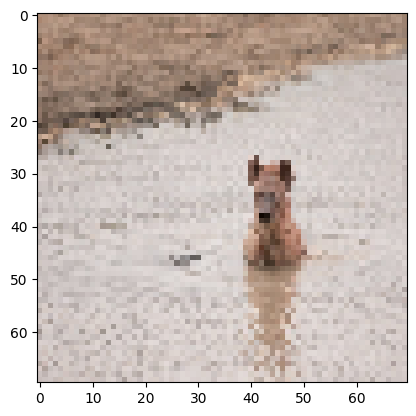

1/1 [==============================] - 0s 46ms/step
hyena




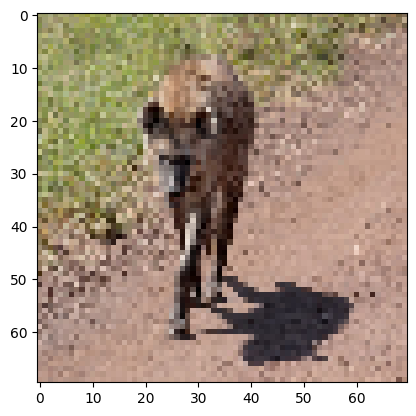

1/1 [==============================] - 0s 47ms/step
jaguar




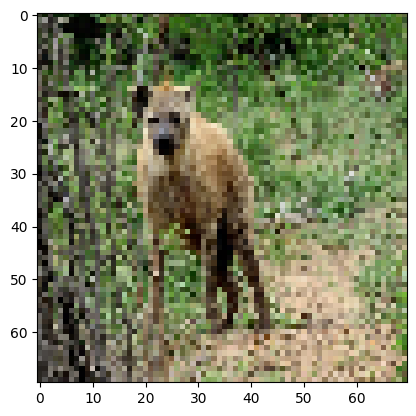

1/1 [==============================] - 0s 47ms/step
jaguar




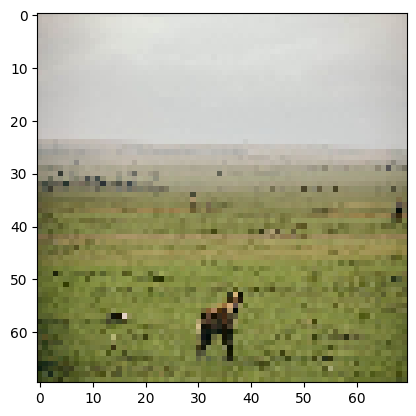

1/1 [==============================] - 0s 41ms/step
hyena




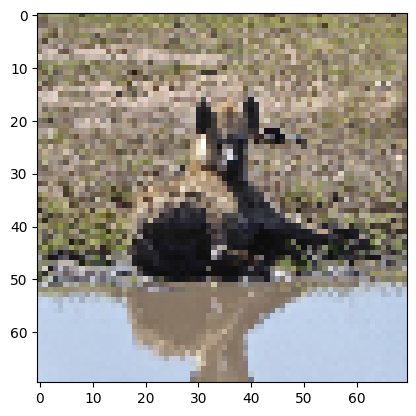

1/1 [==============================] - 0s 41ms/step
jaguar




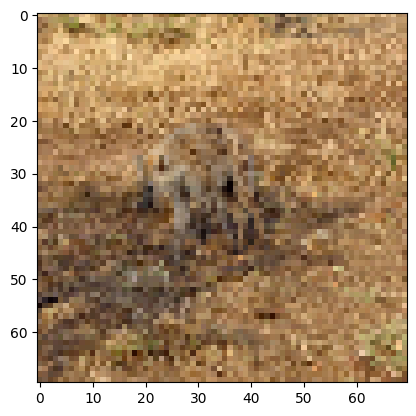

1/1 [==============================] - 0s 40ms/step
jaguar




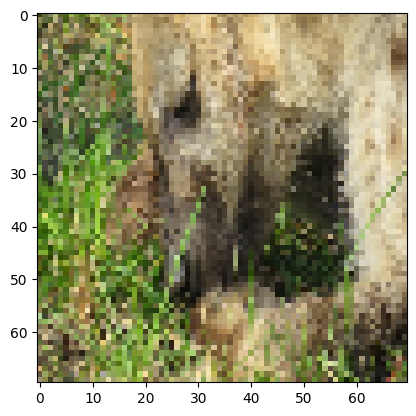

1/1 [==============================] - 0s 43ms/step
jaguar




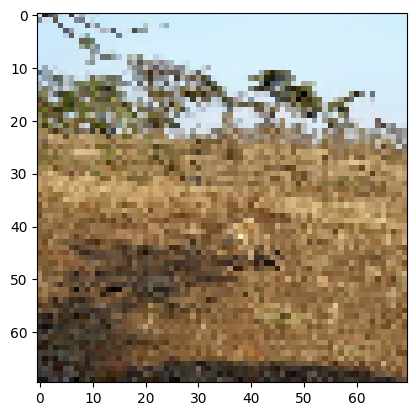

1/1 [==============================] - 0s 46ms/step
jaguar




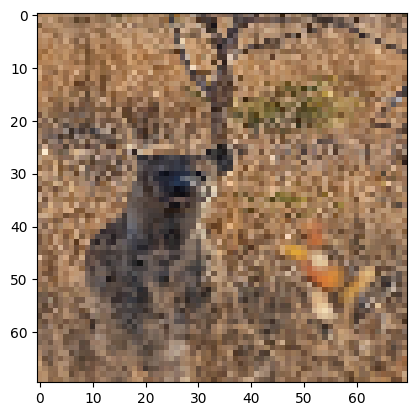

1/1 [==============================] - 0s 43ms/step
jaguar




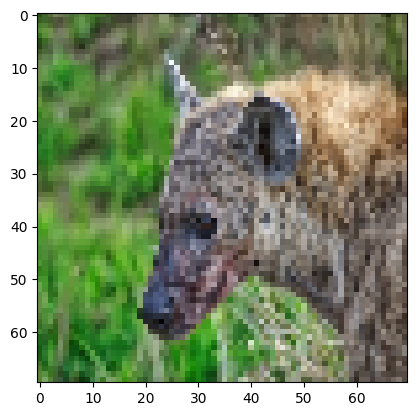

1/1 [==============================] - 0s 56ms/step
jaguar




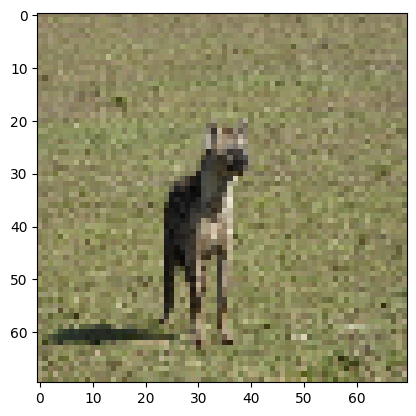

1/1 [==============================] - 0s 46ms/step
hyena




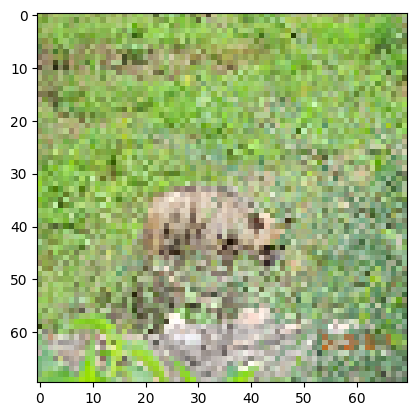

1/1 [==============================] - 0s 54ms/step
hyena




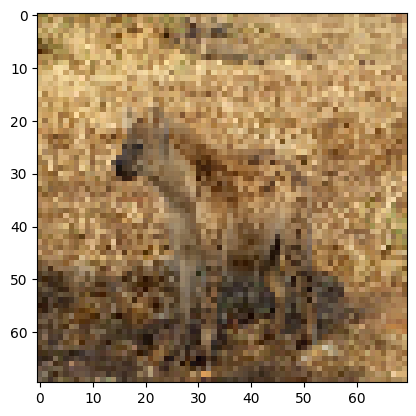

1/1 [==============================] - 0s 44ms/step
jaguar




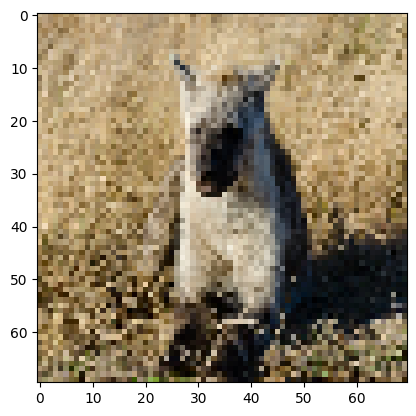

1/1 [==============================] - 0s 42ms/step
jaguar




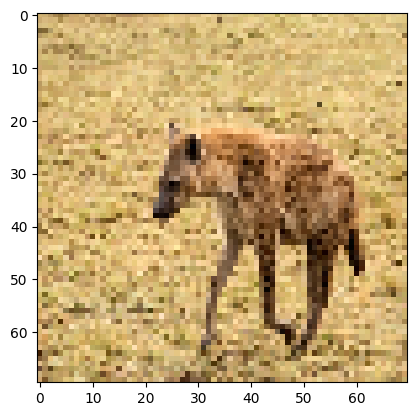

1/1 [==============================] - 0s 51ms/step
jaguar




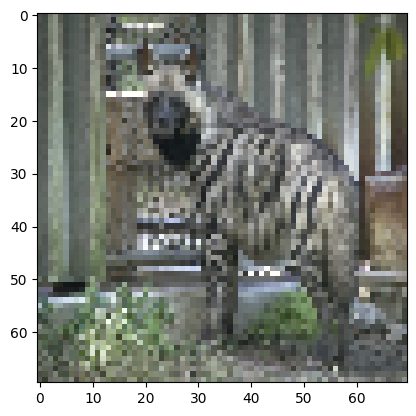

1/1 [==============================] - 0s 42ms/step
jaguar




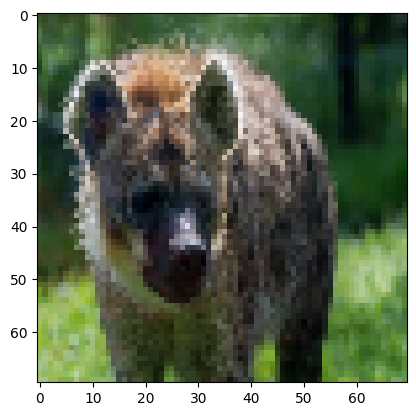

1/1 [==============================] - 0s 42ms/step
jaguar




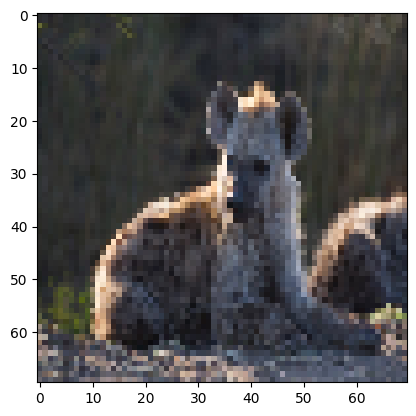

1/1 [==============================] - 0s 41ms/step
jaguar




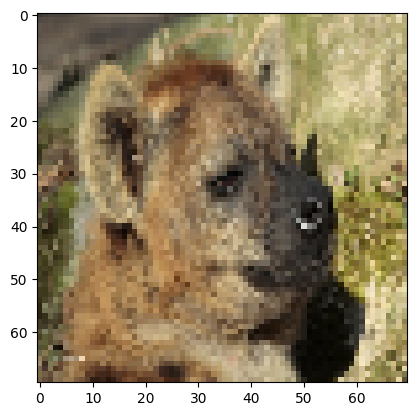

1/1 [==============================] - 0s 79ms/step
jaguar




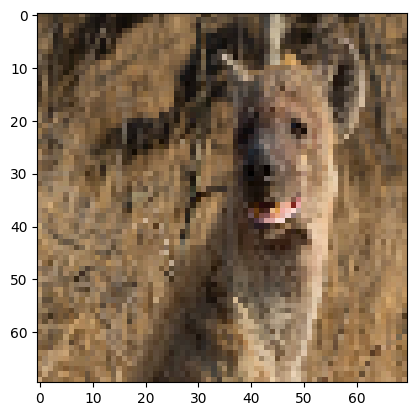

1/1 [==============================] - 0s 47ms/step
jaguar




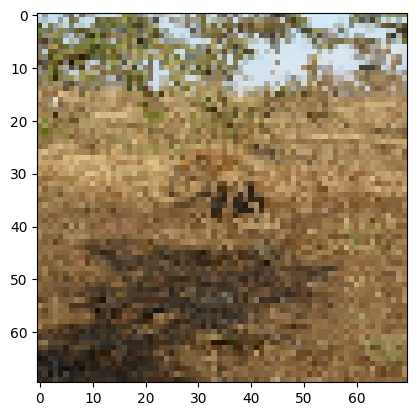

1/1 [==============================] - 0s 52ms/step
jaguar




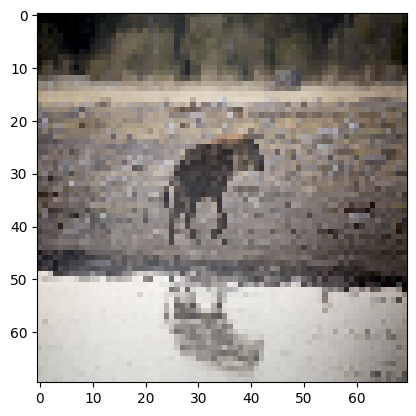

1/1 [==============================] - 0s 55ms/step
hyena




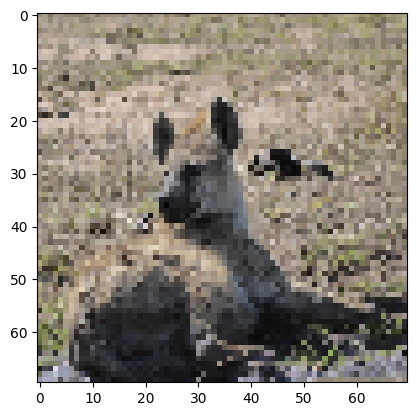

1/1 [==============================] - 0s 52ms/step
jaguar




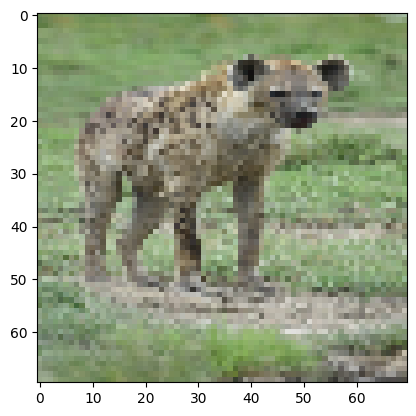

1/1 [==============================] - 0s 48ms/step
hyena




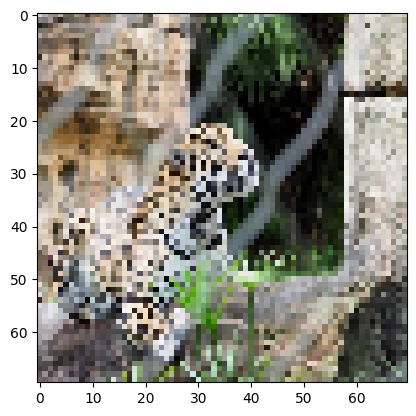

1/1 [==============================] - 0s 67ms/step
jaguar




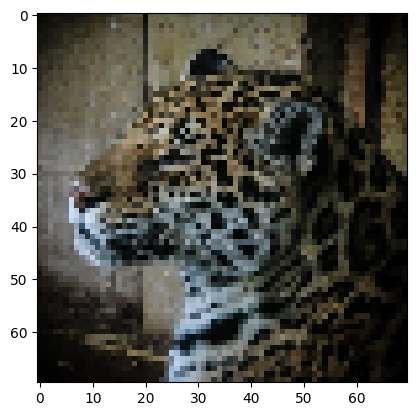

1/1 [==============================] - 0s 47ms/step
jaguar




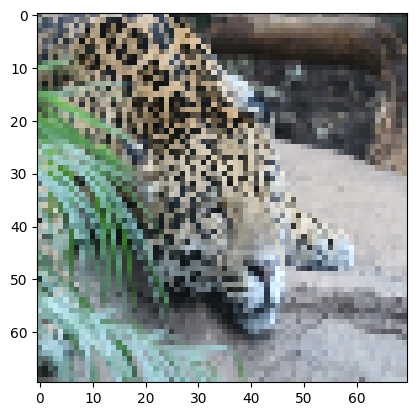

1/1 [==============================] - 0s 39ms/step
jaguar




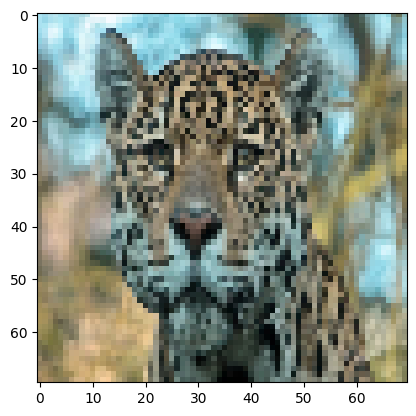

1/1 [==============================] - 0s 44ms/step
jaguar




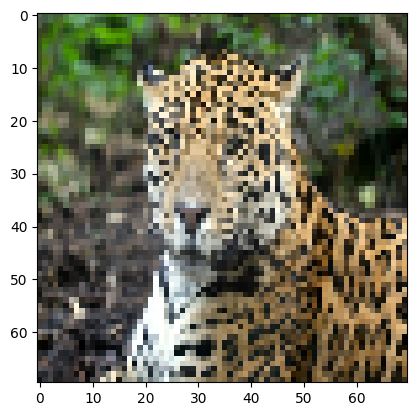

1/1 [==============================] - 0s 53ms/step
jaguar




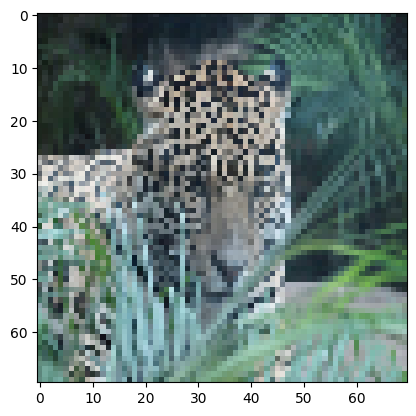

1/1 [==============================] - 0s 50ms/step
jaguar




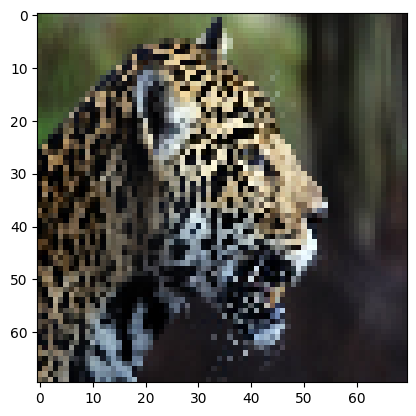

1/1 [==============================] - 0s 63ms/step
jaguar




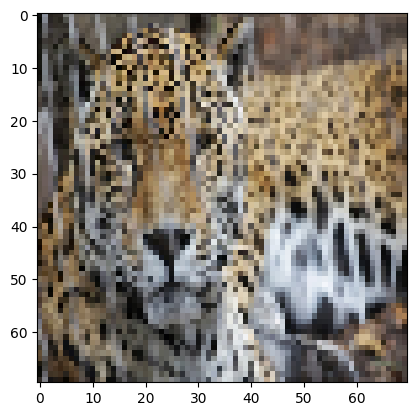

1/1 [==============================] - 0s 59ms/step
jaguar




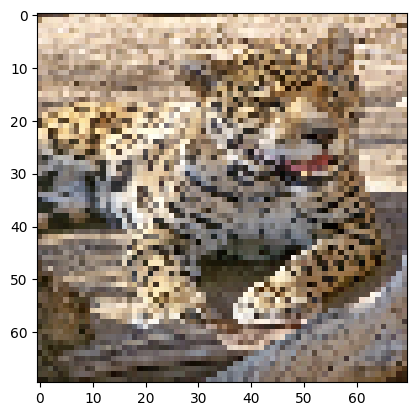

1/1 [==============================] - 0s 63ms/step
jaguar




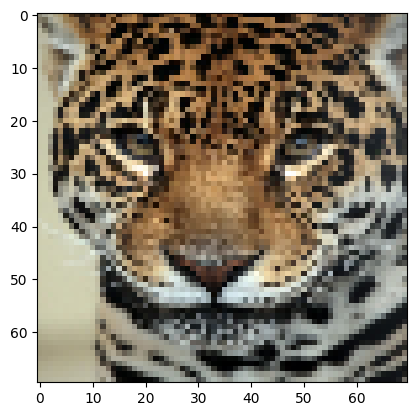

1/1 [==============================] - 0s 46ms/step
jaguar




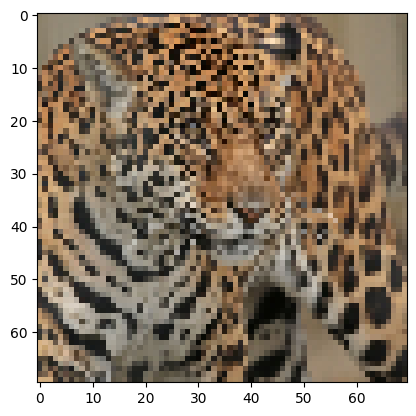

1/1 [==============================] - 0s 41ms/step
jaguar




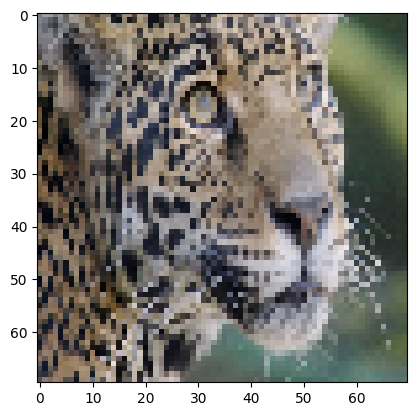

1/1 [==============================] - 0s 42ms/step
jaguar




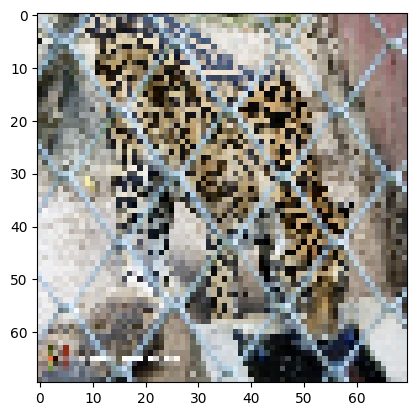

1/1 [==============================] - 0s 43ms/step
jaguar




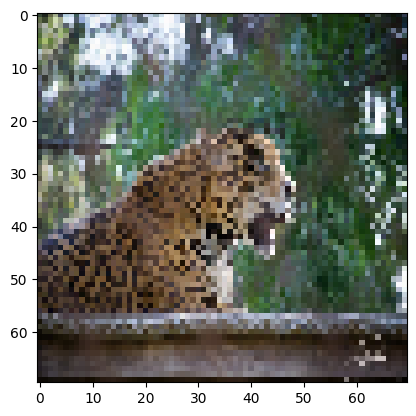

1/1 [==============================] - 0s 45ms/step
jaguar




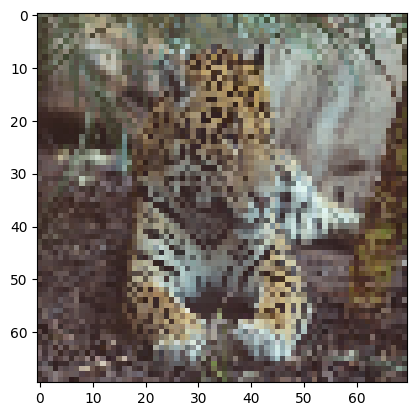

1/1 [==============================] - 0s 40ms/step
jaguar




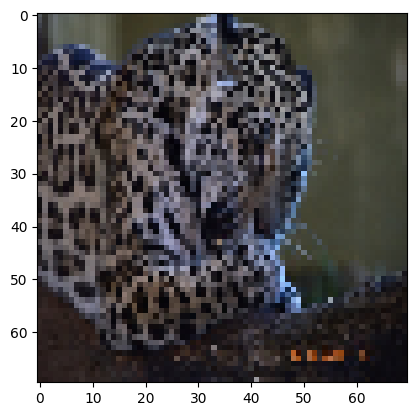

1/1 [==============================] - 0s 42ms/step
jaguar




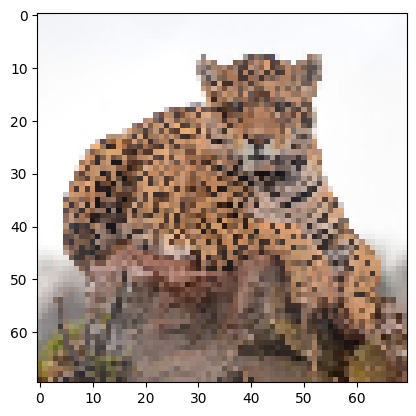

1/1 [==============================] - 0s 38ms/step
jaguar




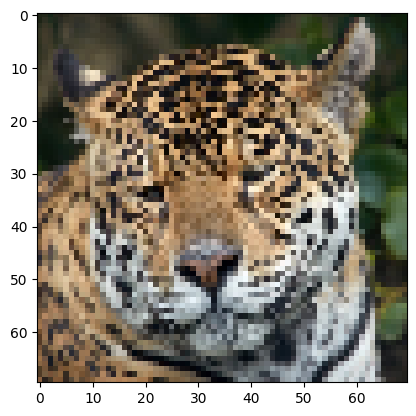

1/1 [==============================] - 0s 42ms/step
jaguar




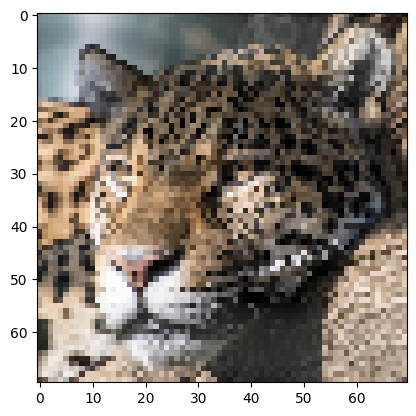

1/1 [==============================] - 0s 49ms/step
jaguar




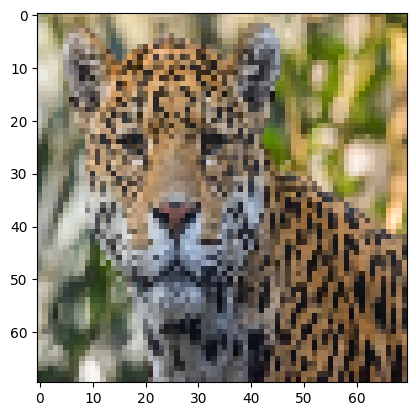

1/1 [==============================] - 0s 49ms/step
jaguar




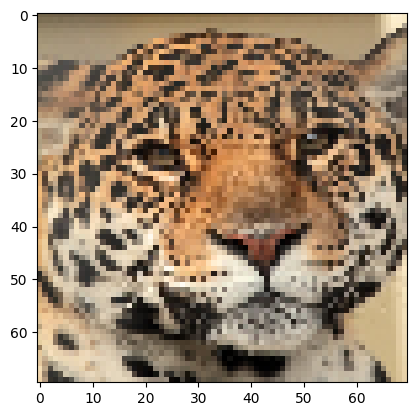

1/1 [==============================] - 0s 40ms/step
jaguar




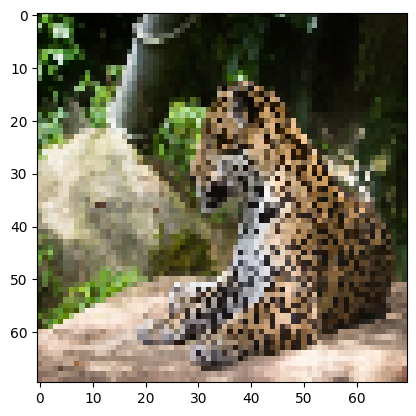

1/1 [==============================] - 0s 40ms/step
jaguar




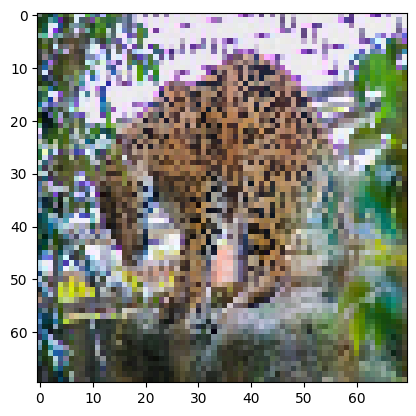

1/1 [==============================] - 0s 41ms/step
jaguar




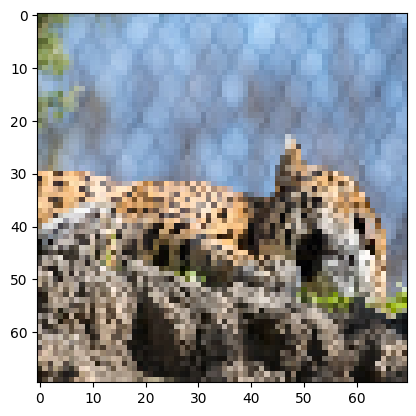

1/1 [==============================] - 0s 39ms/step
jaguar




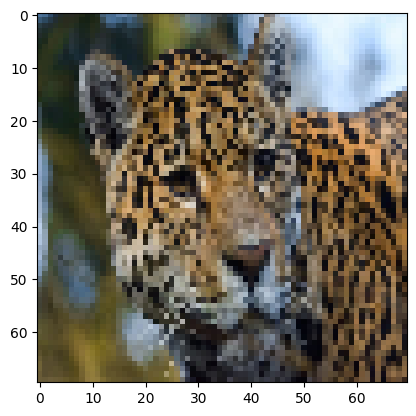

1/1 [==============================] - 0s 39ms/step
jaguar




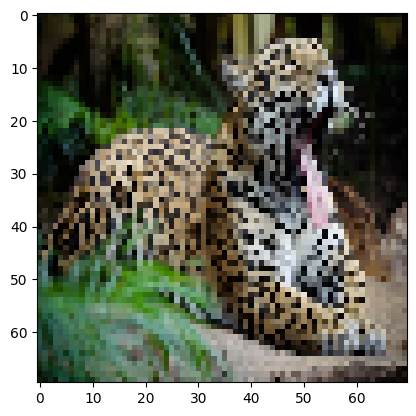

1/1 [==============================] - 0s 40ms/step
jaguar




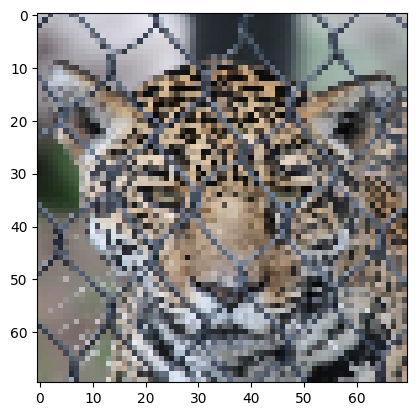

1/1 [==============================] - 0s 41ms/step
jaguar




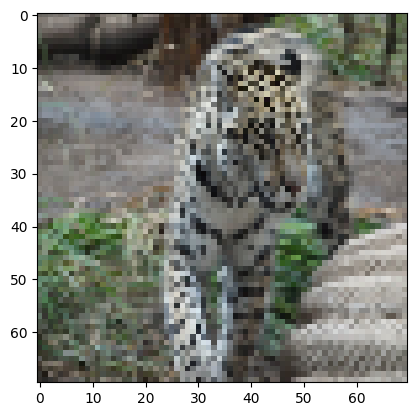

1/1 [==============================] - 0s 40ms/step
jaguar




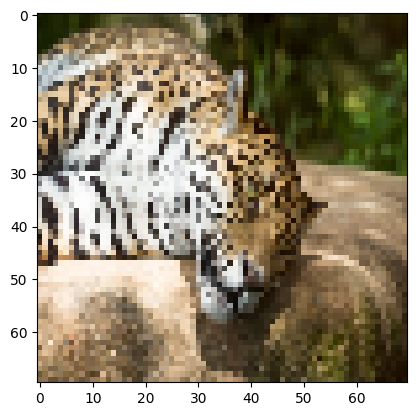

1/1 [==============================] - 0s 65ms/step
jaguar




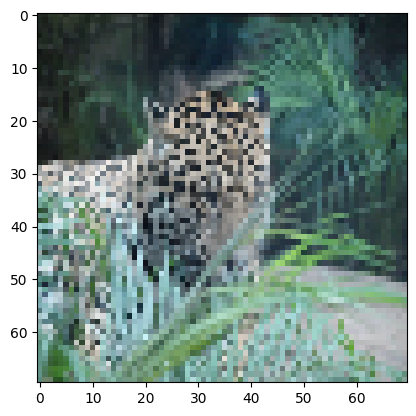

1/1 [==============================] - 0s 42ms/step
jaguar




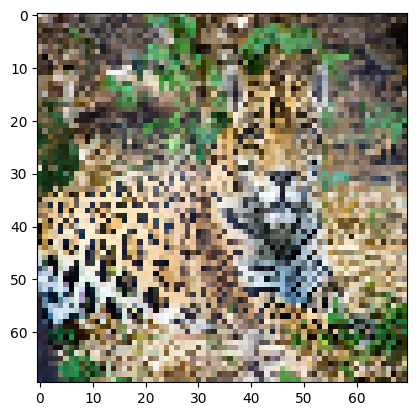

1/1 [==============================] - 0s 64ms/step
jaguar




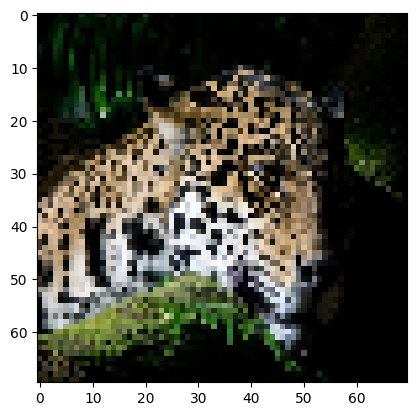

1/1 [==============================] - 0s 43ms/step
jaguar




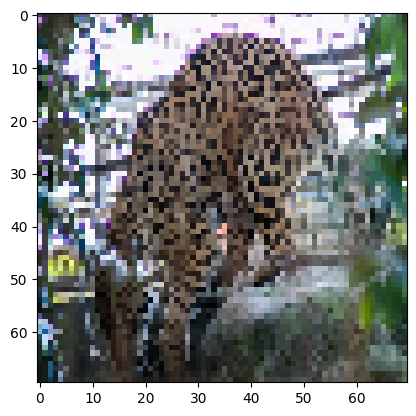

1/1 [==============================] - 0s 62ms/step
jaguar




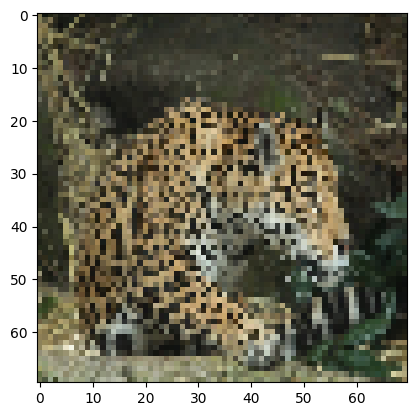

1/1 [==============================] - 0s 43ms/step
jaguar




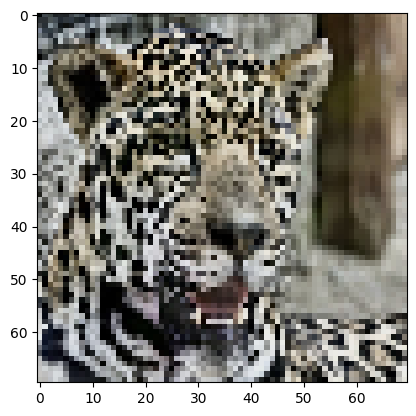

1/1 [==============================] - 0s 40ms/step
jaguar




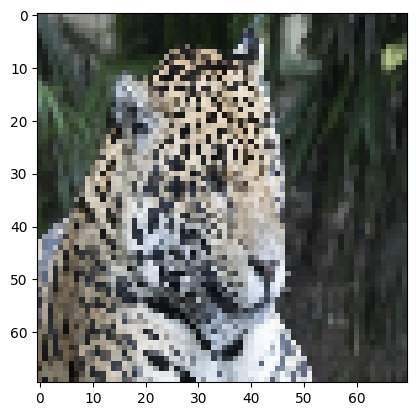

1/1 [==============================] - 0s 69ms/step
jaguar




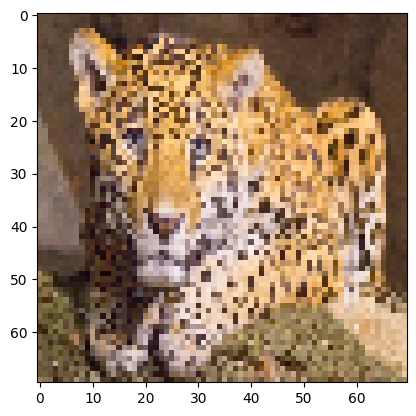

1/1 [==============================] - 0s 62ms/step
jaguar




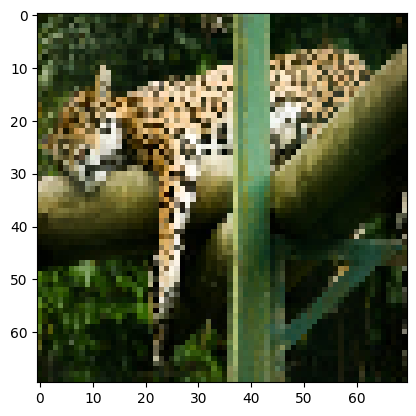

1/1 [==============================] - 0s 51ms/step
jaguar




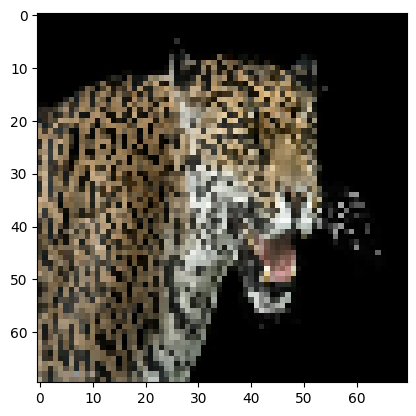

1/1 [==============================] - 0s 47ms/step
jaguar




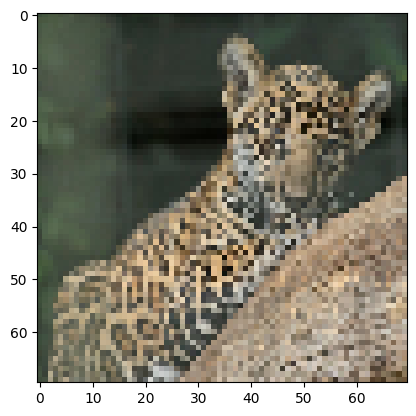

1/1 [==============================] - 0s 66ms/step
jaguar




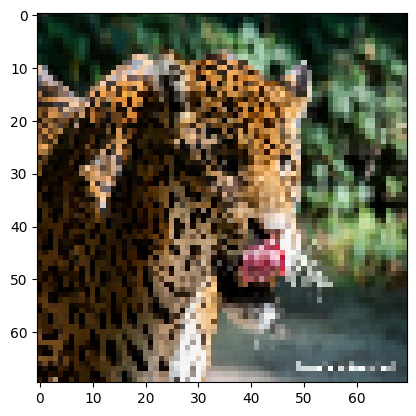

1/1 [==============================] - 0s 50ms/step
jaguar




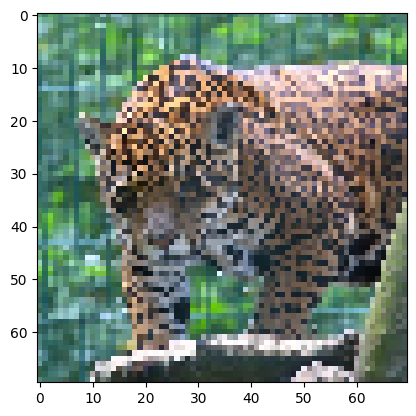

1/1 [==============================] - 0s 53ms/step
jaguar




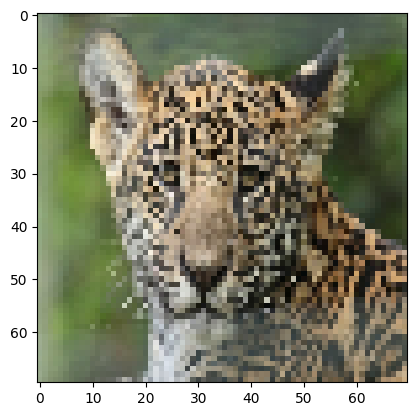

1/1 [==============================] - 0s 42ms/step
jaguar




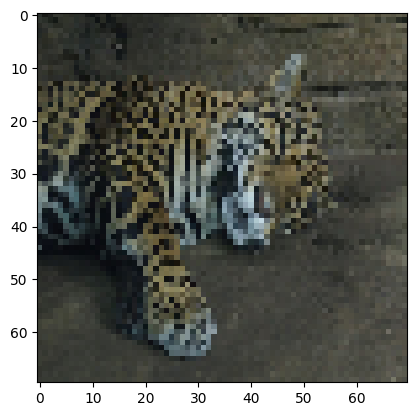

1/1 [==============================] - 0s 41ms/step
jaguar




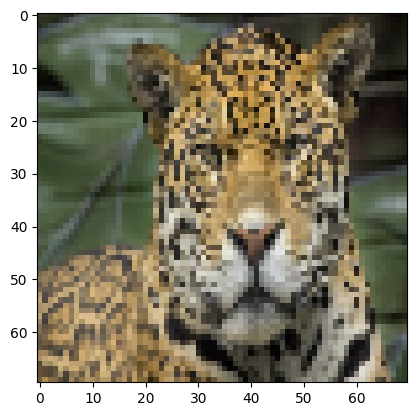

1/1 [==============================] - 0s 39ms/step
jaguar




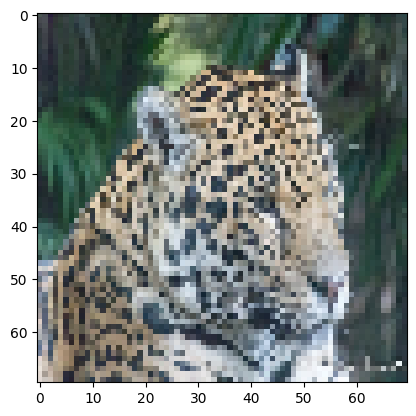

1/1 [==============================] - 0s 45ms/step
jaguar




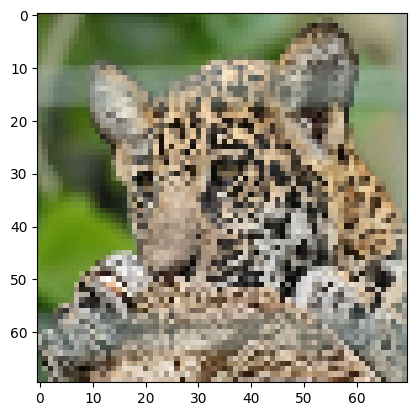

1/1 [==============================] - 0s 44ms/step
jaguar




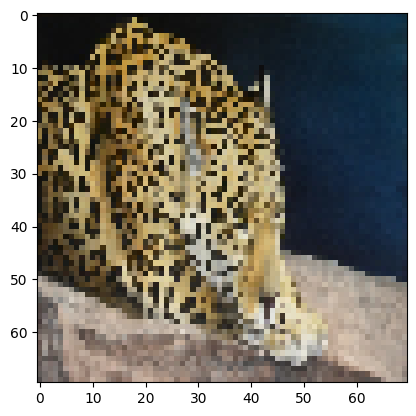

1/1 [==============================] - 0s 56ms/step
jaguar




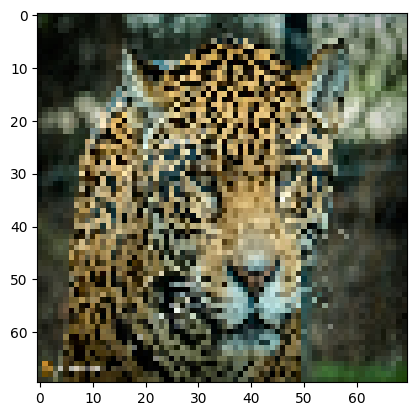

1/1 [==============================] - 0s 52ms/step
jaguar




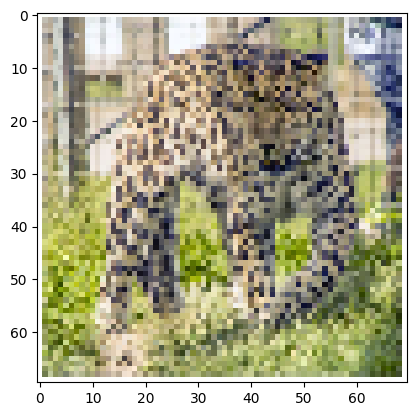

1/1 [==============================] - 0s 54ms/step
jaguar




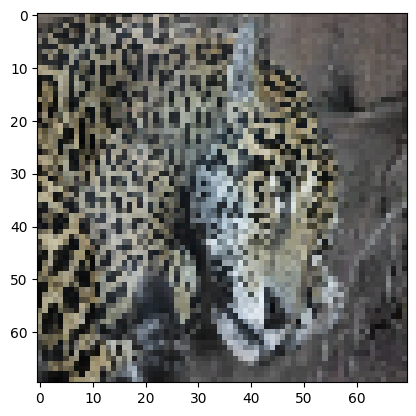

1/1 [==============================] - 0s 51ms/step
jaguar




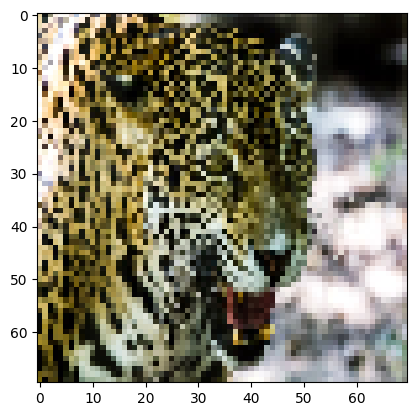

1/1 [==============================] - 0s 40ms/step
jaguar




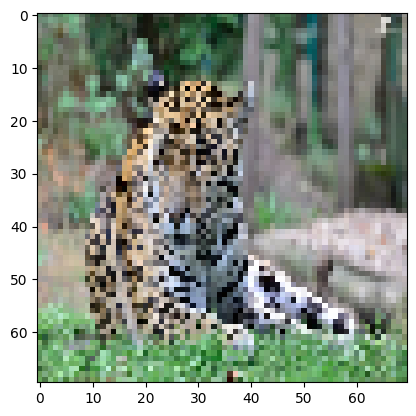

1/1 [==============================] - 0s 43ms/step
jaguar




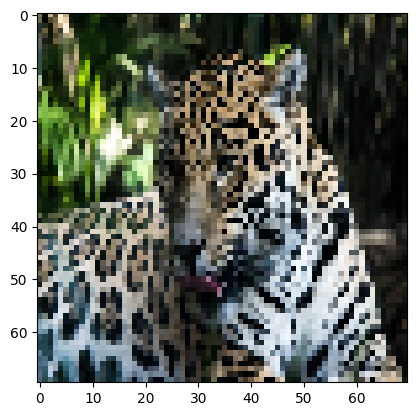

1/1 [==============================] - 0s 50ms/step
jaguar




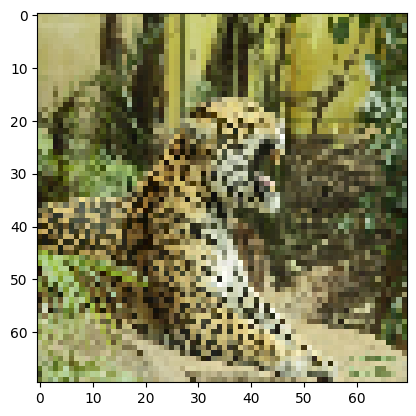

1/1 [==============================] - 0s 45ms/step
jaguar




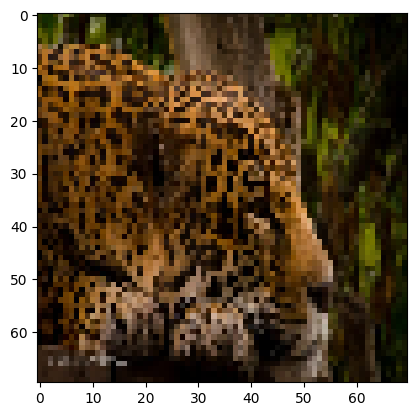

1/1 [==============================] - 0s 41ms/step
jaguar




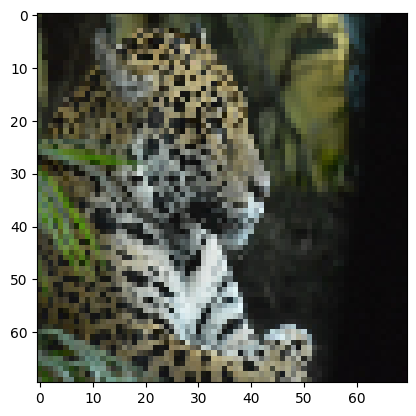

1/1 [==============================] - 0s 48ms/step
jaguar




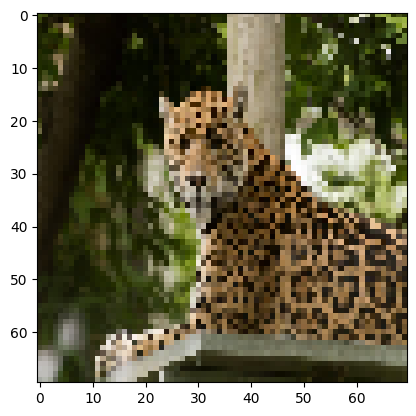

1/1 [==============================] - 0s 45ms/step
jaguar




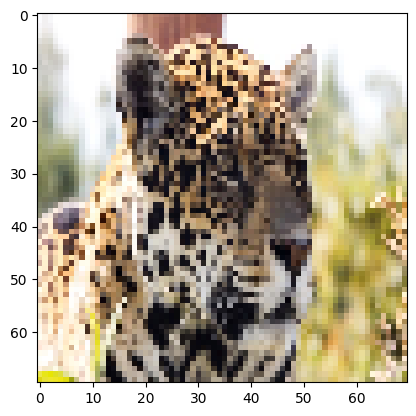

1/1 [==============================] - 0s 48ms/step
jaguar




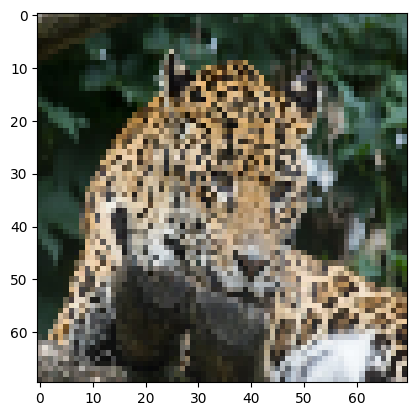

1/1 [==============================] - 0s 48ms/step
jaguar




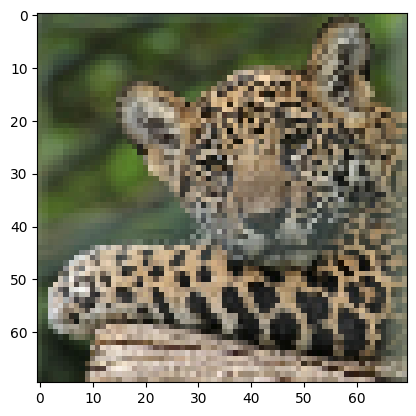

1/1 [==============================] - 0s 55ms/step
jaguar




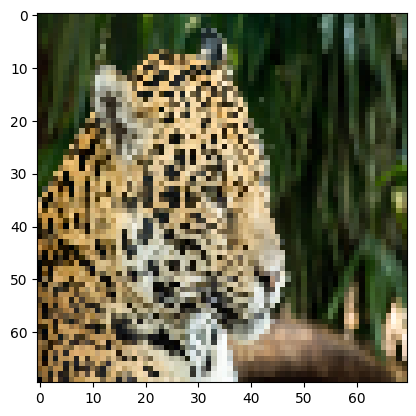

1/1 [==============================] - 0s 79ms/step
jaguar




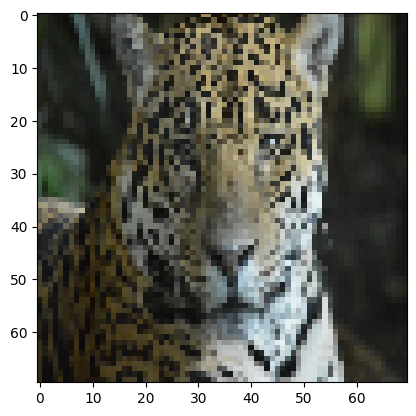

1/1 [==============================] - 0s 46ms/step
jaguar




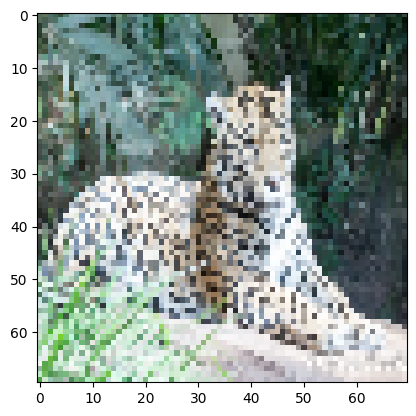

1/1 [==============================] - 0s 61ms/step
jaguar




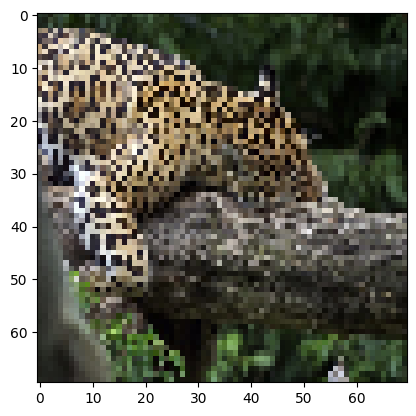

1/1 [==============================] - 0s 48ms/step
jaguar




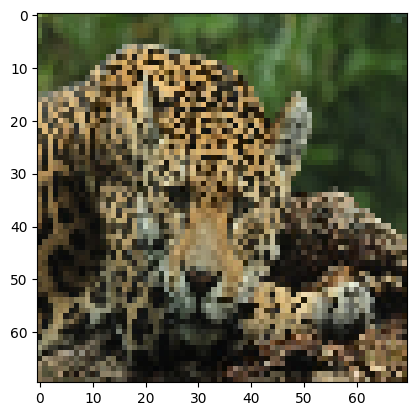

1/1 [==============================] - 0s 55ms/step
jaguar




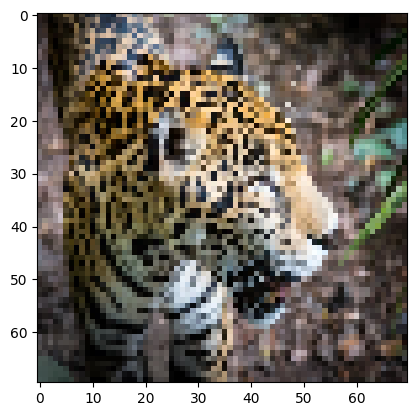

1/1 [==============================] - 0s 87ms/step
jaguar




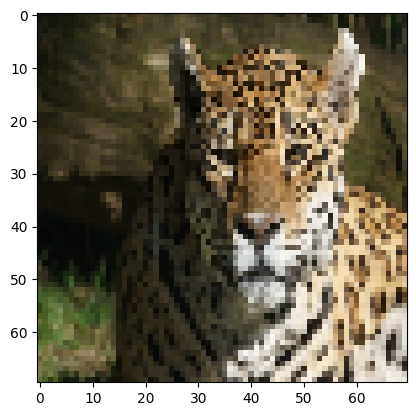

1/1 [==============================] - 0s 59ms/step
jaguar




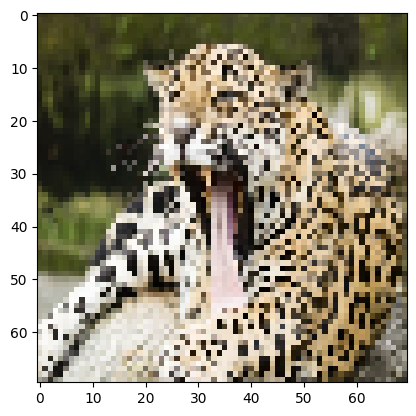

1/1 [==============================] - 0s 65ms/step
jaguar




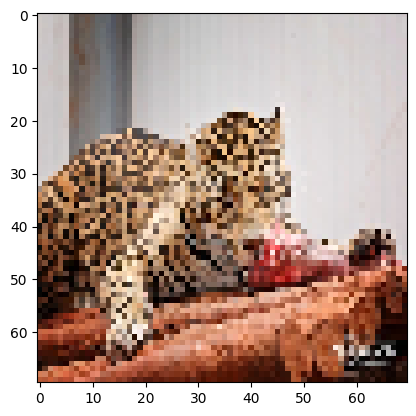

1/1 [==============================] - 0s 65ms/step
jaguar




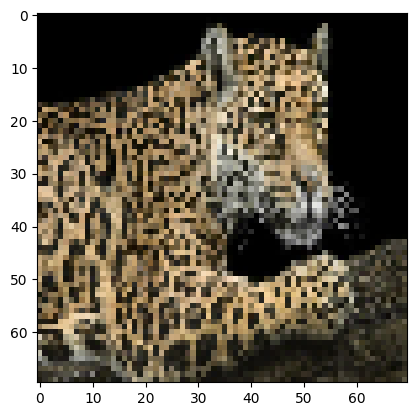

1/1 [==============================] - 0s 46ms/step
jaguar




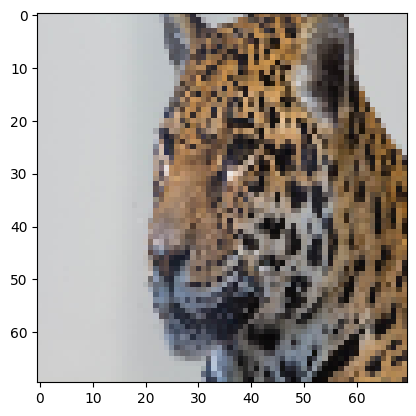

1/1 [==============================] - 0s 49ms/step
jaguar




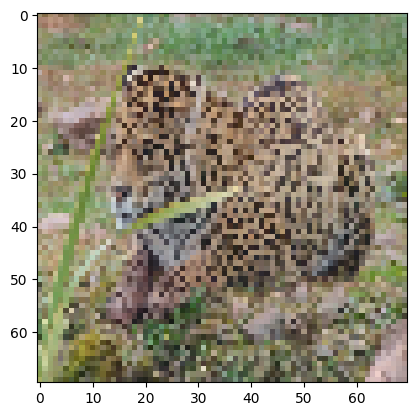

1/1 [==============================] - 0s 57ms/step
jaguar




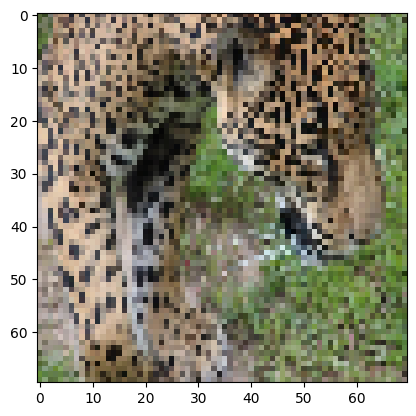

1/1 [==============================] - 0s 45ms/step
jaguar




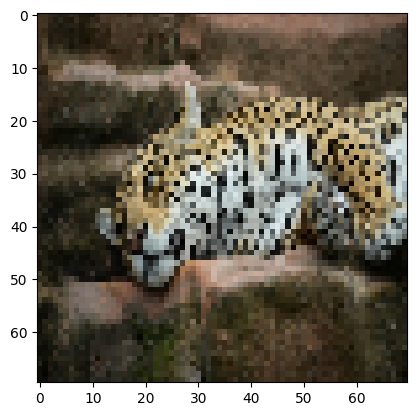

1/1 [==============================] - 0s 63ms/step
jaguar




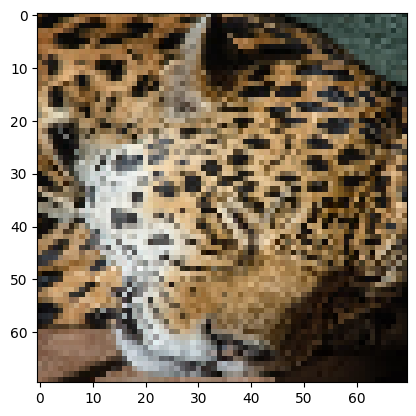

1/1 [==============================] - 0s 40ms/step
jaguar




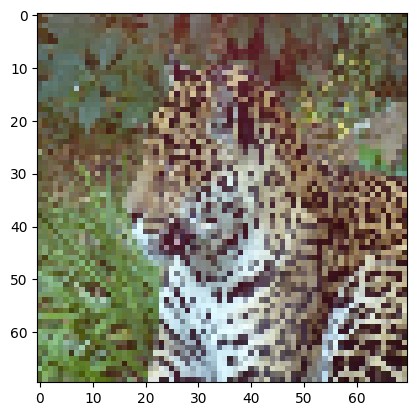

1/1 [==============================] - 0s 39ms/step
jaguar




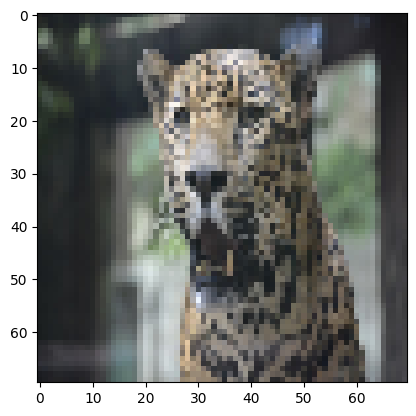

1/1 [==============================] - 0s 48ms/step
jaguar




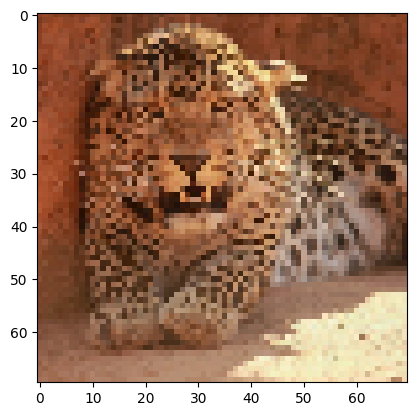

1/1 [==============================] - 0s 40ms/step
jaguar




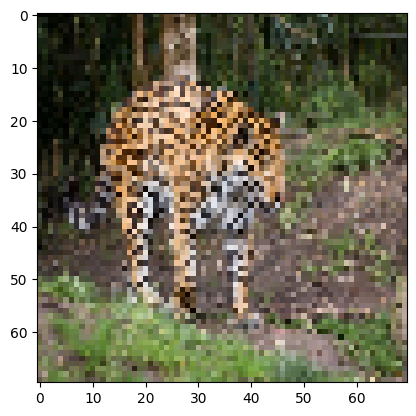

1/1 [==============================] - 0s 40ms/step
jaguar




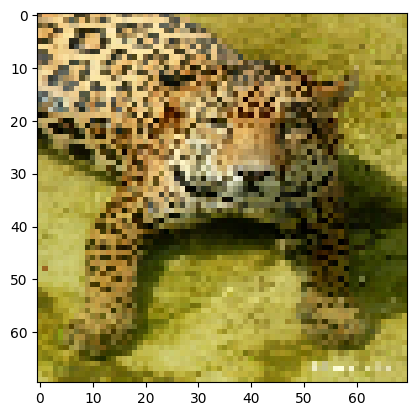

1/1 [==============================] - 0s 40ms/step
jaguar




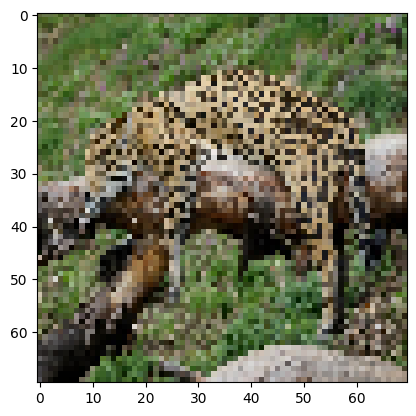

1/1 [==============================] - 0s 45ms/step
jaguar




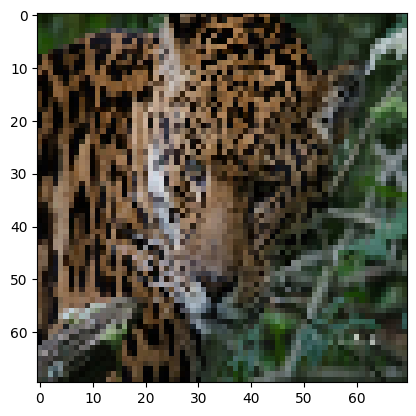

1/1 [==============================] - 0s 39ms/step
jaguar




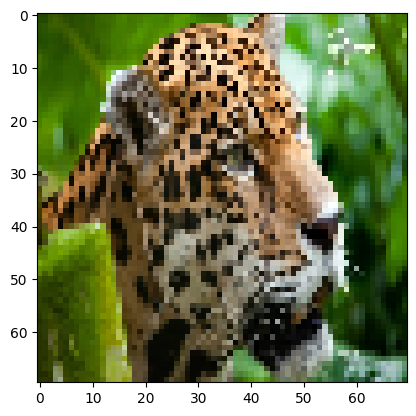

1/1 [==============================] - 0s 42ms/step
jaguar




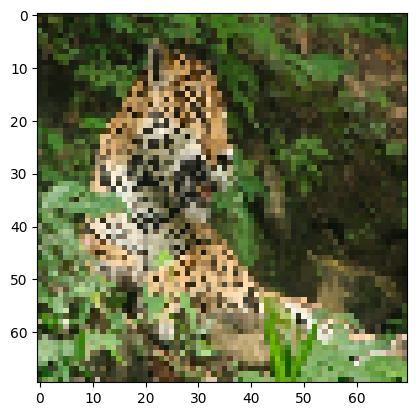

1/1 [==============================] - 0s 40ms/step
jaguar




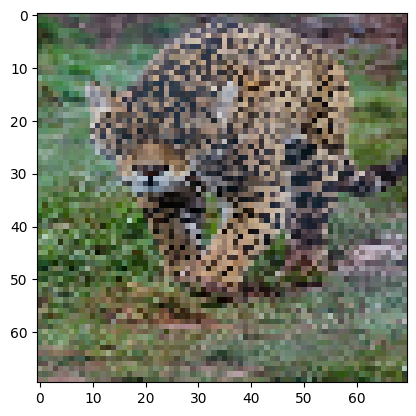

1/1 [==============================] - 0s 44ms/step
jaguar




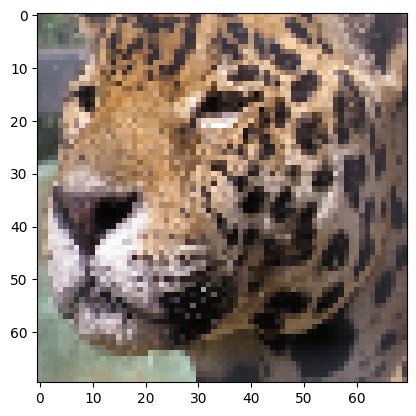

1/1 [==============================] - 0s 41ms/step
jaguar




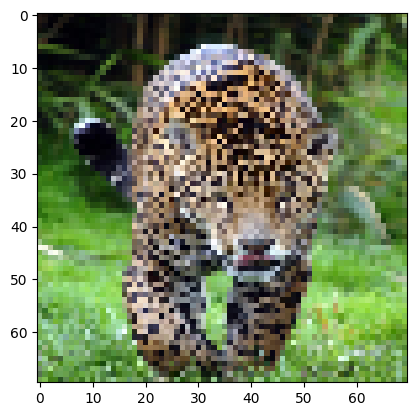

1/1 [==============================] - 0s 66ms/step
jaguar




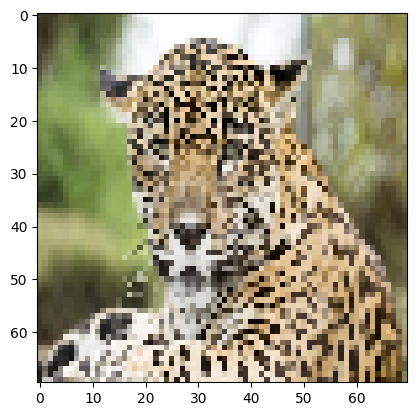

1/1 [==============================] - 0s 47ms/step
jaguar




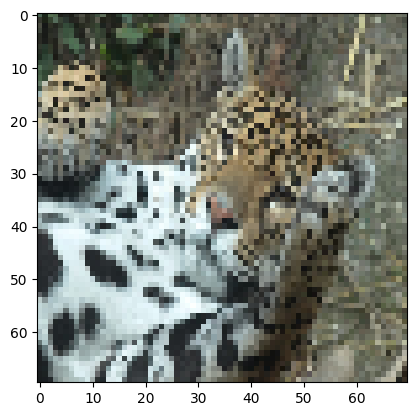

1/1 [==============================] - 0s 42ms/step
jaguar




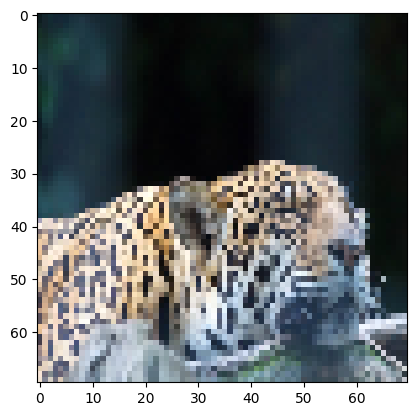

1/1 [==============================] - 0s 44ms/step
jaguar




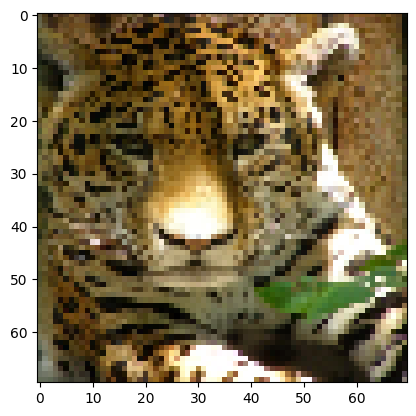

1/1 [==============================] - 0s 38ms/step
jaguar




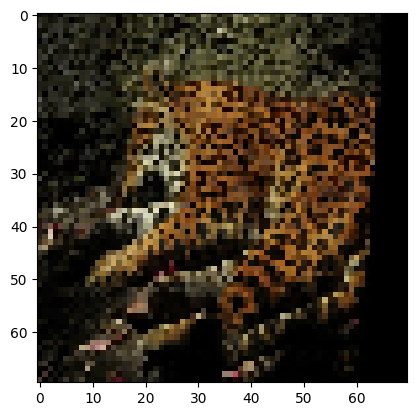

1/1 [==============================] - 0s 88ms/step
jaguar




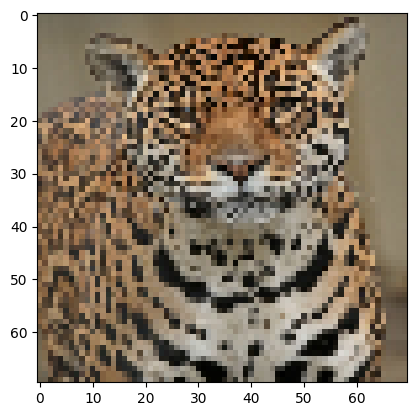

1/1 [==============================] - 0s 70ms/step
jaguar




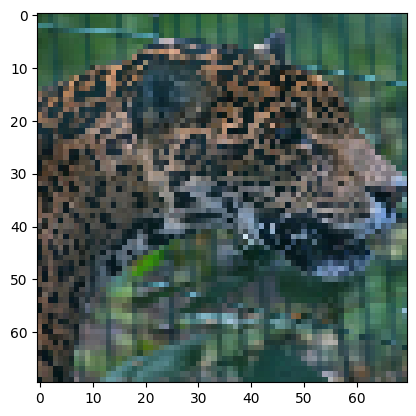

1/1 [==============================] - 0s 45ms/step
jaguar




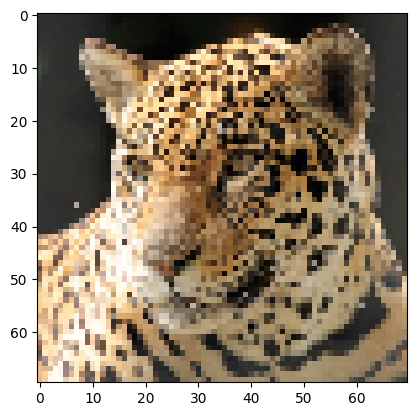

1/1 [==============================] - 0s 51ms/step
jaguar




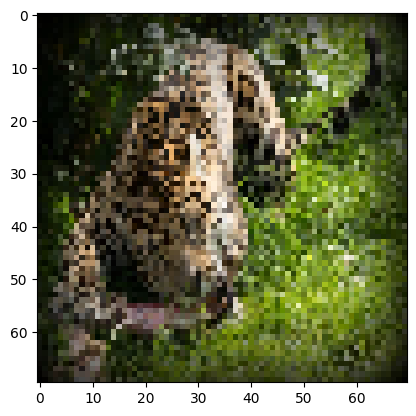

1/1 [==============================] - 0s 41ms/step
jaguar




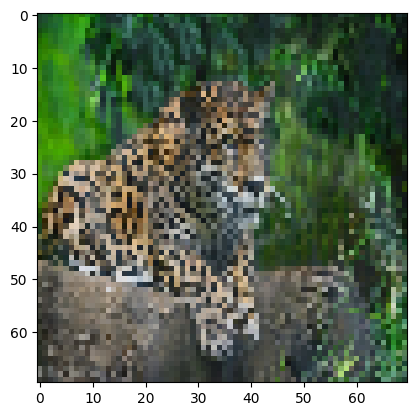

1/1 [==============================] - 0s 41ms/step
jaguar




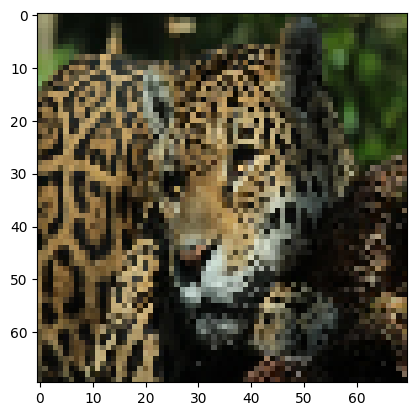

1/1 [==============================] - 0s 56ms/step
jaguar




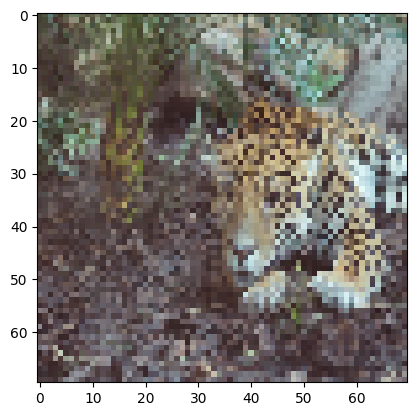

1/1 [==============================] - 0s 66ms/step
jaguar




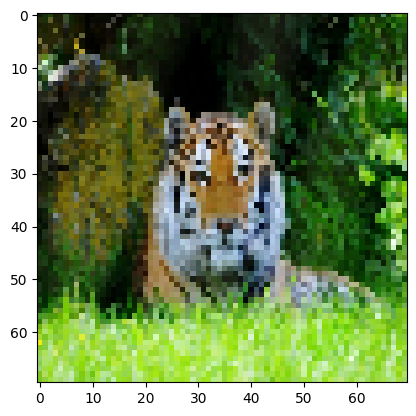

1/1 [==============================] - 0s 43ms/step
jaguar




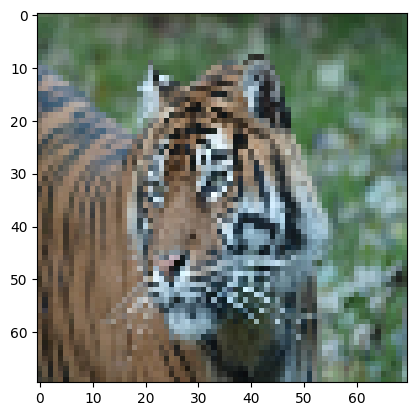

1/1 [==============================] - 0s 75ms/step
jaguar




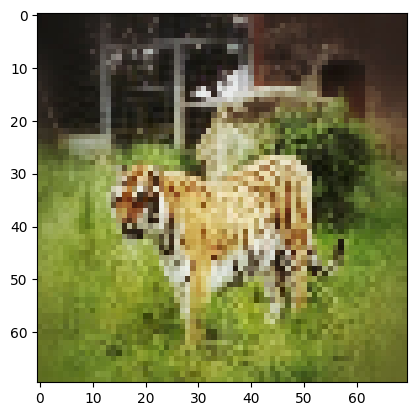

1/1 [==============================] - 0s 49ms/step
jaguar




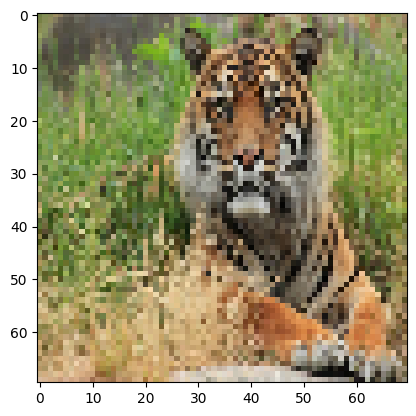

1/1 [==============================] - 0s 53ms/step
jaguar




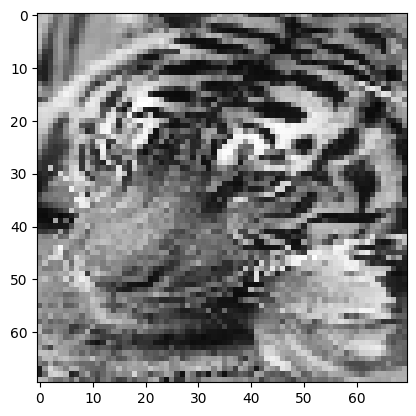

1/1 [==============================] - 0s 62ms/step
jaguar




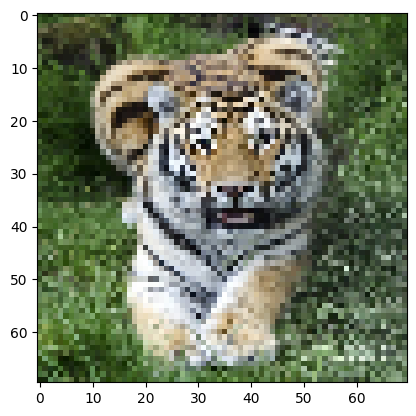

1/1 [==============================] - 0s 75ms/step
jaguar




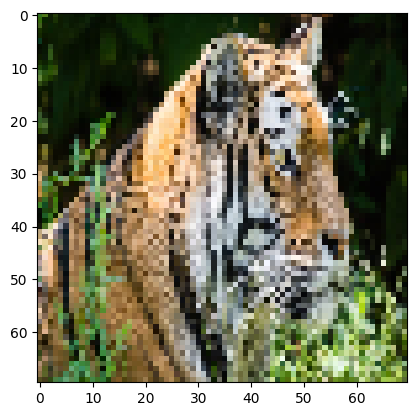

1/1 [==============================] - 0s 45ms/step
jaguar




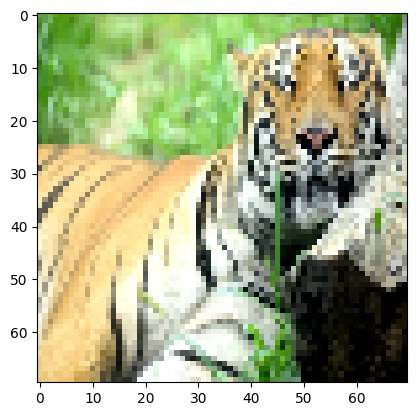

1/1 [==============================] - 0s 46ms/step
jaguar




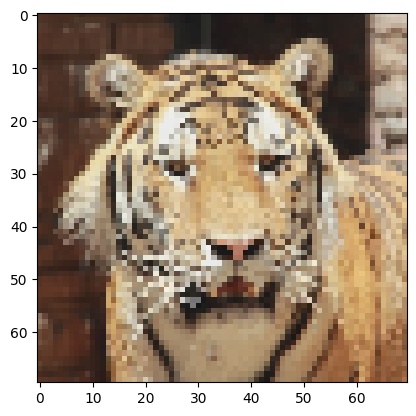

1/1 [==============================] - 0s 42ms/step
jaguar




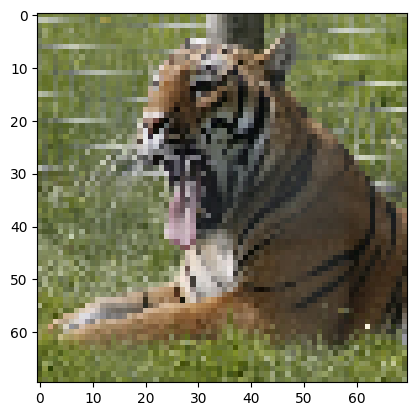

1/1 [==============================] - 0s 43ms/step
jaguar




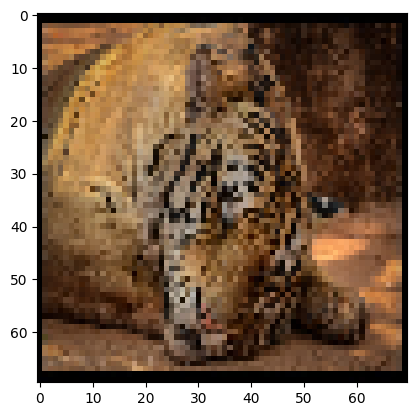

1/1 [==============================] - 0s 43ms/step
jaguar




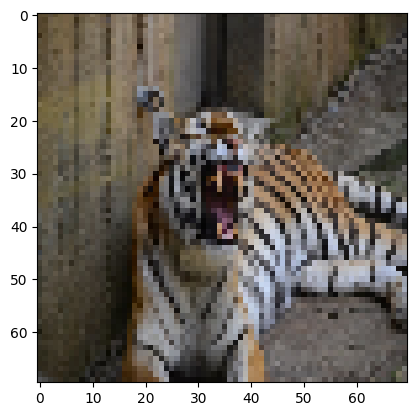

1/1 [==============================] - 0s 42ms/step
jaguar




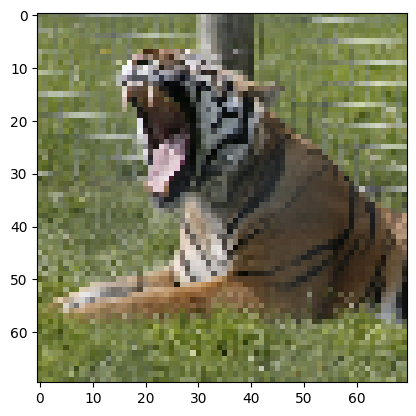

1/1 [==============================] - 0s 48ms/step
jaguar




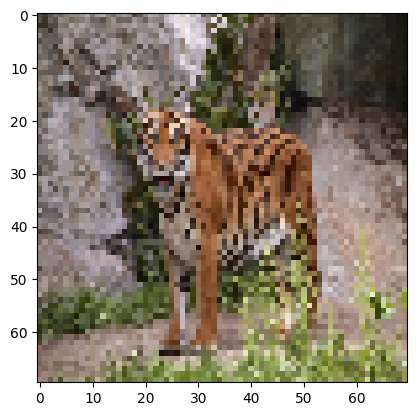

1/1 [==============================] - 0s 42ms/step
jaguar




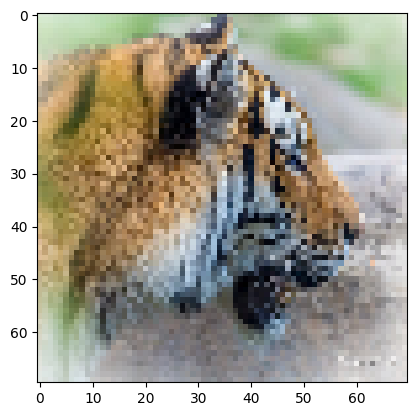

1/1 [==============================] - 0s 44ms/step
jaguar




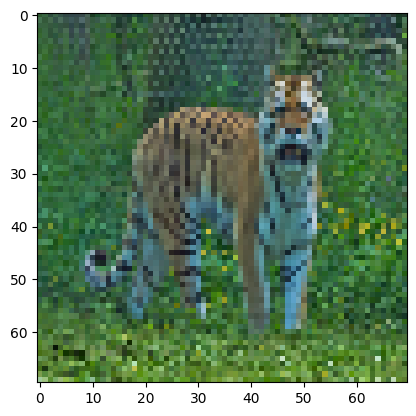

1/1 [==============================] - 0s 40ms/step
jaguar




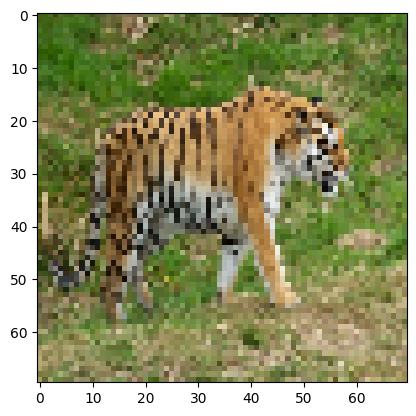

1/1 [==============================] - 0s 55ms/step
jaguar




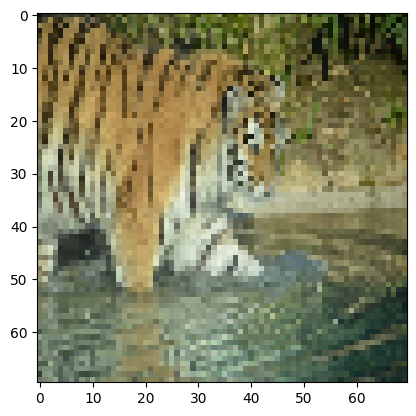

1/1 [==============================] - 0s 44ms/step
jaguar




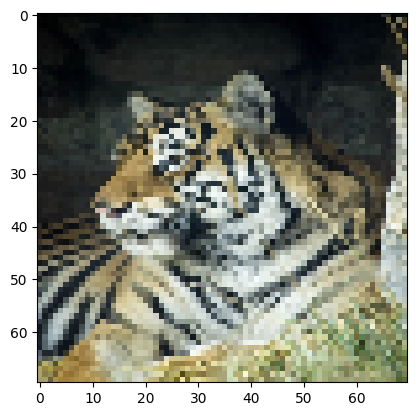

1/1 [==============================] - 0s 55ms/step
jaguar




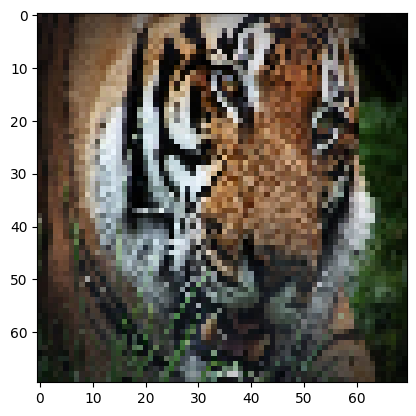

1/1 [==============================] - 0s 44ms/step
jaguar




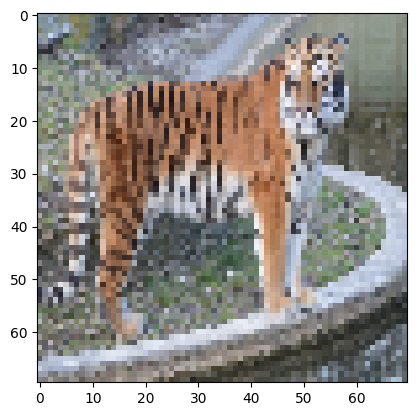

1/1 [==============================] - 0s 51ms/step
jaguar




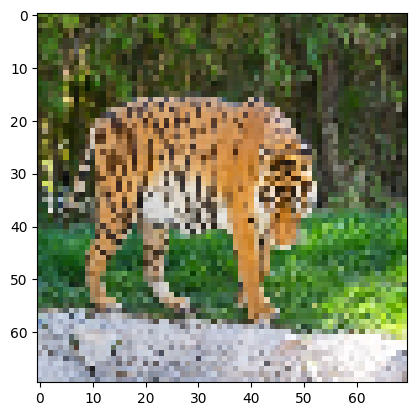

1/1 [==============================] - 0s 44ms/step
jaguar




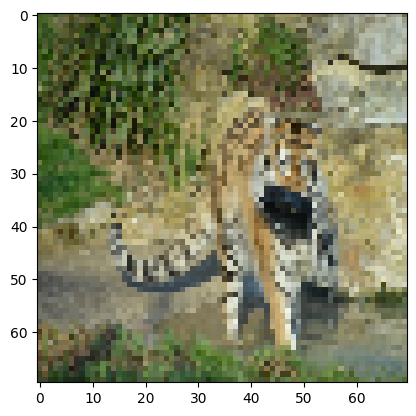

1/1 [==============================] - 0s 49ms/step
jaguar




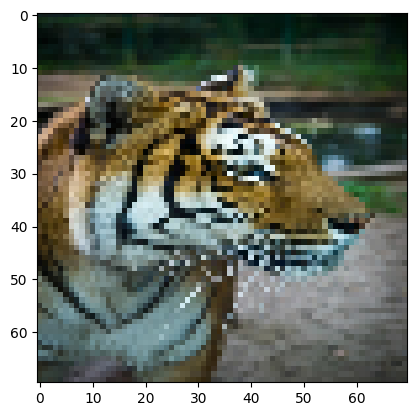

1/1 [==============================] - 0s 41ms/step
jaguar




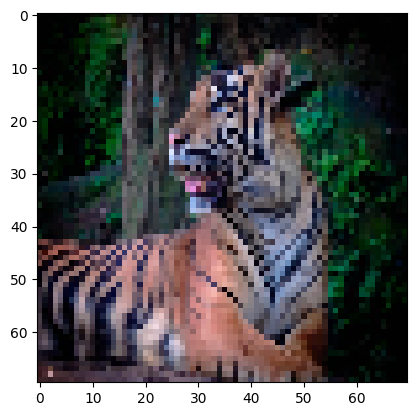

1/1 [==============================] - 0s 44ms/step
jaguar




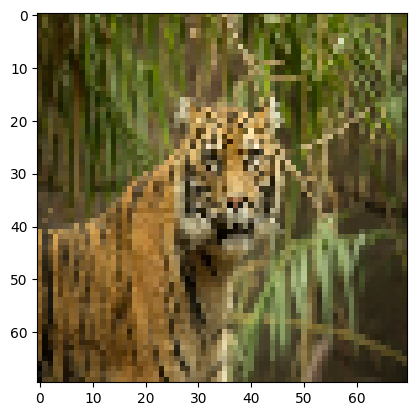

1/1 [==============================] - 0s 55ms/step
jaguar




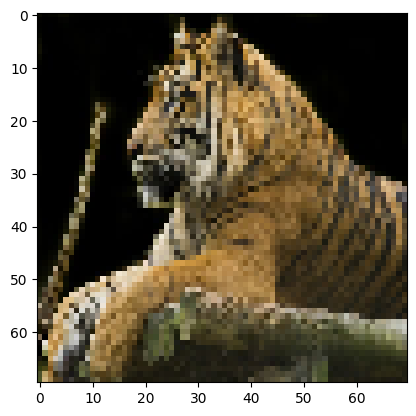

1/1 [==============================] - 0s 96ms/step
jaguar




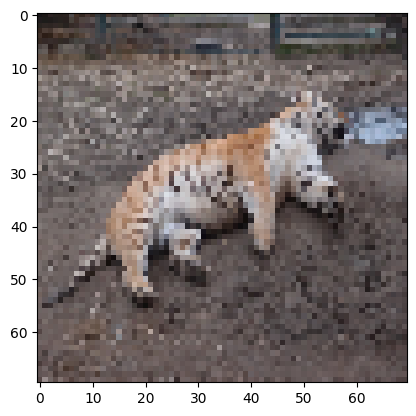

1/1 [==============================] - 0s 42ms/step
jaguar




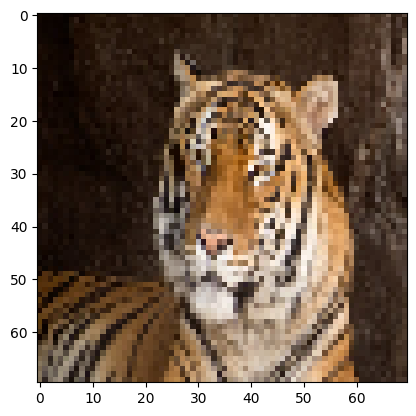

1/1 [==============================] - 0s 51ms/step
jaguar




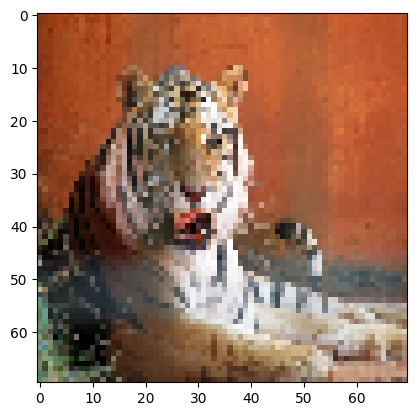

1/1 [==============================] - 0s 57ms/step
jaguar




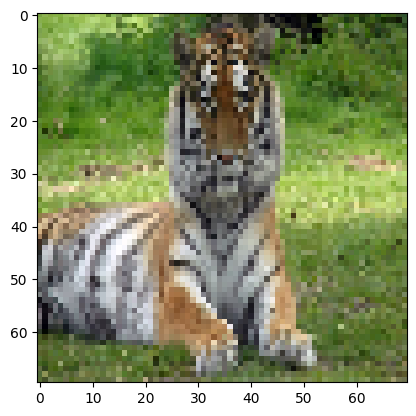

1/1 [==============================] - 0s 73ms/step
jaguar




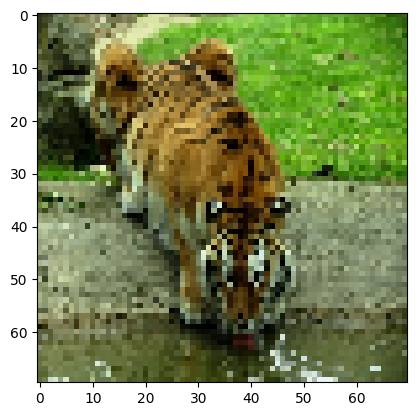

1/1 [==============================] - 0s 49ms/step
jaguar




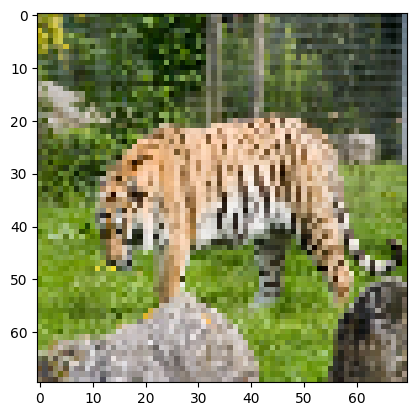

1/1 [==============================] - 0s 40ms/step
jaguar




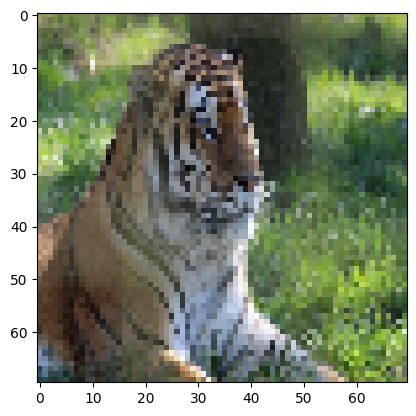

1/1 [==============================] - 0s 75ms/step
jaguar




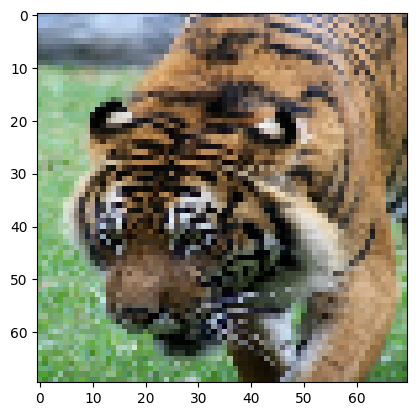

1/1 [==============================] - 0s 67ms/step
jaguar




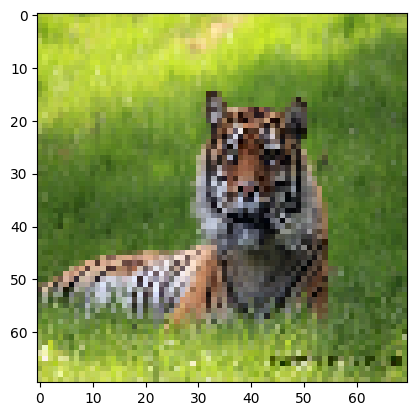

1/1 [==============================] - 0s 82ms/step
jaguar




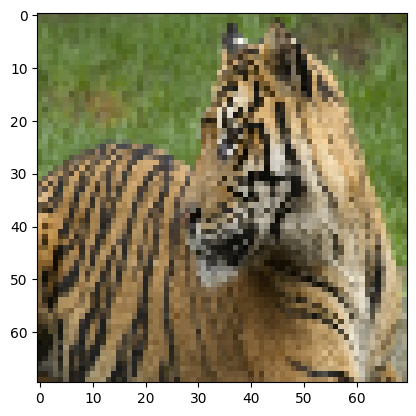

1/1 [==============================] - 0s 53ms/step
jaguar




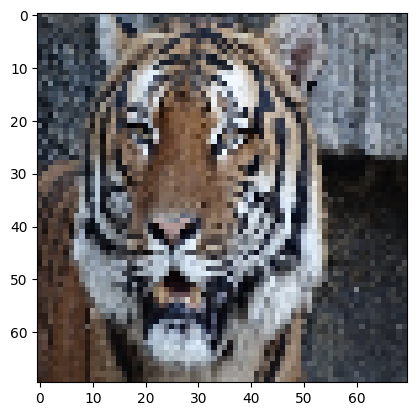

1/1 [==============================] - 0s 43ms/step
jaguar




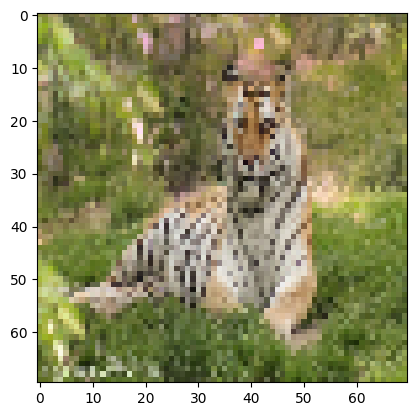

1/1 [==============================] - 0s 39ms/step
jaguar




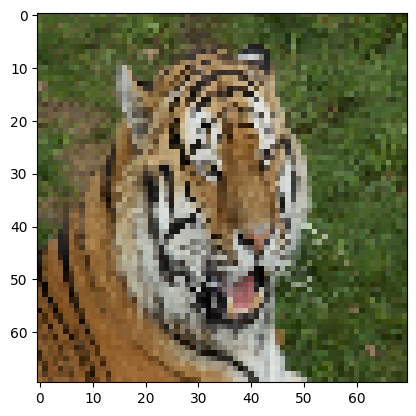

1/1 [==============================] - 0s 41ms/step
jaguar




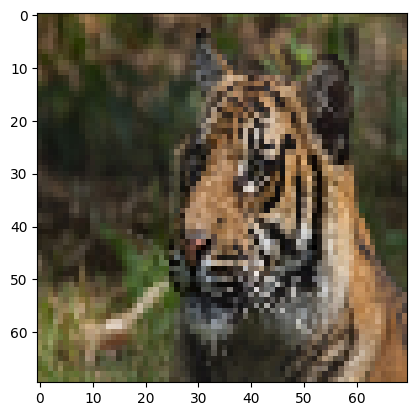

1/1 [==============================] - 0s 39ms/step
jaguar




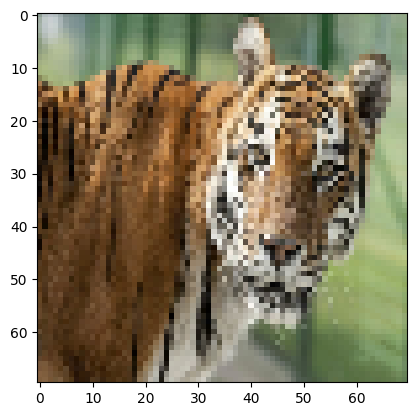

1/1 [==============================] - 0s 41ms/step
jaguar




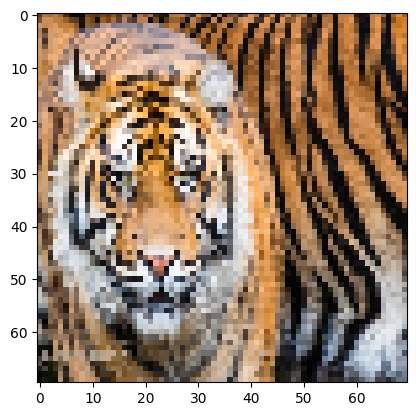

1/1 [==============================] - 0s 44ms/step
jaguar




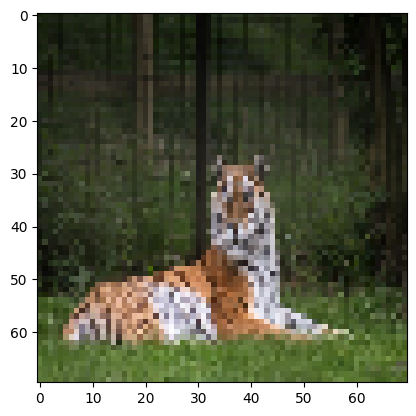

1/1 [==============================] - 0s 47ms/step
jaguar




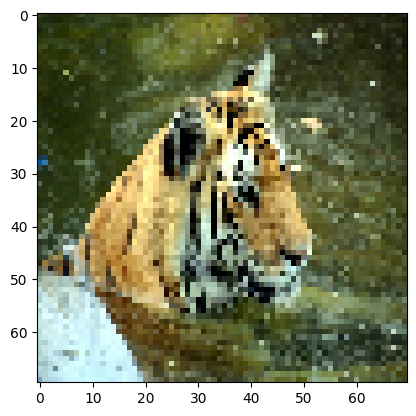

1/1 [==============================] - 0s 39ms/step
jaguar




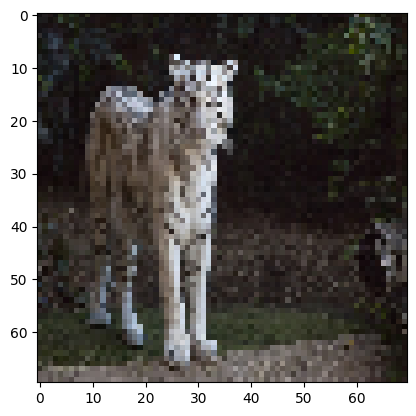

1/1 [==============================] - 0s 39ms/step
jaguar




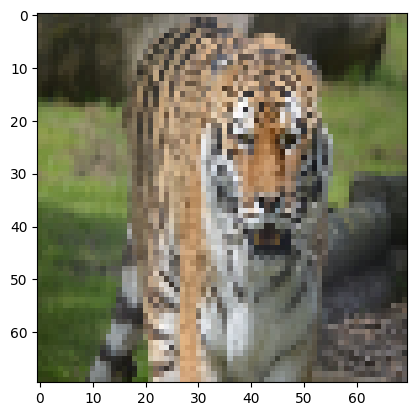

1/1 [==============================] - 0s 49ms/step
jaguar




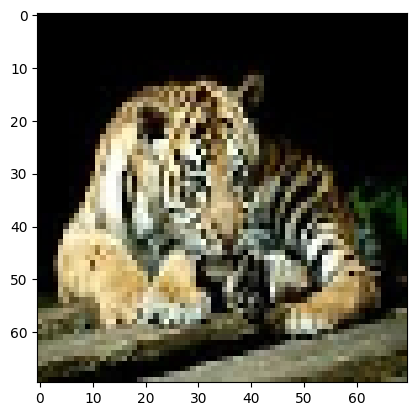

1/1 [==============================] - 0s 47ms/step
jaguar




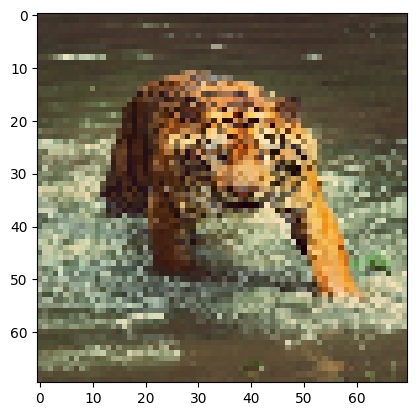

1/1 [==============================] - 0s 41ms/step
jaguar




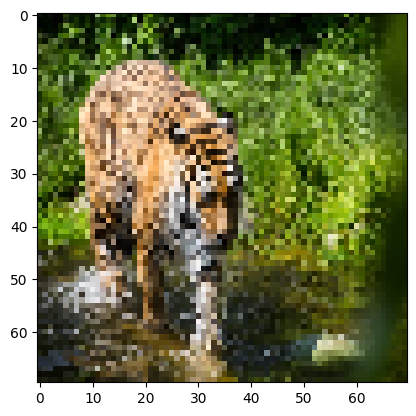

1/1 [==============================] - 0s 46ms/step
jaguar




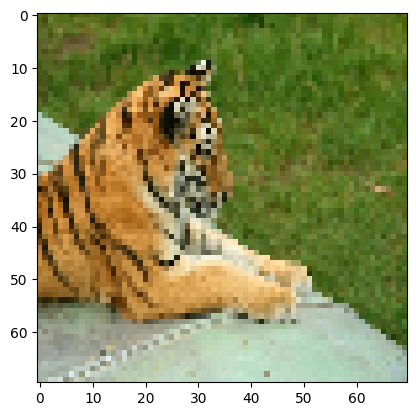

1/1 [==============================] - 0s 40ms/step
jaguar




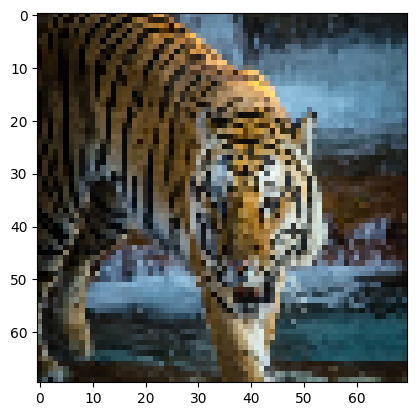

1/1 [==============================] - 0s 44ms/step
jaguar




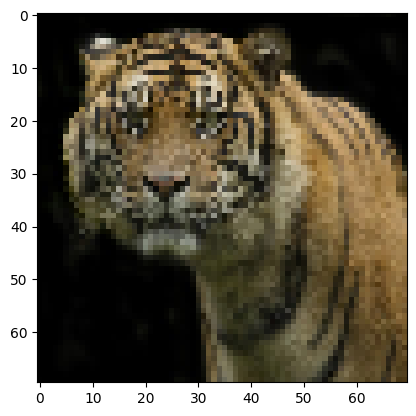

1/1 [==============================] - 0s 42ms/step
jaguar




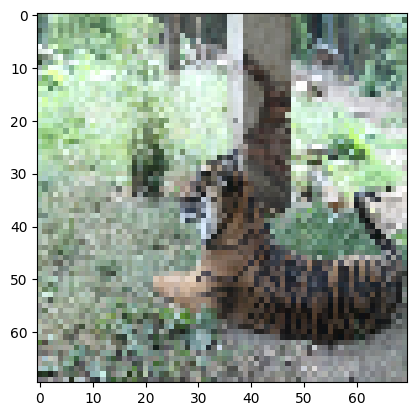

1/1 [==============================] - 0s 42ms/step
jaguar




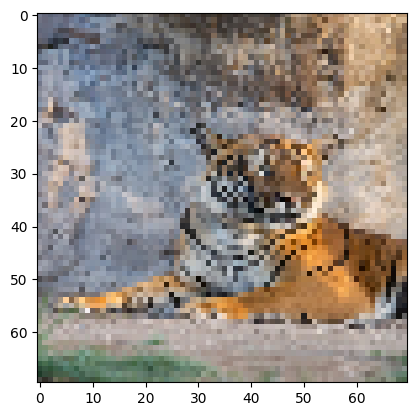

1/1 [==============================] - 0s 47ms/step
jaguar




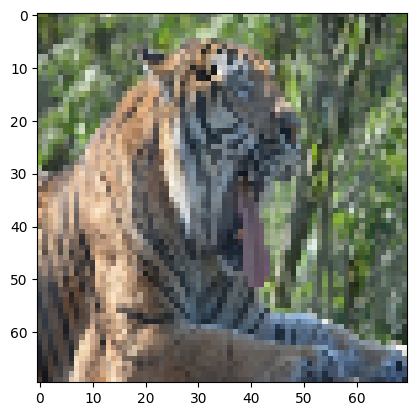

1/1 [==============================] - 0s 46ms/step
jaguar




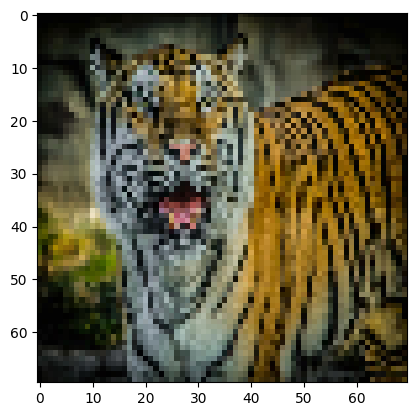

1/1 [==============================] - 0s 62ms/step
jaguar




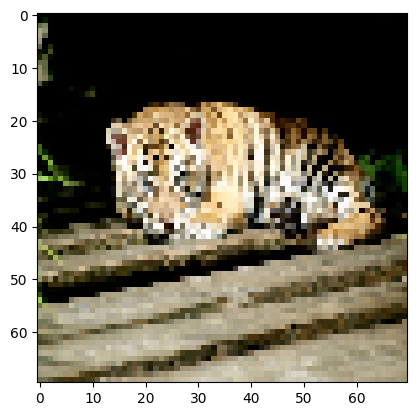

1/1 [==============================] - 0s 62ms/step
jaguar




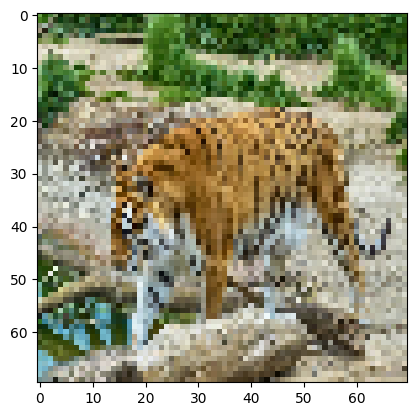

1/1 [==============================] - 0s 48ms/step
jaguar




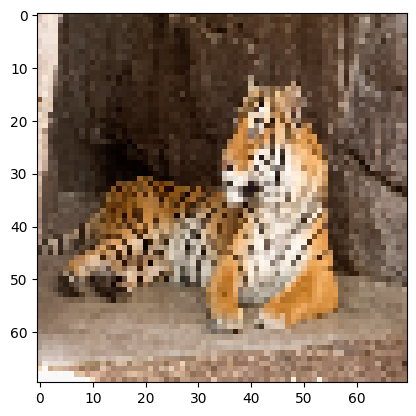

1/1 [==============================] - 0s 42ms/step
jaguar




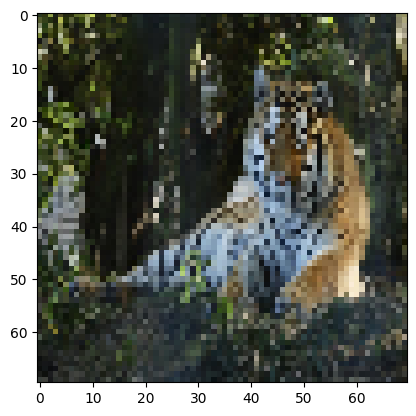

1/1 [==============================] - 0s 76ms/step
jaguar




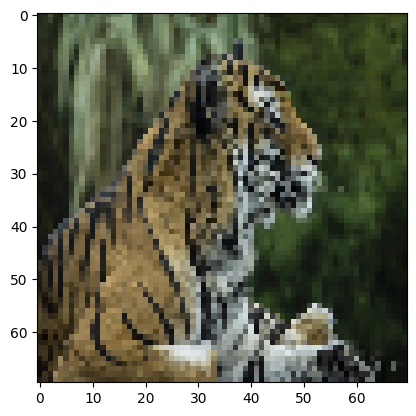

1/1 [==============================] - 0s 58ms/step
jaguar




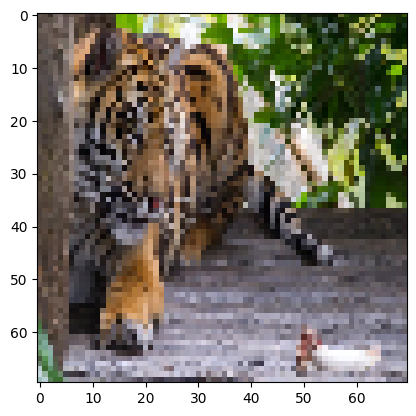

1/1 [==============================] - 0s 49ms/step
jaguar




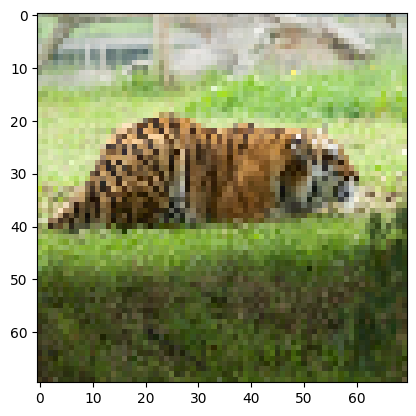

1/1 [==============================] - 0s 46ms/step
jaguar




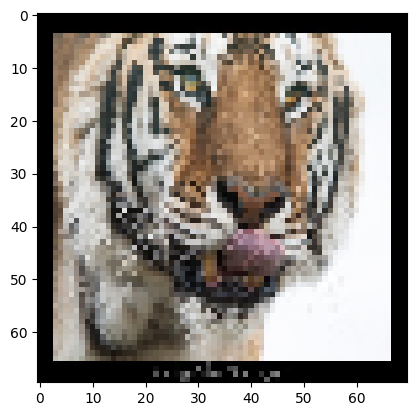

1/1 [==============================] - 0s 64ms/step
jaguar




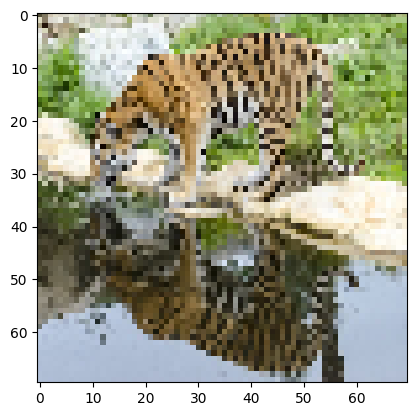

1/1 [==============================] - 0s 51ms/step
jaguar




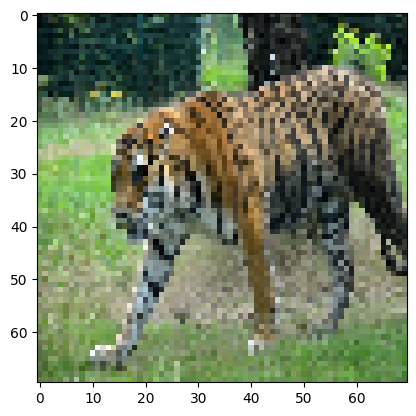

1/1 [==============================] - 0s 63ms/step
jaguar




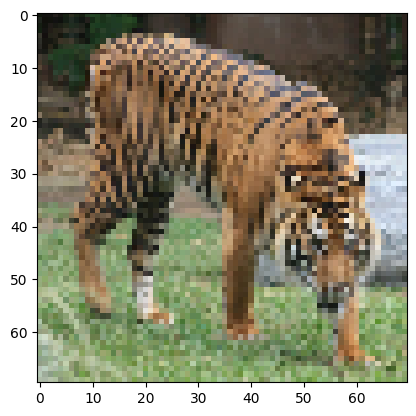

1/1 [==============================] - 0s 53ms/step
jaguar




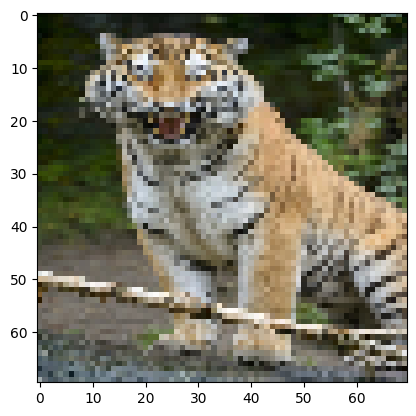

1/1 [==============================] - 0s 46ms/step
jaguar




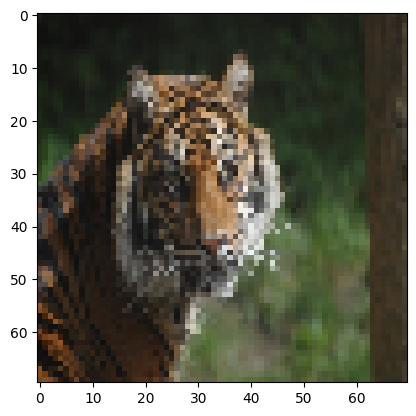

1/1 [==============================] - 0s 41ms/step
jaguar




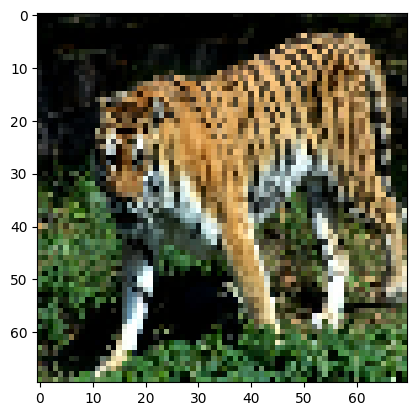

1/1 [==============================] - 0s 56ms/step
jaguar




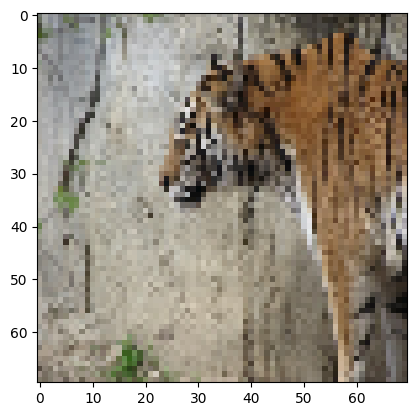

1/1 [==============================] - 0s 40ms/step
jaguar




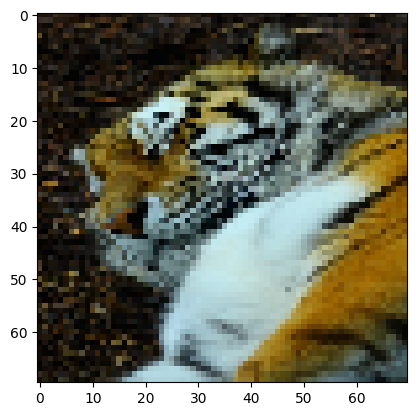

1/1 [==============================] - 0s 41ms/step
jaguar




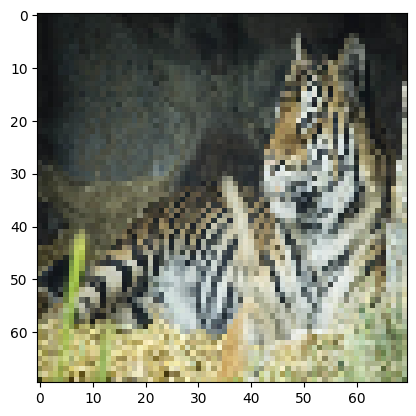

1/1 [==============================] - 0s 40ms/step
jaguar




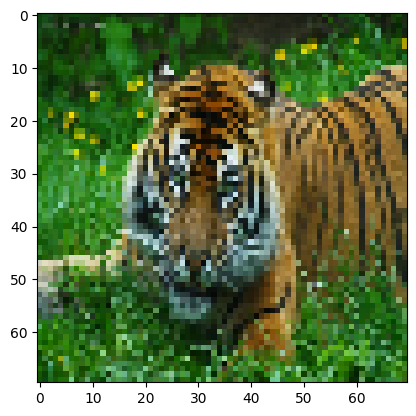

1/1 [==============================] - 0s 80ms/step
jaguar




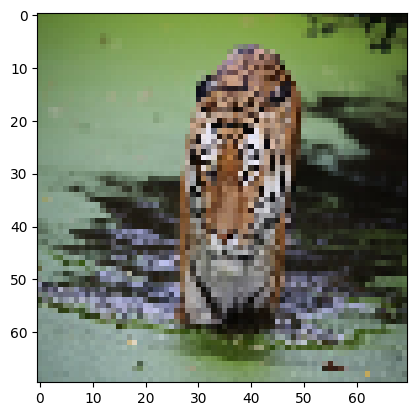

1/1 [==============================] - 0s 41ms/step
jaguar




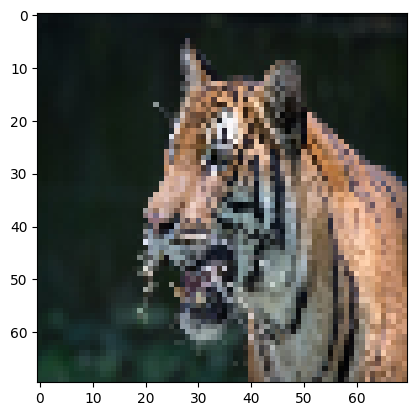

1/1 [==============================] - 0s 41ms/step
jaguar




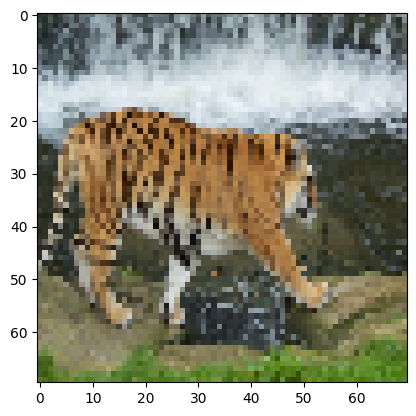

1/1 [==============================] - 0s 42ms/step
jaguar




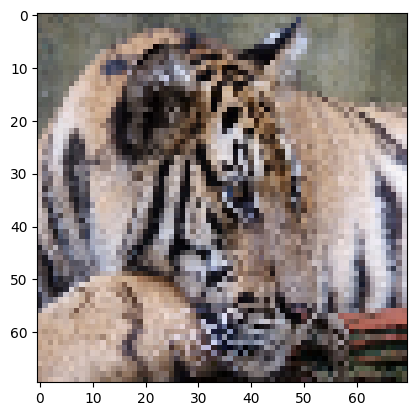

1/1 [==============================] - 0s 44ms/step
jaguar




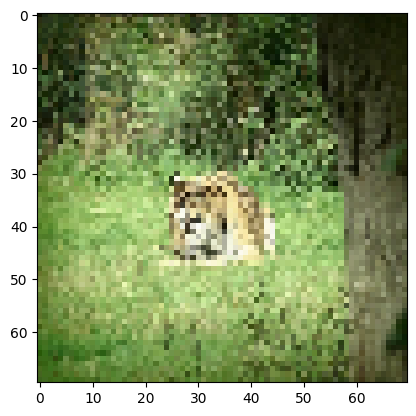

1/1 [==============================] - 0s 40ms/step
jaguar




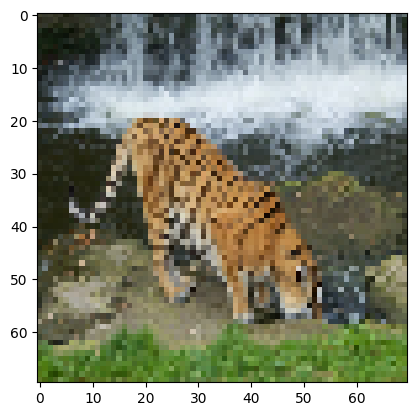

1/1 [==============================] - 0s 43ms/step
jaguar




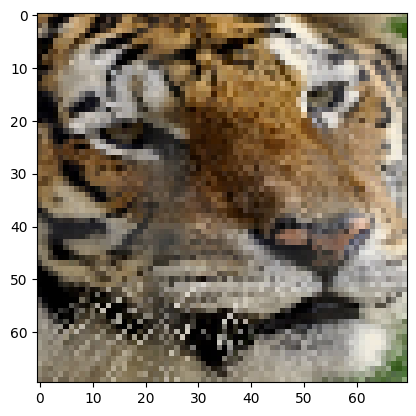

1/1 [==============================] - 0s 40ms/step
jaguar




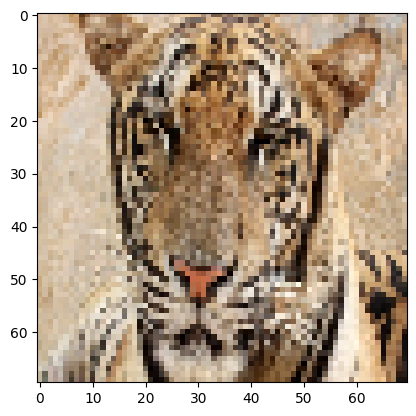

1/1 [==============================] - 0s 44ms/step
jaguar




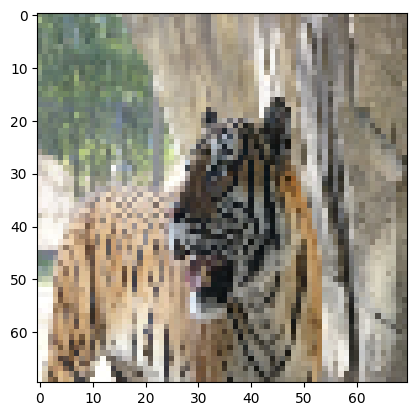

1/1 [==============================] - 0s 39ms/step
jaguar




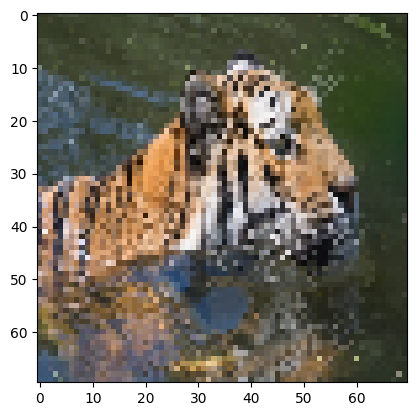

1/1 [==============================] - 0s 51ms/step
jaguar




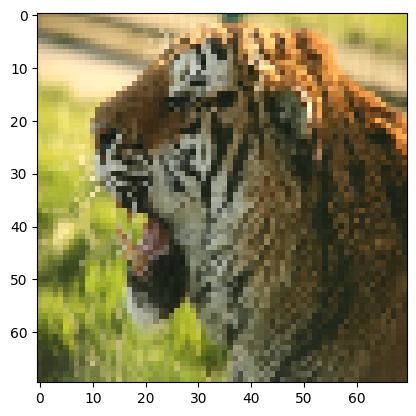

1/1 [==============================] - 0s 41ms/step
jaguar




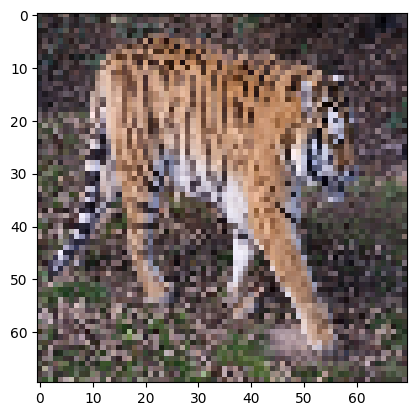

1/1 [==============================] - 0s 44ms/step
jaguar




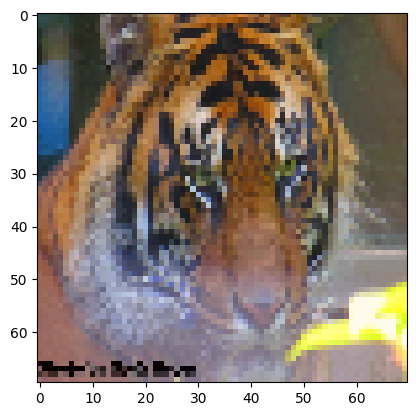

1/1 [==============================] - 0s 55ms/step
jaguar




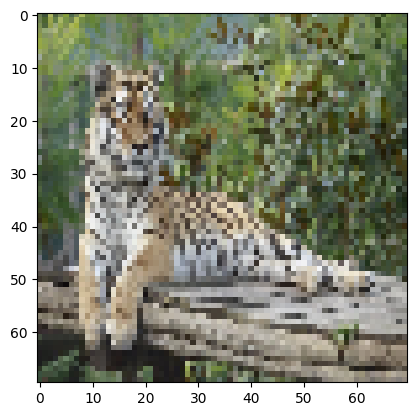

1/1 [==============================] - 0s 52ms/step
jaguar




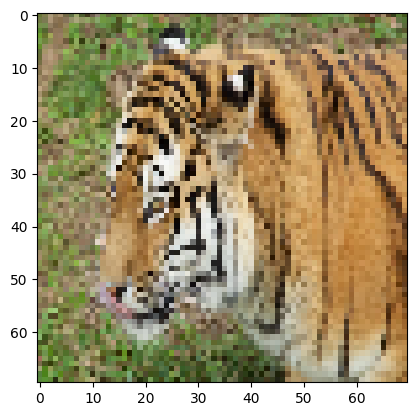

1/1 [==============================] - 0s 81ms/step
jaguar




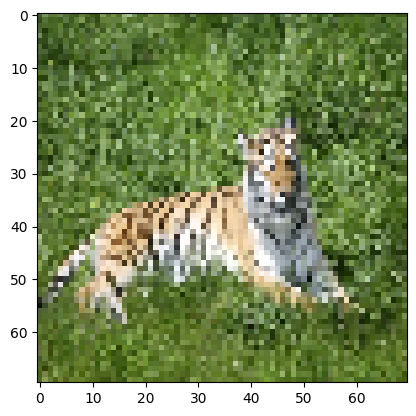

1/1 [==============================] - 0s 56ms/step
jaguar




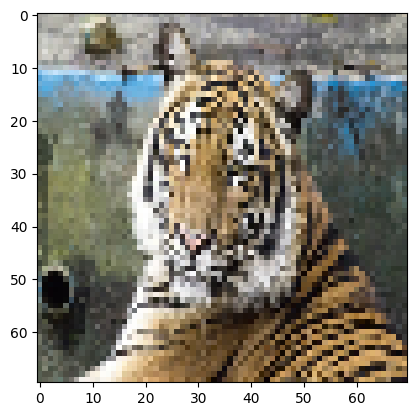

1/1 [==============================] - 0s 79ms/step
jaguar




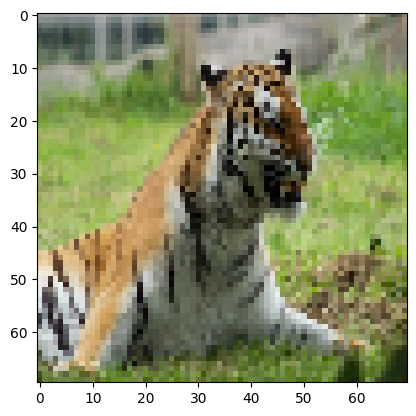

1/1 [==============================] - 0s 50ms/step
jaguar




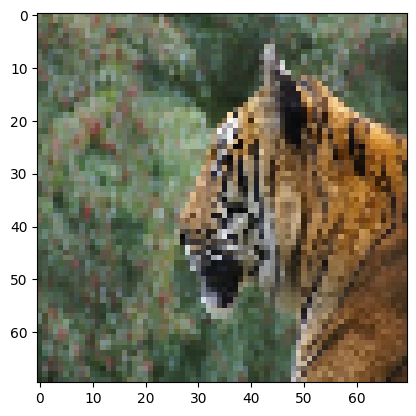

1/1 [==============================] - 0s 40ms/step
jaguar




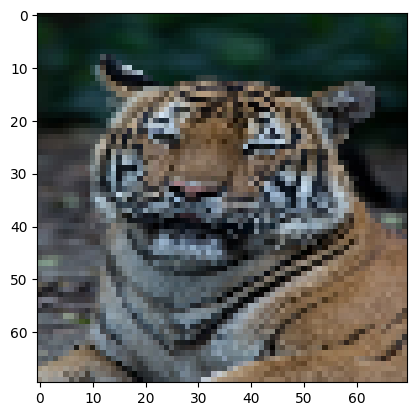

1/1 [==============================] - 0s 95ms/step
jaguar




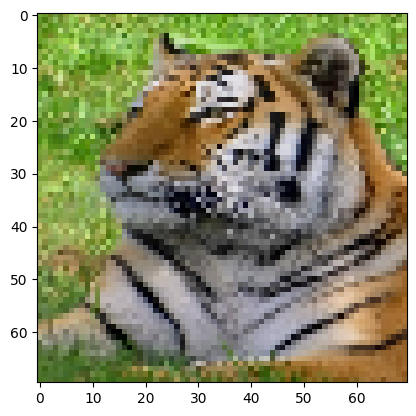

1/1 [==============================] - 0s 56ms/step
jaguar




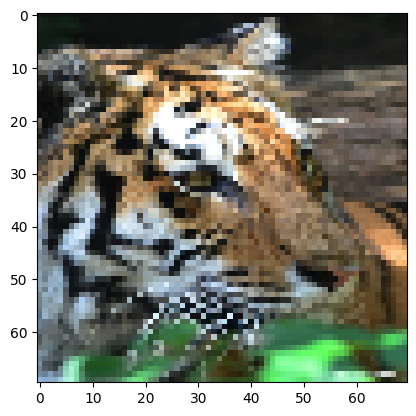

1/1 [==============================] - 0s 50ms/step
jaguar




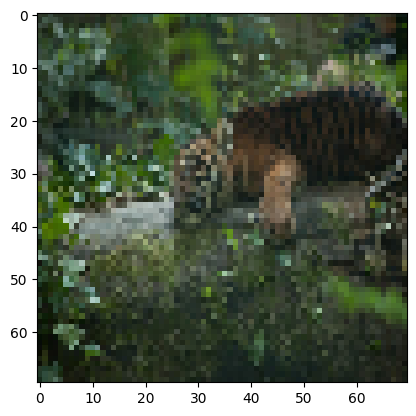

1/1 [==============================] - 0s 46ms/step
jaguar




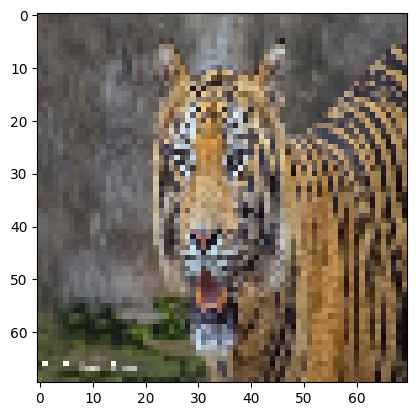

1/1 [==============================] - 0s 59ms/step
jaguar




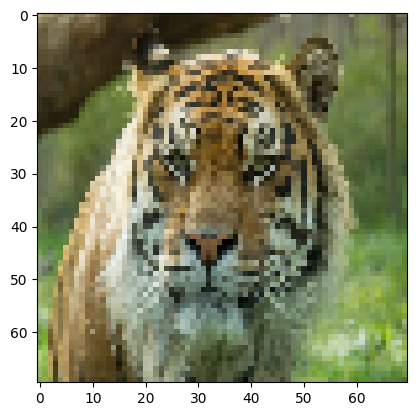

1/1 [==============================] - 0s 63ms/step
jaguar


cheetah :  0
hyena :  27
jaguar :  373
tiger :  0


In [6]:
classCount = [0] * num_of_classes

for i in os.listdir(testing_path):
  if(testing_path+'//'+i!=testing_path+'//.ipynb_checkpoints'):
    img = image.load_img(testing_path+'//'+i, target_size=(img_resize,img_resize), grayscale=grayscale)
    plt.imshow(img)
    plt.show()

    X = image.img_to_array(img)
    X = np.expand_dims(X, axis=0)
    images = np.vstack([X])
    val = model.predict(images)
    listVal = val.flatten().tolist()
    index = listVal.index(max(listVal))
    print(folderList[index])
    print("\n")
    classCount[index] += 1

for i in range(num_of_classes):
  if(folderList[i] != '.ipynb_checkpoints'):
    print(folderList[i], ": ",classCount[i])